# Bus Duration Prediction: Feature Engineering and Modeling

## Setup

### Importing Packages

In [3]:
import pandas as pd 
import numpy as np
import json
import os
import seaborn as sns 
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

import sys
sys.path.append('../analysis_src')

from dataframe_utils import dataframe_info
from viz_utils import plot_weather_correlations, plot_correlation_matrix, visualize_model_comparison
from feature_selection import FeatureImportanceAnalyzer


### Loading Data

In [4]:
# Define base paths
PROCESSED_PATH = os.path.join('..', '..', 'data', 'processed')
TRIPS_PATH = os.path.join(PROCESSED_PATH, 'trips_data2.csv')
WEATHER_PATH = os.path.join(PROCESSED_PATH, 'processed_weather_features.csv')

# Read data directly
trip_df = pd.read_csv(TRIPS_PATH)
weather_df = pd.read_csv(WEATHER_PATH)

In [14]:
dataframe_info(trip_df)

e:\bus-schedule-app\notebooks\02_modeling\../analysis_src\dataframe_utils.py:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  report = pd.concat([report, pd.DataFrame({'Column': [column],


,Column,Data Type,Unique Count,Unique Sample,Missing Values,Missing Percentage
0,route_id,int64,2,"[10, 11]",0,0.0
1,start_time,datetime64[ns],1060,"[2024-02-01 06:54:08, 2024-02-01 07:00:07, 202...",0,0.0
2,origin_id,object,7,"[BT01, BT02, BT03, BT04, BT05]",0,0.0
3,duration,float64,483,"[5.983333333333333, 9.616666666666667, 1.35, 3...",0,0.0
4,distance,float64,15,"[1.3487946268033535, 0.9140332362197978, 1.491...",0,0.0
5,month_name,category,8,"['February', 'March', 'April', 'May', 'June'] ...",0,0.0
6,day_of_week_sin,float64,5,"[0.43388373911755823, -0.433883739117558, 0.0,...",0,0.0
7,day_of_week_cos,float64,5,"[-0.900968867902419, -0.9009688679024191, 1.0,...",0,0.0
8,minutes_sin,float64,170,"[0.42261826174069944, 0.5150380749100542, 0.64...",0,0.0
9,minutes_cos,float64,167,"[0.9063077870366499, 0.8571673007021123, 0.766...",0,0.0


### Data Preprocessing

In [5]:
def preprocess_trip_data(trip_df):
    def calculate_operation_minutes(start_time):
        morning_start = pd.Timestamp(start_time.date()).replace(hour=6, minute=30)
        afternoon_start = pd.Timestamp(start_time.date()).replace(hour=15, minute=0)

        if start_time < afternoon_start:  # Morning session
            return max(0, (start_time - morning_start).total_seconds() // 60 + 1)
        else:  # Afternoon session
            return (start_time - afternoon_start).total_seconds() // 60 + 181

    trip_df = trip_df.loc[trip_df['duration']>=1].copy() 

    # Convert start_time and end_time to datetime
    trip_df['start_time'] = pd.to_datetime(trip_df['start_time'])
    trip_df['end_time'] = pd.to_datetime(trip_df['end_time'])

    # Extract day of week and month
    trip_df['day_of_week'] = trip_df['start_time'].dt.dayofweek
    trip_df['month_name'] = trip_df['start_time'].dt.month_name().astype('category')
    
    # Cyclic encoding for month
    trip_df['month_num'] = trip_df['start_time'].dt.month
    trip_df['month_sin'] = np.sin(trip_df['month_num'] * (2 * np.pi / 12))
    trip_df['month_cos'] = np.cos(trip_df['month_num'] * (2 * np.pi / 12))

    # Cyclic encoding for day of week
    trip_df['day_of_week_sin'] = np.sin(trip_df['day_of_week'] * (2 * np.pi / 7))
    trip_df['day_of_week_cos'] = np.cos(trip_df['day_of_week'] * (2 * np.pi / 7))

    # Calculate minutes of operation
    trip_df['minutes_of_operation'] = trip_df['start_time'].apply(calculate_operation_minutes)

    # Cyclic encoding for minutes of operation
    trip_df['minutes_sin'] = np.sin(2 * np.pi * trip_df['minutes_of_operation'] / 360)
    trip_df['minutes_cos'] = np.cos(2 * np.pi * trip_df['minutes_of_operation'] / 360)

    #rename columns
    trip_df = trip_df.rename(columns={'start_stop_id': 'origin_id', 'end_stop_id': 'destination_id'})

    # remove processing overheads
    trip_df = trip_df.drop(columns=['duration_minutes', 'start_stop', 'end_stop', 'day_of_week', 'minutes_of_operation',
    'end_time', 'start_hour', 'end_hour', 'start_lat', 'start_lon', 'end_lat', 'end_lon', 'destination_id'])

    return trip_df

trip_df = preprocess_trip_data(trip_df)

In [6]:
def preprocess_weather_data(df):
    # Convert date and time columns to datetime
    df['datetime'] = pd.to_datetime(df['date'] + ' ' + df['time'])
    
    # Ensure timezone-naive datetime
    if df['datetime'].dt.tz is not None:
        df['datetime'] = df['datetime'].dt.tz_localize(None)
    
    # Drop processing overheads
    columns_to_drop = ['date', 'time', 'month', 'hour', 'hour_sin', 'hour_cos', 'month_num', 'month_num_sin', 'month_num_cos', 
                       'visibility_cleaned', 'humidity_cleaned', 'wind_speed_cleaned','month', 'day']
    df = df.drop(columns=columns_to_drop)
    missing_cols = df.columns[df.isnull().any()].tolist()
    print("\nDropping columns with missing values:", missing_cols)
    df = df.drop(columns=missing_cols)
    return df

def merge_weather_data(trip_df, weather_df):
    # Sort both dataframes
    trip_df = trip_df.sort_values('start_time')
    weather_df = weather_df.sort_values('datetime')

    # Print sample data before merge
    print("Trip data sample:")
    print(trip_df['start_time'].head())
    print("\nWeather data sample:")
    print(weather_df['datetime'].head())
    print("\nWeather data intervals:")
    print(weather_df['datetime'].diff().value_counts().head())

    # Perform merge
    try:
        merged_df = pd.merge_asof(
            trip_df,
            weather_df,
            left_on='start_time',
            right_on='datetime',
            direction='nearest',
            tolerance=pd.Timedelta(hours=2)
        )
        
        # Verify merge results
        print("\nMerge results:")
        print(f"Original trip_df shape: {trip_df.shape}")
        print(f"Original weather_df shape: {weather_df.shape}")
        print(f"Merged df shape: {merged_df.shape}")
        
        # Check sample of merged data
        print("\nSample of merged data:")
        print(merged_df[['start_time', 'datetime', 'temperature', 'humidity']].head())
        
        # Check for NaN values
        nan_percentage = merged_df.isna().mean() * 100
        print("\nColumns with NaN values (if any):")
        print(nan_percentage[nan_percentage > 0].sort_values(ascending=False))
        
    except Exception as e:
        print(f"Error during merge: {str(e)}")
        # Print additional debugging info
        print("\nTrip DataFrame Info:")
        print(trip_df['start_time'].dtype)
        print("\nWeather DataFrame Info:")
        print(weather_df['datetime'].dtype)
    
    #remove processing overheads
    merged_df = merged_df.drop(columns=['start_time', 'datetime'])
    return merged_df

# Preprocess weather data
weather_df = preprocess_weather_data(weather_df)

# Call the merge function with the dataframes
merged_df = merge_weather_data(trip_df, weather_df)


Dropping columns with missing values: ['temp_rolling_std', 'temp_change', 'pressure_change']
Trip data sample:
0   2024-02-01 06:54:08
1   2024-02-01 07:00:07
2   2024-02-01 07:09:44
3   2024-02-01 07:11:05
4   2024-02-01 07:15:01
Name: start_time, dtype: datetime64[ns]

Weather data sample:
0   2024-02-01 00:00:00
1   2024-02-01 03:00:00
2   2024-02-01 06:00:00
3   2024-02-01 09:00:00
4   2024-02-01 12:00:00
Name: datetime, dtype: datetime64[ns]

Weather data intervals:
datetime
0 days 03:00:00    1941
0 days 06:00:00       1
Name: count, dtype: int64

Merge results:
Original trip_df shape: (1060, 13)
Original weather_df shape: (1943, 17)
Merged df shape: (1060, 30)

Sample of merged data:
           start_time            datetime  temperature  humidity
0 2024-02-01 06:54:08 2024-02-01 06:00:00           18        90
1 2024-02-01 07:00:07 2024-02-01 06:00:00           18        90
2 2024-02-01 07:09:44 2024-02-01 06:00:00           18        90
3 2024-02-01 07:11:05 2024-02-01 06:00:

## Correlation Analysis

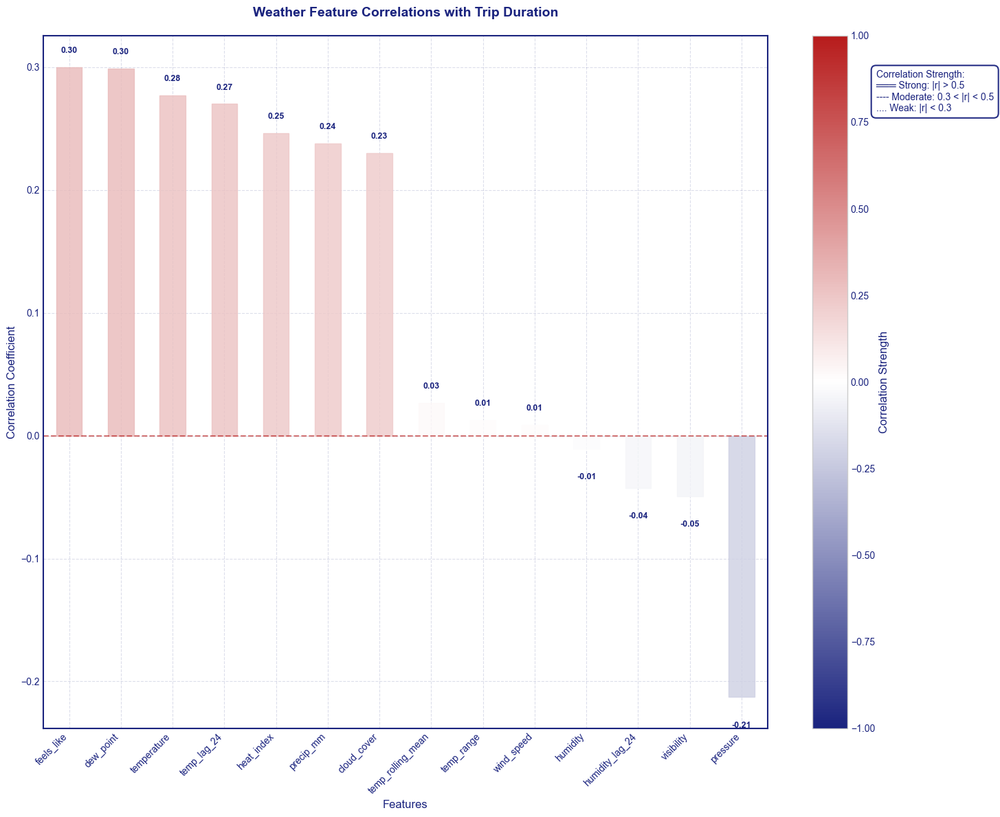

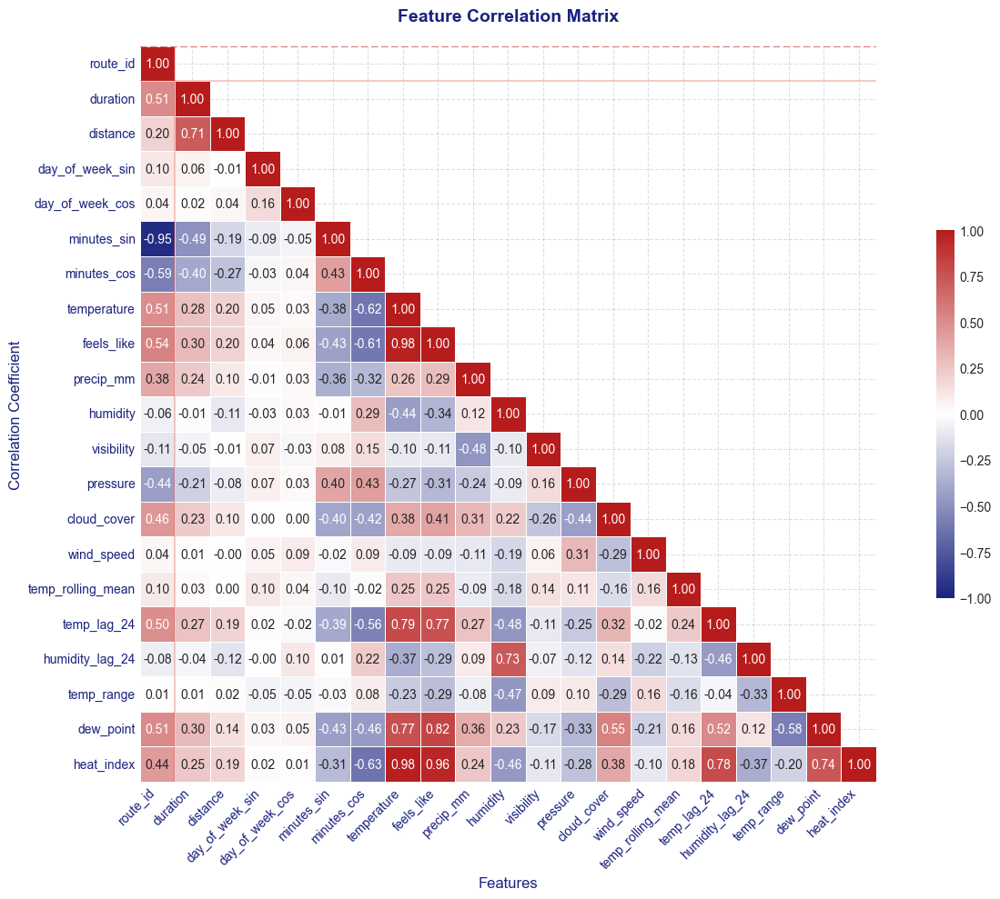

In [6]:
# For weather correlations
fig, ax = plot_weather_correlations(weather_df, merged_df)

# For correlation matrix
fig, ax = plot_correlation_matrix(merged_df, target_col='duration')

## Dropping Some Features 

# Variance Inflation Factor Analysis

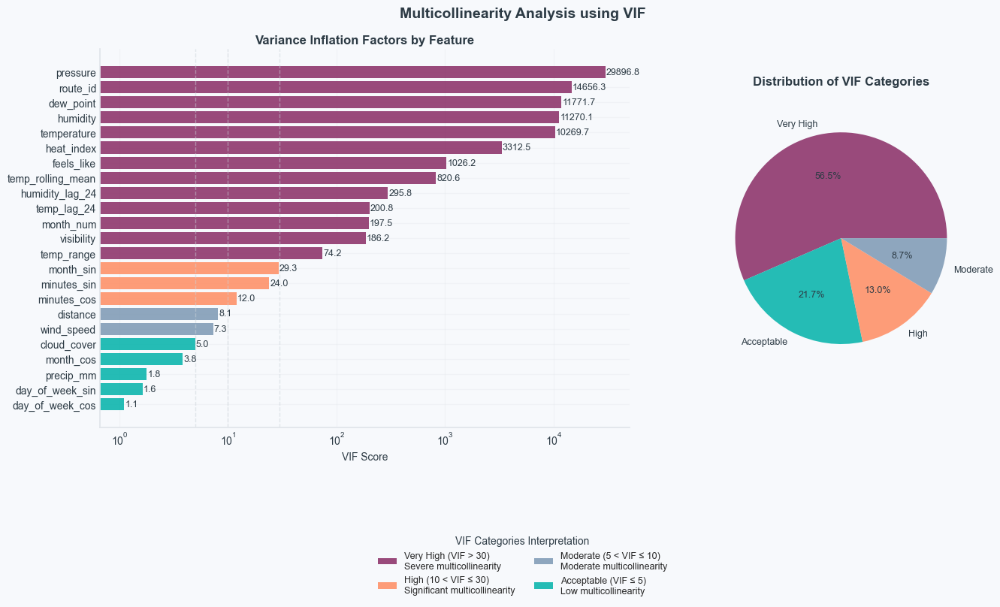


📊 VIF Analysis Summary:

#892B64 Very High Multicollinearity:
  • temp_range: 74.22
  • visibility: 186.25
  • month_num: 197.47
  • temp_lag_24: 200.83
  • humidity_lag_24: 295.79
  • temp_rolling_mean: 820.56
  • feels_like: 1026.24
  • heat_index: 3312.50
  • temperature: 10269.66
  • humidity: 11270.14
  • dew_point: 11771.67
  • route_id: 14656.31
  • pressure: 29896.81

#FF8C61 High Multicollinearity:
  • minutes_cos: 12.01
  • minutes_sin: 24.05
  • month_sin: 29.26

#7C98B3 Moderate Multicollinearity:
  • wind_speed: 7.30
  • distance: 8.14

#00B2A9 Acceptable Multicollinearity:
  • day_of_week_cos: 1.11
  • day_of_week_sin: 1.63
  • precip_mm: 1.78
  • month_cos: 3.82
  • cloud_cover: 4.99

🔍 Recommendations:

Consider removing or combining these high-VIF features:
  • minutes_cos
  • minutes_sin
  • month_sin
  • temp_range
  • visibility
  • month_num
  • temp_lag_24
  • humidity_lag_24
  • temp_rolling_mean
  • feels_like
  • heat_index
  • temperature
  • humidity
  • dew

In [7]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calculate_vif(df, target_column, figsize=(15, 8)):
    """
    Calculate and visualize Variance Inflation Factors (VIF) for features.
    """
    # Create a dataframe with only numeric columns, excluding the target
    numeric_df = df.select_dtypes(include=[np.number]).drop(columns=[target_column])
    
    # Calculate VIF for each feature
    vif_data = pd.DataFrame()
    vif_data["Feature"] = numeric_df.columns
    vif_data["VIF"] = [variance_inflation_factor(numeric_df.values, i) 
                       for i in range(numeric_df.shape[1])]
    
    # Sort by VIF value
    vif_data = vif_data.sort_values('VIF', ascending=True)
    
    # Create VIF categories for coloring
    def get_vif_category(vif):
        if vif < 5:
            return 'Acceptable'
        elif vif < 10:
            return 'Moderate'
        elif vif < 30:
            return 'High'
        else:
            return 'Very High'
    
    vif_data['Category'] = vif_data['VIF'].apply(get_vif_category)
    
    # Define a modern, sophisticated color scheme
    colors = {
        'Acceptable': '#00B2A9',    # Teal - calm, trustworthy
        'Moderate': '#7C98B3',      # Steel blue - neutral, professional
        'High': '#FF8C61',          # Coral - warning, attention
        'Very High': '#892B64'      # Burgundy - serious concern
    }
    
    # Define complementary colors for styling
    style_colors = {
        'background': '#F7F9FC',    # Light blue-grey background
        'text': '#2D3B45',          # Dark blue-grey text
        'grid': '#E1E5EA',          # Soft grey grid
        'reference': '#CBD2D9'      # Medium grey reference lines
    }
    
    # Set figure style
    plt.style.use('seaborn-v0_8-white')
    fig = plt.figure(figsize=figsize, facecolor=style_colors['background'])
    gs = fig.add_gridspec(1, 2, width_ratios=[2, 1], wspace=0.2)
    
    # Bar plot with enhanced styling
    ax1 = fig.add_subplot(gs[0])
    ax1.set_facecolor(style_colors['background'])
    bars = ax1.barh(vif_data['Feature'], vif_data['VIF'], 
                    color=[colors[cat] for cat in vif_data['Category']],
                    alpha=0.85)
    
    # Add value labels with improved styling
    for bar in bars:
        width = bar.get_width()
        ax1.text(width * 1.02, bar.get_y() + bar.get_height()/2,
                f'{width:.1f}', 
                ha='left', va='center',
                color=style_colors['text'],
                fontsize=9,
                fontweight='medium')
    
    # Customize bar plot
    ax1.set_title('Variance Inflation Factors by Feature', 
                  pad=5, fontsize=12, color=style_colors['text'],
                  fontweight='bold')
    ax1.set_xlabel('VIF Score', fontsize=10, color=style_colors['text'])
    ax1.grid(True, alpha=0.3, color=style_colors['grid'])
    ax1.set_xscale('log')
    
    # Style the axes
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)
    ax1.spines['left'].set_color(style_colors['grid'])
    ax1.spines['bottom'].set_color(style_colors['grid'])
    ax1.tick_params(colors=style_colors['text'])
    
    # Add reference lines with enhanced styling
    reference_lines = [5, 10, 30]
    for line in reference_lines:
        ax1.axvline(x=line, color=style_colors['reference'], 
                    linestyle='--', alpha=0.5, linewidth=1)
    
    # Pie chart with modern styling
    ax2 = fig.add_subplot(gs[1])
    ax2.set_facecolor(style_colors['background'])
    category_counts = vif_data['Category'].value_counts()
    wedges, texts, autotexts = ax2.pie(category_counts,
                                      labels=category_counts.index,
                                      colors=[colors[cat] for cat in category_counts.index],
                                      autopct='%1.1f%%',
                                      textprops={'fontsize': 9,
                                                'color': style_colors['text']},
                                      wedgeprops={'alpha': 0.85})
    
    # Customize pie chart
    ax2.set_title('Distribution of VIF Categories', 
                  pad=20, fontsize=12, color=style_colors['text'],
                  fontweight='bold')
    
    # Create custom legend with modern styling
    legend_elements = [
        plt.Rectangle((0,0),1,1, facecolor=colors['Very High'], alpha=0.85,
                     label='Very High (VIF > 30)\nSevere multicollinearity'),
        plt.Rectangle((0,0),1,1, facecolor=colors['High'], alpha=0.85,
                     label='High (10 < VIF ≤ 30)\nSignificant multicollinearity'),
        plt.Rectangle((0,0),1,1, facecolor=colors['Moderate'], alpha=0.85,
                     label='Moderate (5 < VIF ≤ 10)\nModerate multicollinearity'),
        plt.Rectangle((0,0),1,1, facecolor=colors['Acceptable'], alpha=0.85,
                     label='Acceptable (VIF ≤ 5)\nLow multicollinearity')
    ]
    
    # Place legend with enhanced styling
    legend = fig.legend(handles=legend_elements, 
                       loc='center', 
                       bbox_to_anchor=(0.5, 0.02),
                       ncol=2,
                       title='VIF Categories Interpretation',
                       title_fontsize=10,
                       fontsize=9,
                       borderaxespad=0)
    
    # Style legend
    legend.get_frame().set_facecolor(style_colors['background'])
    legend.get_frame().set_alpha(0.9)
    legend.get_frame().set_linewidth(0)
    plt.setp(legend.get_title(), color=style_colors['text'])
    
    # Add main title with modern styling
    plt.suptitle('Multicollinearity Analysis using VIF', 
                 fontsize=14, y=0.95, color=style_colors['text'],
                 fontweight='bold')
    
    # Adjust layout
    plt.subplots_adjust(bottom=0.25)
    
    # Set figure background
    fig.patch.set_facecolor(style_colors['background'])
    
    plt.show()
    
    # Print detailed analysis
    print("\n📊 VIF Analysis Summary:")
    print("=" * 50)
    
    # Group features by category
    for category in ['Very High', 'High', 'Moderate', 'Acceptable']:
        features = vif_data[vif_data['Category'] == category]
        if not features.empty:
            print(f"\n{colors[category]} {category} Multicollinearity:")
            for _, row in features.iterrows():
                print(f"  • {row['Feature']}: {row['VIF']:.2f}")
    
    # Recommendations
    print("\n🔍 Recommendations:")
    high_vif_features = vif_data[vif_data['VIF'] > 10]['Feature'].tolist()
    if high_vif_features:
        print("\nConsider removing or combining these high-VIF features:")
        for feature in high_vif_features:
            print(f"  • {feature}")
    else:
        print("\n✅ All features have acceptable VIF scores (< 10)")
    
    return vif_data

# Calculate VIF scores with enhanced visualization
vif_results = calculate_vif(merged_df, 'duration')

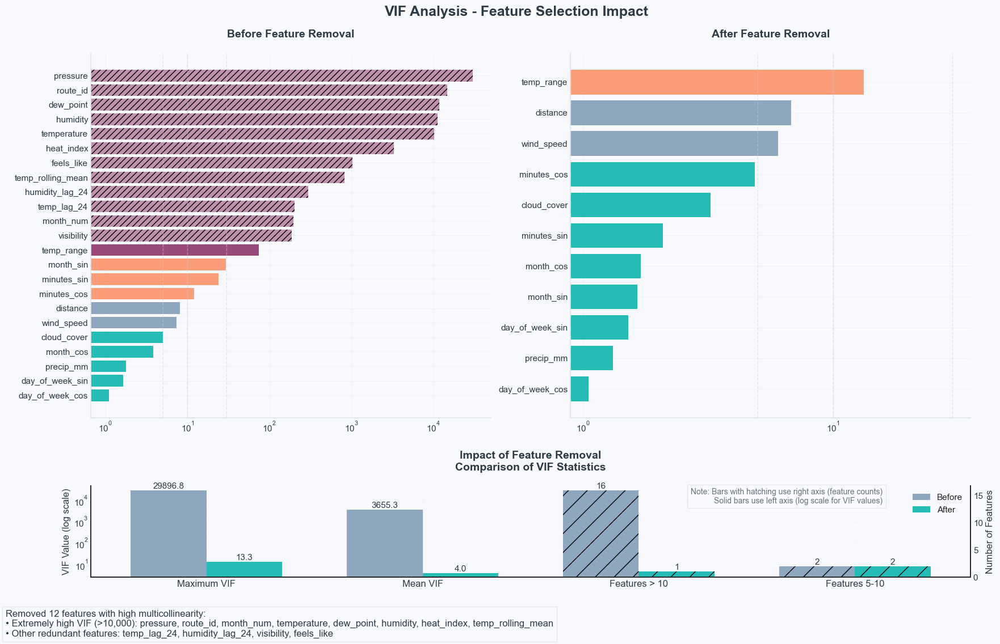


📊 VIF Analysis Summary:
Original dataset shape: (1060, 28)
Filtered dataset shape: (1060, 16)

Features removed: 12
Maximum VIF before: 29896.81
Maximum VIF after: 13.27


In [8]:
def get_vif_category(vif):
    """
    Categorize VIF values into interpretable groups.
    """
    if vif < 5:
        return 'Acceptable'
    elif vif < 10:
        return 'Moderate'
    elif vif < 30:
        return 'High'
    else:
        return 'Very High'
    
def compare_vif_analysis(original_df, features_to_drop, target_column='duration', figsize=(20, 12)):
    """
    Compare VIF analysis before and after feature removal with enhanced visualization.
    """
    # Style colors (matching previous visualization)
    style_colors = {
        'background': '#F7F9FC',    # Light blue-grey background
        'text': '#2D3B45',          # Dark blue-grey text
        'grid': '#E1E5EA',          # Soft grey grid
        'reference': '#CBD2D9',     # Medium grey reference lines
        'highlight': '#FF8C61'      # Highlight color for removed features
    }
    
    # Create filtered dataframe
    filtered_df = original_df.drop(columns=features_to_drop).copy()
    
    # Calculate VIF for both datasets
    vif_before = calculate_vif_scores(original_df, target_column)
    vif_after = calculate_vif_scores(filtered_df, target_column)
    
    # Set up the figure
    plt.style.use('seaborn-v0_8-white')
    fig = plt.figure(figsize=figsize, facecolor=style_colors['background'])
    gs = fig.add_gridspec(2, 2, height_ratios=[4, 1], width_ratios=[1, 1], hspace=0.3, wspace=0.2)
    
    # Plot before and after VIF comparisons
    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[0, 1])
    
    # Plot VIF before
    plot_vif_bars(vif_before, ax1, "Before Feature Removal", 
                  style_colors, features_to_drop)
    
    # Plot VIF after
    plot_vif_bars(vif_after, ax2, "After Feature Removal", 
                  style_colors)
    
    # Add summary statistics
    ax_stats = fig.add_subplot(gs[1, :])
    plot_summary_statistics(vif_before, vif_after, features_to_drop, ax_stats, style_colors)
    
    # Main title
    plt.suptitle('VIF Analysis - Feature Selection Impact', 
                 fontsize=18, y=0.95, color=style_colors['text'],
                 fontweight='bold')
    
    # Add feature removal summary
    summary_text = (
        f"Removed {len(features_to_drop)} features with high multicollinearity:\n"
        f"• Extremely high VIF (>10,000): {', '.join(features_to_drop[:8])}\n"
        f"• Other redundant features: {', '.join(features_to_drop[8:])}"
    )
    
    fig.text(0.05, 0.02, summary_text, 
             fontsize=12, color=style_colors['text'],
             ha='left', va='bottom',
             bbox=dict(facecolor=style_colors['background'], 
                      edgecolor=style_colors['grid'], 
                      alpha=0.9))
    
    plt.show()
    
    # Print detailed statistics
    print("\n📊 VIF Analysis Summary:")
    print("=" * 50)
    print(f"Original dataset shape: {original_df.shape}")
    print(f"Filtered dataset shape: {filtered_df.shape}")
    print(f"\nFeatures removed: {len(features_to_drop)}")
    print(f"Maximum VIF before: {vif_before['VIF'].max():.2f}")
    print(f"Maximum VIF after: {vif_after['VIF'].max():.2f}")
    
    return vif_after

def calculate_vif_scores(df, target_column):
    """Helper function to calculate VIF scores"""
    numeric_df = df.select_dtypes(include=[np.number]).drop(columns=[target_column])
    vif_data = pd.DataFrame({
        "Feature": numeric_df.columns,
        "VIF": [variance_inflation_factor(numeric_df.values, i) 
                for i in range(numeric_df.shape[1])]
    }).sort_values('VIF', ascending=True)
    
    vif_data['Category'] = vif_data['VIF'].apply(get_vif_category)
    return vif_data

def plot_vif_bars(vif_data, ax, title, style_colors, highlight_features=None):
    """Helper function to plot VIF bars with consistent styling"""
    colors = {
        'Acceptable': '#00B2A9',    # Teal
        'Moderate': '#7C98B3',      # Steel blue
        'High': '#FF8C61',          # Coral
        'Very High': '#892B64'      # Burgundy
    }
    
    bars = ax.barh(vif_data['Feature'], vif_data['VIF'], 
                   color=[colors[cat] for cat in vif_data['Category']],
                   alpha=0.85)
    
    # Highlight removed features if specified
    if highlight_features:
        for bar, feature in zip(bars, vif_data['Feature']):
            if feature in highlight_features:
                bar.set_alpha(0.5)
                bar.set_hatch('///')
    
    # Style the plot
    ax.set_facecolor(style_colors['background'])
    ax.set_xscale('log')
    ax.grid(True, alpha=0.3, color=style_colors['grid'])
    ax.set_title(title, pad=20, fontsize=14, color=style_colors['text'], fontweight='bold')
    
    # Add reference lines
    for line in [5, 10, 30]:
        ax.axvline(x=line, color=style_colors['reference'], 
                   linestyle='--', alpha=0.5, linewidth=1)
    
    # Style axes
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_color(style_colors['grid'])
    ax.spines['bottom'].set_color(style_colors['grid'])
    ax.tick_params(colors=style_colors['text'], labelsize=11)

def plot_summary_statistics(vif_before, vif_after, removed_features, ax, style_colors):
    """Create a sophisticated visualization comparing VIF statistics before and after feature removal"""
    ax.set_facecolor(style_colors['background'])
    
    # Calculate statistics
    stats = {
        'Maximum VIF': {
            'before': float(vif_before['VIF'].max()),
            'after': float(vif_after['VIF'].max()),
            'use_log': True
        },
        'Mean VIF': {
            'before': float(vif_before['VIF'].mean()),
            'after': float(vif_after['VIF'].mean()),
            'use_log': True
        },
        'Features > 10': {
            'before': int(sum(vif_before['VIF'] > 10)),
            'after': int(sum(vif_after['VIF'] > 10)),
            'use_log': False
        },
        'Features 5-10': {
            'before': int(sum((vif_before['VIF'] > 5) & (vif_before['VIF'] <= 10))),
            'after': int(sum((vif_after['VIF'] > 5) & (vif_after['VIF'] <= 10))),
            'use_log': False
        }
    }
    
    # Create split visualization
    n_metrics = len(stats)
    x = np.arange(n_metrics)
    width = 0.35
    
    # Create two separate axes for different scales
    ax_left = ax
    ax_right = ax.twinx()
    
    # Style both axes
    for curr_ax in [ax_left, ax_right]:
        curr_ax.spines['top'].set_visible(False)
        curr_ax.tick_params(colors=style_colors['text'], labelsize=11)
    
    # Plot bars with different scales
    bars_left = []
    bars_right = []
    
    for idx, (metric, values) in enumerate(stats.items()):
        if values['use_log']:
            # Log scale for VIF values
            b1 = ax_left.bar(idx - width/2, values['before'], width,
                           color='#7C98B3', alpha=0.85, label='Before' if idx == 0 else "")
            b2 = ax_left.bar(idx + width/2, values['after'], width,
                           color='#00B2A9', alpha=0.85, label='After' if idx == 0 else "")
            bars_left.extend([b1, b2])
            
            # Add value labels
            ax_left.text(idx - width/2, values['before'], f"{values['before']:.1f}",
                        ha='center', va='bottom', color=style_colors['text'],
                        fontsize=11, rotation=0)
            ax_left.text(idx + width/2, values['after'], f"{values['after']:.1f}",
                        ha='center', va='bottom', color=style_colors['text'],
                        fontsize=11, rotation=0)
        else:
            # Linear scale for feature counts
            b1 = ax_right.bar(idx - width/2, values['before'], width,
                            color='#7C98B3', alpha=0.85, hatch='/')
            b2 = ax_right.bar(idx + width/2, values['after'], width,
                            color='#00B2A9', alpha=0.85, hatch='/')
            bars_right.extend([b1, b2])
            
            # Add value labels
            ax_right.text(idx - width/2, values['before'], str(values['before']),
                         ha='center', va='bottom', color=style_colors['text'],
                         fontsize=11)
            ax_right.text(idx + width/2, values['after'], str(values['after']),
                         ha='center', va='bottom', color=style_colors['text'],
                         fontsize=11)
    
    # Customize axes
    ax_left.set_yscale('log')
    ax_left.set_ylabel('VIF Value (log scale)', color=style_colors['text'], fontsize=12)
    ax_right.set_ylabel('Number of Features', color=style_colors['text'], fontsize=12)
    
    # Set x-axis ticks and labels
    ax.set_xticks(x)
    ax.set_xticklabels(stats.keys(), fontsize=12, color=style_colors['text'])
    
    # Add grid (only for left axis)
    ax_left.grid(True, alpha=0.2, color=style_colors['grid'], linestyle='--')
    
    # Add legend
    lines_left = [bars_left[0], bars_left[1]]
    labels_left = ['Before', 'After']
    ax_left.legend(lines_left, labels_left, 
                  loc='upper right', 
                  framealpha=0.9,
                  fontsize=11)
    
    # Add explanatory note
    note_text = "Note: Bars with hatching use right axis (feature counts)\nSolid bars use left axis (log scale for VIF values)"
    ax.text(0.90, 0.98, note_text,
            transform=ax.transAxes,
            fontsize=10,
            color=style_colors['text'],
            alpha=0.7,
            va='top',
            ha='right',
            bbox=dict(facecolor=style_colors['background'],
                     edgecolor=style_colors['grid'],
                     alpha=0.9,
                     pad=4))
    
    # Set title with improved styling
    ax.set_title('Impact of Feature Removal\nComparison of VIF Statistics', 
                 pad=20, fontsize=14, 
                 color=style_colors['text'], 
                 fontweight='bold')

high_vif_features = ['pressure', 'route_id','month_num',  'temperature', 'dew_point', 'humidity', 'heat_index', 'temp_rolling_mean', 'temp_lag_24', 'humidity_lag_24', 'visibility', 'feels_like']

# Run the enhanced analysis
vif_results_round2 = compare_vif_analysis(merged_df, high_vif_features, 'duration')

In [9]:
vif_filtered_df= merged_df.drop(high_vif_features, axis=1)

## Data Splitting

In [10]:
features = vif_filtered_df.drop('duration', axis=1).columns.to_list()
target = 'duration'

# Create a copy of the features DataFrame
X = vif_filtered_df.drop('duration', axis=1).copy()
y = vif_filtered_df['duration'].copy()

# identify categorical columns
categorical_features = X.select_dtypes(include=['object', 'category']).columns
print(f"Categorical columns: {categorical_features.tolist()}")

for col in categorical_features:
    vif_filtered_df[col] = vif_filtered_df[col].astype('category')

# Random Splitting
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    stratify=X['month_name'], 
    random_state=42
)

Categorical columns: ['origin_id', 'month_name', 'humidity_comfort', 'heat_stress']


## Feature Selection

Feature selection is a critical step in developing predictive models, as it determines which features have the most influence on the target variable. However, no single method is perfect, and each approach has its strengths and limitations. To build a comprehensive understanding of feature importance, this analysis leverages multiple methods, each providing a different perspective on the data. By combining these methods, we can reduce individual biases and increase the robustness of our feature selection.

**Methods Overview**

**1. CatBoost Feature Importance (Tree-based)**

CatBoost feature importance provides insights based on the reduction of the model’s loss function across all trees. By analyzing how each feature contributes to decreasing prediction error, this method captures complex, non-linear relationships and interactions.

**Advantages**: 
- Handles numeric and categorical features without additional preprocessing.
- Captures non-linear dependencies and feature interactions inherently.

**Limitations**:
- Can favor features with high cardinality.
- Sensitive to model hyperparameters, which may affect reliability.

CatBoost serves as a strong starting point, particularly useful when the data includes non-linear patterns and interactions that simpler methods might miss.

**2. Mutual Information (Statistical)**

Mutual Information (MI) quantifies the shared information between a feature and the target variable, identifying both linear and non-linear dependencies. A higher MI value suggests a stronger relationship.

**Advantages**:
- Captures complex, non-linear dependencies.
- Scale-invariant, applicable to both continuous and discrete features.

**Limitations**:
- Sensitive to noise, especially in small datasets.
- Requires careful treatment of categorical variables and is computationally demanding for large datasets.

Mutual Information provides a statistical basis for understanding feature relevance, particularly effective when linear models do not suffice.

**3. Correlation Analysis (Statistical)**

Correlation analysis measures the strength of a linear relationship between features and the target. Pearson correlation is used for numerical features, while mean target encoding is applied for categorical features.

**Advantages**:
- Simple and interpretable.
- Efficient and computationally straightforward.

**Limitations**:
- Limited to linear relationships, potentially missing non-linear dependencies.
- Prone to distortion from outliers.

Correlation analysis offers a clear and interpretable baseline but needs to be supplemented with methods that capture non-linear interactions.

**4. Permutation Importance (Model-agnostic)**

Permutation importance evaluates how model performance changes when a feature is randomly shuffled. This approach is useful for understanding the real-world impact of each feature on model predictions.

**Advantages**:
- Applicable to any model, providing a flexible, model-agnostic assessment.
- Considers feature interactions and the effect on model error.

**Limitations**:
- Computationally intensive.
- Results can be skewed if features are highly correlated.

This method complements others by offering a more performance-driven perspective, independent of the model used.

**5. SHAP Values (Model-agnostic)**

SHAP values explain each feature’s contribution to a prediction, based on Shapley values from cooperative game theory. They provide a nuanced view of feature importance, considering all possible combinations of features.

**Advantages**:
- Comprehensive, offering both local and global interpretability.
- Theoretically grounded and reliable.

**Limitations**:
- Computationally expensive and complex.
- Interpretation may be challenging without domain expertise.

SHAP values are crucial for detailed interpretability, allowing us to understand the reasoning behind feature importance.

**Consensus Approach**

Relying on a single method can introduce biases or overlook important relationships in the data. By integrating multiple approaches, we can achieve a balanced and comprehensive feature selection strategy. Here’s how the methods complement each other:

- **CatBoost** captures non-linear dependencies and interactions but may be prone to high cardinality biases. **Permutation Importance** and **SHAP Values** help validate and interpret these findings.
- **Mutual Information** excels in detecting non-linear relationships but can be noisy. **Correlation Analysis** provides a simpler, linear perspective, ensuring that we don’t miss straightforward relationships.
- **Permutation Importance** confirms the actual impact of features on model performance, while **SHAP Values** add a layer of interpretability, explaining the effects of each feature.

*Method Weights and Normalization*

To ensure fairness and comparability, importance scores from all methods are normalized to a [0,1] range. We assign weights based on the strengths of each method, emphasizing those with strong theoretical foundations and robust performance metrics.

This combined approach minimizes the limitations of individual methods while leveraging their strengths. By validating results across different methodologies, we reduce the risk of relying on spurious relationships and create a more robust feature selection process that can enhance the model's predictive power.

In summary, the use of multiple feature selection methods allows for a comprehensive assessment of feature importance. The consensus approach balances statistical insights, model-driven measures, and theoretical considerations, ensuring that our model is both accurate and interpretable. This strategy sets the stage for more reliable and effective predictive modeling.



**Feature Importance Method Characteristics and Reliability Scores:**

**1. CatBoost Importance:**
* **Non-linear Relationships:** Handles effectively (+10%). CatBoost's tree-based structure naturally captures non-linear dependencies.
* **Interactions:** Captures implicitly (+10%). Splits in the trees can represent interactions between features.
* **Interpretability:** Moderate (0%). Provides a ranking, but understanding specific interactions requires further investigation. This is considered the baseline level of interpretability in this framework.
* **Computational Cost:** High (0%). Training can be computationally demanding, especially with complex datasets.
* **Total Reliability:** +20%

**2. Mutual Information:**
* **Non-linear Relationships:** Handles effectively (+10%). Measures statistical dependence, including non-linear relationships.
* **Interactions:** Does not handle directly (0%). Focuses on individual feature-target relationships.
* **Interpretability:** High (+5%). Provides a clear measure of dependence between a feature and the target. This enhanced interpretability earns a bonus.
* **Computational Cost:** Moderate (0%). Computationally manageable for most datasets.
* **Total Reliability:** +15%

**3. Correlation:**
* **Non-linear Relationships:** Does not handle (0%). Only measures linear associations.
* **Interactions:** Does not handle (0%). Only considers pairwise linear relationships.
* **Interpretability:** High (+5%). Very easy to understand and interpret.
* **Computational Cost:** Low (+2%). Extremely fast to compute. Its efficiency earns a bonus.
* **Total Reliability:** +7%

**4. Permutation Importance:**
* **Non-linear Relationships:** Handles effectively (+10%). Perturbing features can reveal non-linear impacts on predictions.
* **Interactions:** Captures effectively (+10%). Perturbing features involved in interactions will significantly affect predictions.
* **Interpretability:** Moderate (0%). Provides an importance ranking, but details of interactions are not directly revealed.
* **Computational Cost:** High (0%). Requires multiple model evaluations, which can be expensive.
* **Total Reliability:** +20%

**5. SHAP Importance:**
* **Non-linear Relationships:** Handles effectively (+10%). Considers all possible feature combinations and their impact on predictions.
* **Interactions:** Handles explicitly (+10%). Provides detailed insights into how features contribute to predictions individually and in interactions.
* **Interpretability:** High (+5%). Offers very clear and intuitive explanations of feature contributions.
* **Computational Cost:** High (0%). Can be computationally demanding, especially for complex models.
* **Total Reliability:** +25%

In [10]:
import warnings
from feature_selection import run_feature_selection_experiment

Calculating feature importance using multiple methods...


e:\bus-schedule-app\notebooks\02_modeling\../analysis_src\feature_selection.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = y.groupby(X_transformed[col]).mean()
e:\bus-schedule-app\.venv\Lib\site-packages\shap\plots\_beeswarm.py:950: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.tight_layout()
e:\bus-schedule-app\notebooks\02_modeling\../analysis_src\feature_selection.py:246: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


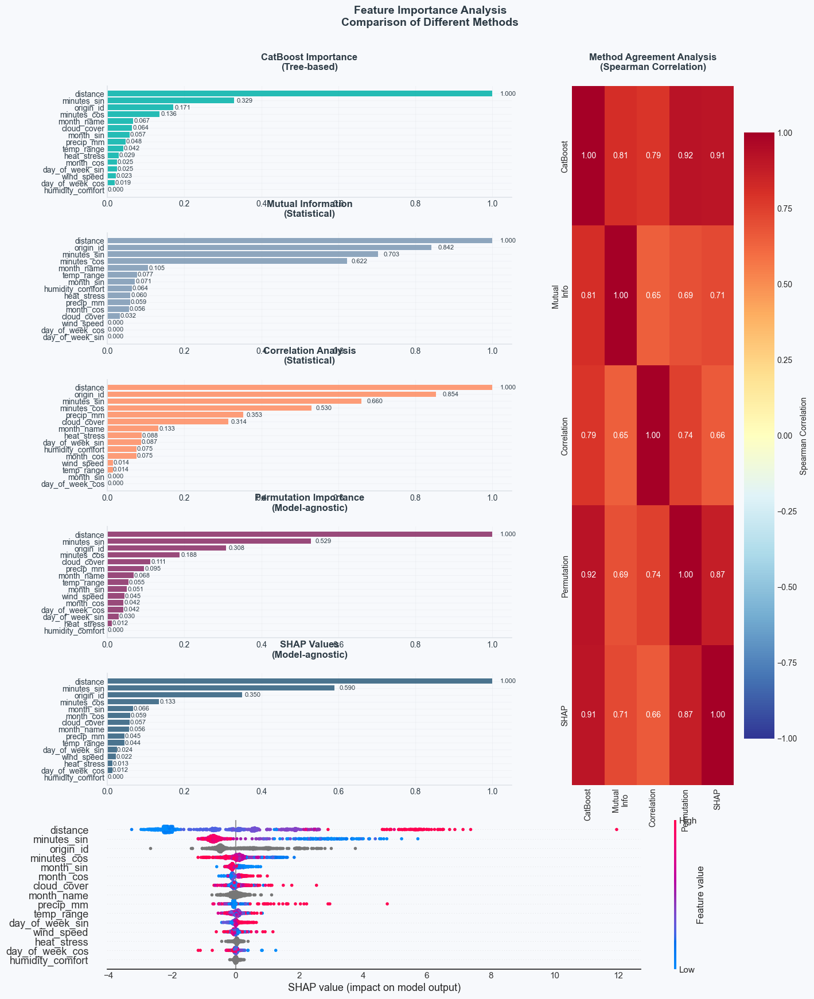

In [25]:
analyzer = FeatureImportanceAnalyzer()
results = analyzer.analyze_features(X_train, y_train, categorical_features)
consensus_features = analyzer.get_consensus_features(results)


e:\bus-schedule-app\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
e:\bus-schedule-app\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 10007 (\N{BALLOT X}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


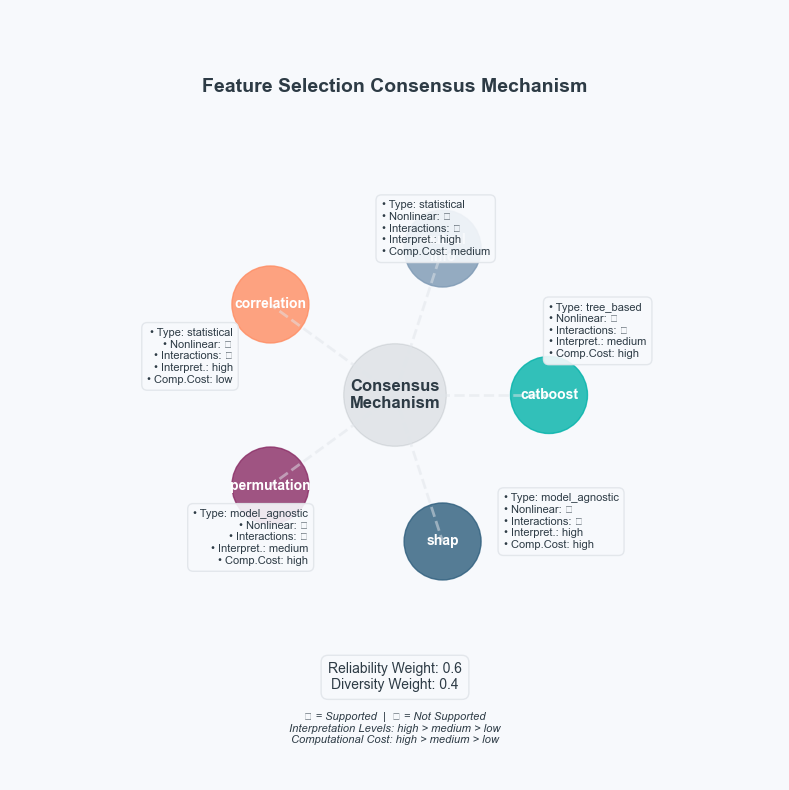

In [15]:
fig, ax = analyzer.visualize_method_characteristics()
plt.show()

In [31]:
if __name__ == "__main__":
    # Suppress warnings
    warnings.filterwarnings('ignore', category=DeprecationWarning)
    warnings.filterwarnings('ignore', category=FutureWarning)
    warnings.filterwarnings('ignore', message='Converting `np.inexact` or `np.floating` to a dtype is deprecated')
    
    # Run feature selection
    consensus_features, results, sensitivity_results = run_feature_selection_experiment(vif_filtered_df)


📊 Feature Selection Analysis

Method Weights:
  • catboost    : 0.195
  • mutual_info : 0.217
  • correlation : 0.187
  • permutation : 0.200
  • shap        : 0.201

Top Features by Method:

Catboost:
  1. distance             (1.000)
  2. minutes_sin          (0.382)
  3. minutes_cos          (0.166)
  4. origin_id            (0.165)
  5. cloud_cover          (0.080)
  6. month_name           (0.075)

Mutual_info:
  1. distance             (1.000)
  2. origin_id            (0.838)
  3. minutes_sin          (0.701)
  4. minutes_cos          (0.609)
  5. month_name           (0.103)
  6. heat_stress          (0.078)
  7. humidity_comfort     (0.067)
  8. precip_mm            (0.062)

Correlation:
  1. distance             (1.000)
  2. origin_id            (0.862)
  3. minutes_sin          (0.667)
  4. minutes_cos          (0.537)
  5. precip_mm            (0.316)
  6. cloud_cover          (0.305)
  7. month_name           (0.107)
  8. heat_stress          (0.105)
  9. humidity_comfort

In [11]:
selected_features = ['distance', 'minutes_sin', 'origin_id', 'minutes_cos', 'cloud_cover', 'precip_mm', 
                   'month_name', 'month_sin', 'month_cos', 'heat_stress', 'humidity_comfort', 'day_of_week_sin', 'day_of_week_cos']

## Analyzing Target Distribution

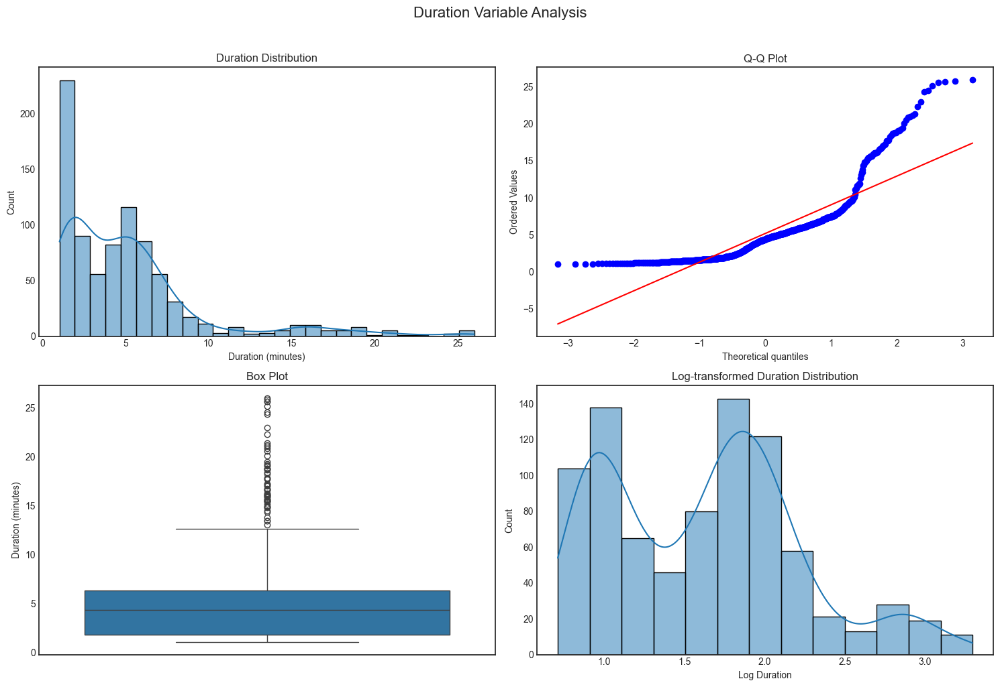


Duration Statistics:
Mean: 5.158
Median: 4.375
Std: 4.419
Skew: 2.129
Kurtosis: 5.243
Min: 1.033
Max: 26.000

Normality Test p-value: 0.000000

Percentage of outliers: 7.31%


In [27]:
import scipy.stats as stats
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Basic statistics
duration_stats = {
    'mean': y_train.mean(),
    'median': y_train.median(),
    'std': y_train.std(),
    'skew': y_train.skew(),
    'kurtosis': y_train.kurtosis(),
    'min': y_train.min(),
    'max': y_train.max()
}

# Create visualization
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle('Duration Variable Analysis', fontsize=16, y=1.02)

# 1. Distribution Plot
sns.histplot(y_train, kde=True, ax=axes[0,0])
axes[0,0].set_title('Duration Distribution')
axes[0,0].set_xlabel('Duration (minutes)')

# 2. Q-Q Plot
stats.probplot(y_train, dist="norm", plot=axes[0,1])
axes[0,1].set_title('Q-Q Plot')

# 3. Box Plot
sns.boxplot(y=y_train, ax=axes[1,0])
axes[1,0].set_title('Box Plot')
axes[1,0].set_ylabel('Duration (minutes)')

# 4. Log-transformed distribution
sns.histplot(np.log1p(y_train), kde=True, ax=axes[1,1])
axes[1,1].set_title('Log-transformed Duration Distribution')
axes[1,1].set_xlabel('Log Duration')

plt.tight_layout()
plt.show()

# Print statistics
print("\nDuration Statistics:")
for stat, value in duration_stats.items():
    print(f"{stat.capitalize()}: {value:.3f}")

# Normality test
_, p_value = stats.normaltest(y_train)
print(f"\nNormality Test p-value: {p_value:.6f}")

# Calculate percentage of outliers (using 1.5 IQR rule)
Q1 = y_train.quantile(0.25)
Q3 = y_train.quantile(0.75)
IQR = Q3 - Q1
outliers = ((y_train < (Q1 - 1.5 * IQR)) | (y_train > (Q3 + 1.5 * IQR))).mean() * 100
print(f"\nPercentage of outliers: {outliers:.2f}%")

## Hyperparameter Tuning 1

In [12]:
final_df = merged_df[selected_features + ['duration']].copy()

[I 2024-11-26 13:43:15,271] A new study created in memory with name: catboost_With Weather Features



Optimizing model: With Weather Features

Optimizing model for With Weather Features


100%|██████████| 100/100 [08:32<00:00,  5.13s/it]


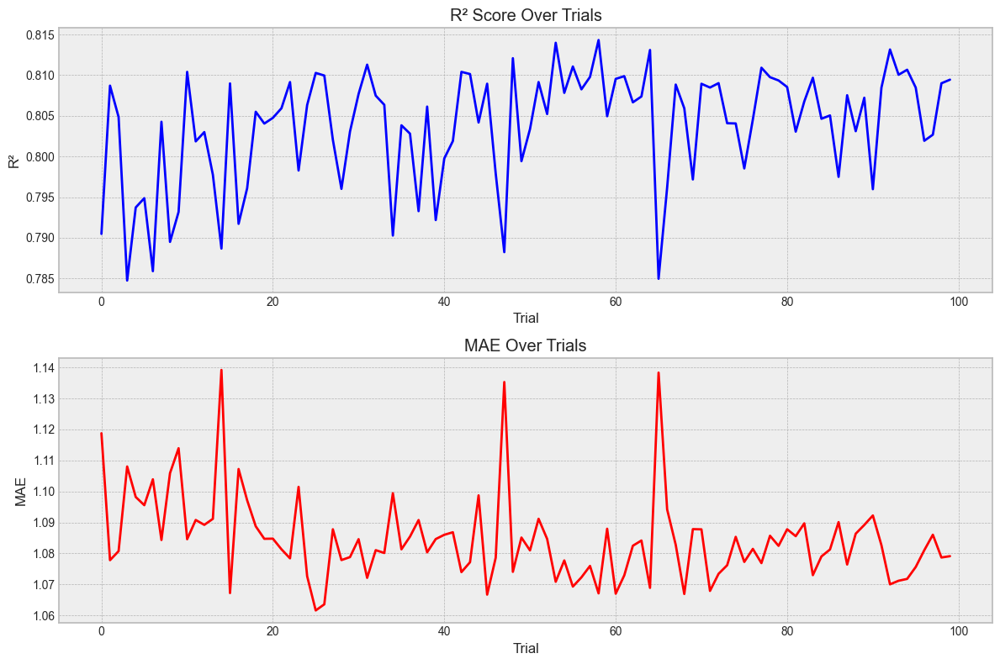


Best Trial Results:
R² Score: 0.8143
MAE: 1.0671


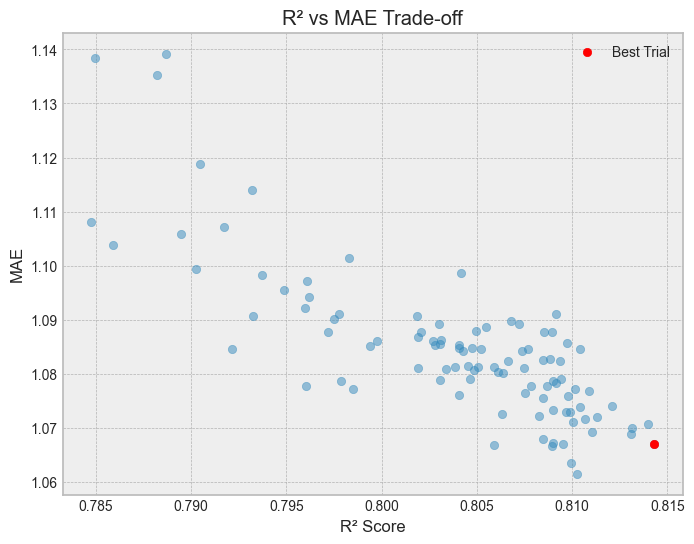


Model saved to ../../models/final_model_weather.joblib


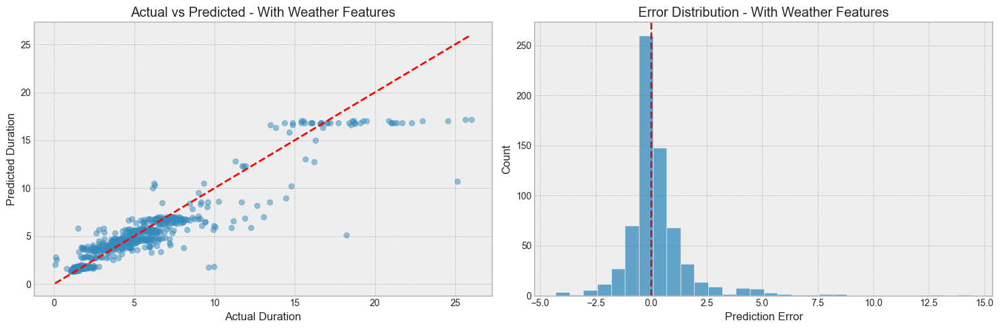


Error Analysis for With Weather Features:
Mean Absolute Error: 0.91 minutes
Median Absolute Error: 0.47 minutes
90th percentile of absolute error: 1.99 minutes
95th percentile of absolute error: 3.17 minutes

Optimization History:

Parameter Parallel Coordinates:

Optimization Analysis:
Total number of trials: 100
Best value: 0.8805
Improvements in last 25% of trials: 0
Average trials between improvements: 9.5


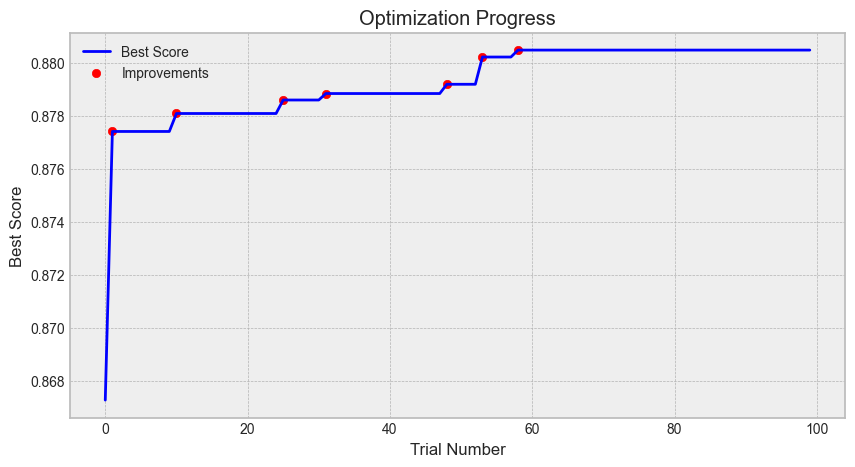


Parameter Convergence Analysis:

iterations:
  Recent std / Overall std: 0.611


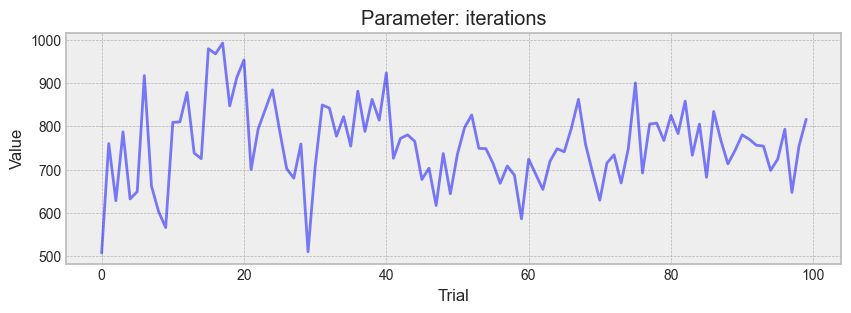

  ⚠ Parameter might benefit from more trials

learning_rate:
  Recent std / Overall std: 0.768


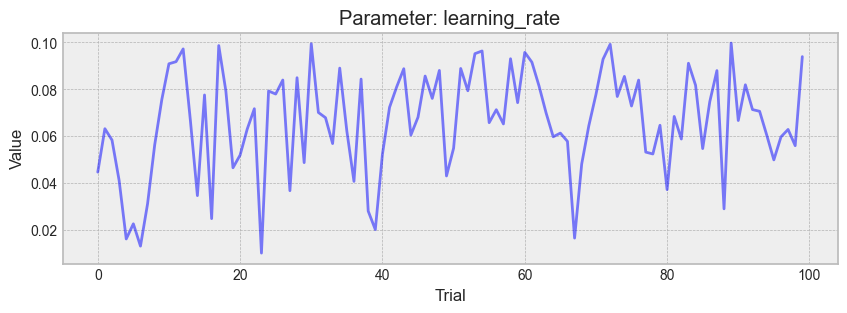

  ⚠ Parameter might benefit from more trials

depth:
  Recent std / Overall std: 0.615


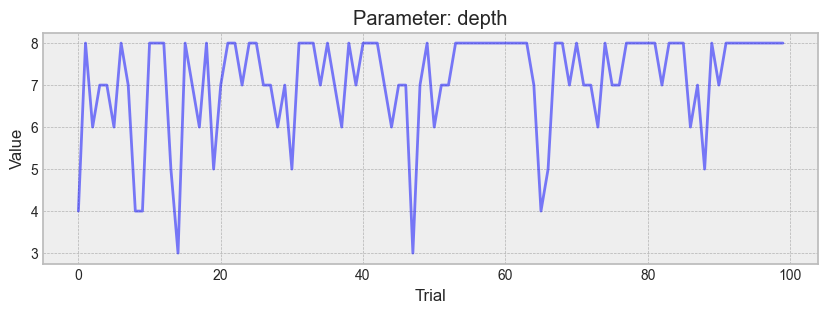

  ⚠ Parameter might benefit from more trials

max_leaves:
  Recent std / Overall std: 0.891


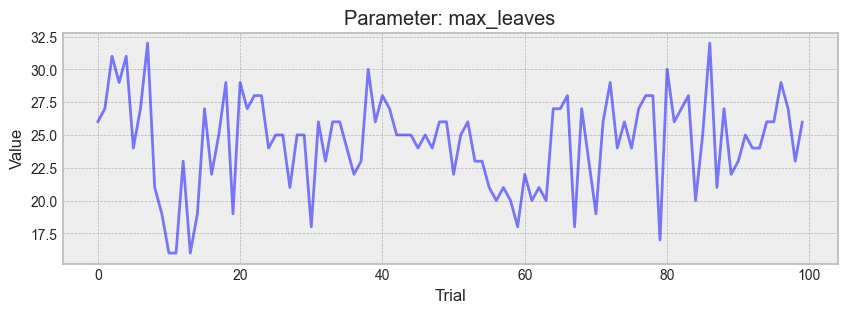

  ⚠ Parameter might benefit from more trials

min_data_in_leaf:
  Recent std / Overall std: 0.675


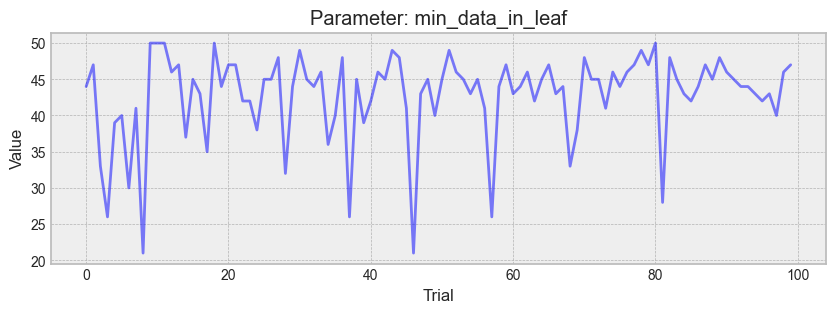

  ⚠ Parameter might benefit from more trials

subsample:
  Recent std / Overall std: 0.929


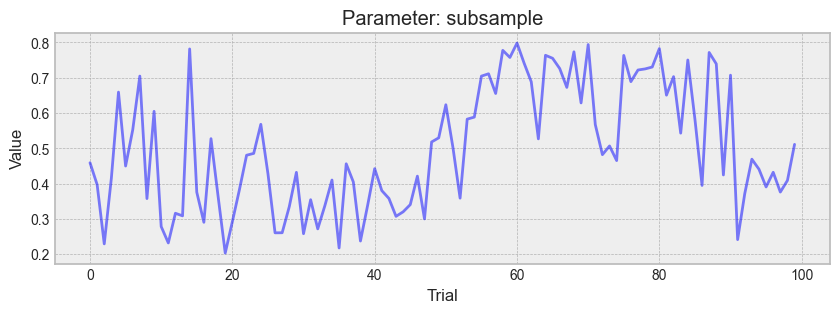

  ⚠ Parameter might benefit from more trials

l2_leaf_reg:
  Recent std / Overall std: 0.805


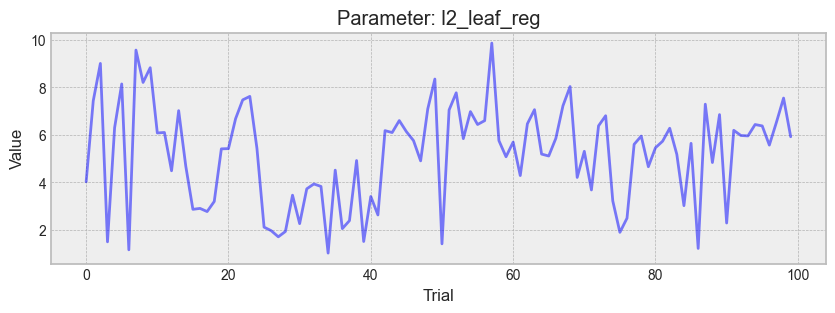

  ⚠ Parameter might benefit from more trials

random_strength:
  Recent std / Overall std: 0.752


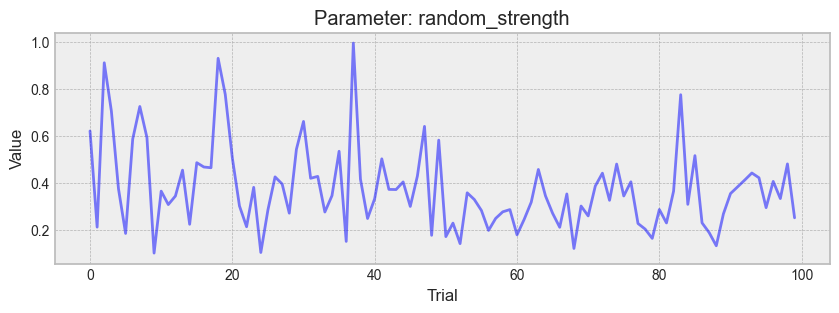

[I 2024-11-26 13:51:56,376] A new study created in memory with name: catboost_Without Weather Features


  ⚠ Parameter might benefit from more trials

Optimizing model: Without Weather Features

Optimizing model for Without Weather Features


100%|██████████| 100/100 [08:05<00:00,  4.86s/it]


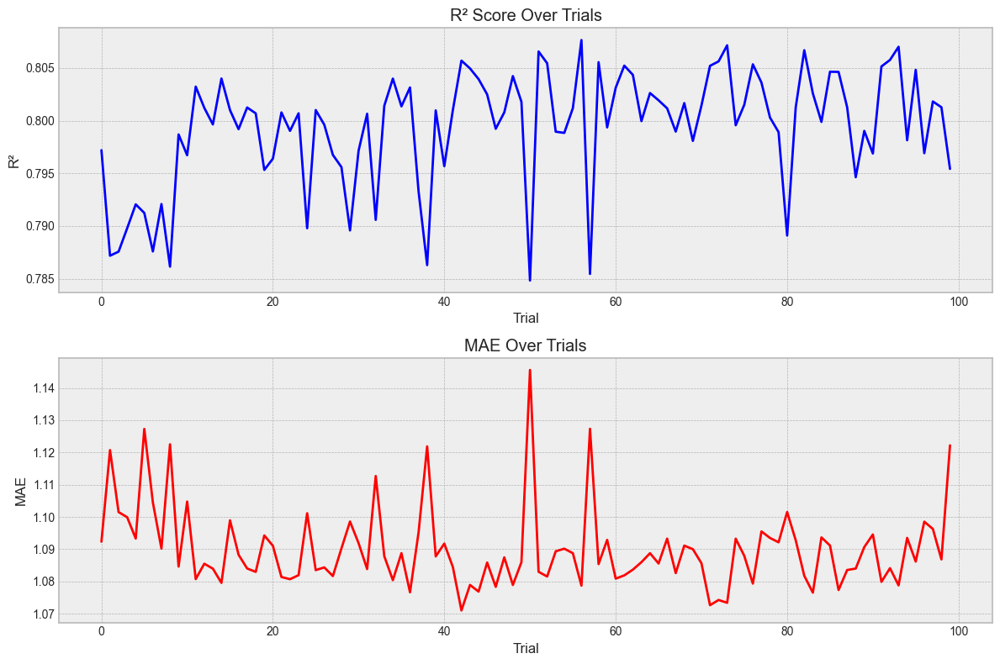


Best Trial Results:
R² Score: 0.8077
MAE: 1.0787


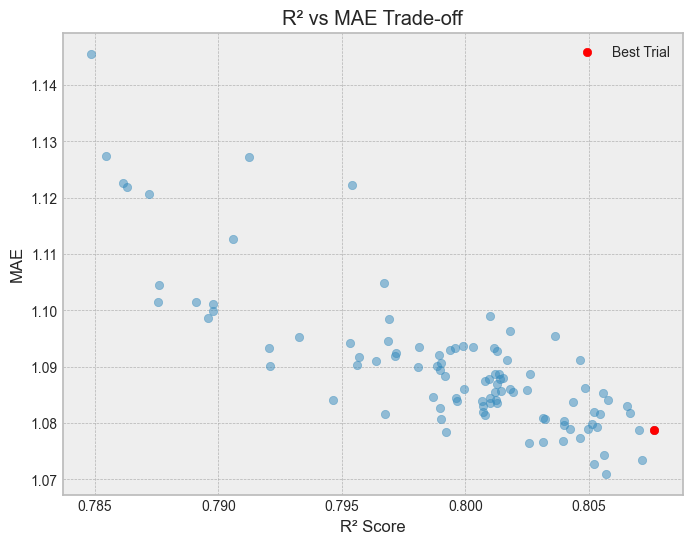


Model saved to ../../models/final_model_no_weather.joblib


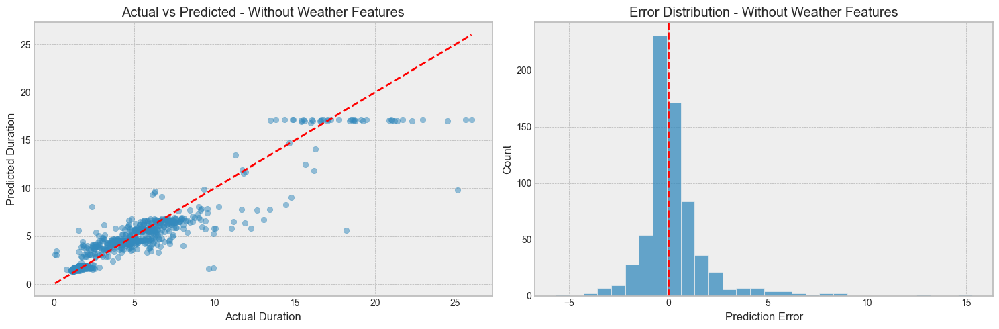


Error Analysis for Without Weather Features:
Mean Absolute Error: 0.98 minutes
Median Absolute Error: 0.50 minutes
90th percentile of absolute error: 2.23 minutes
95th percentile of absolute error: 3.41 minutes

Optimization History:

Parameter Parallel Coordinates:

Optimization Analysis:
Total number of trials: 100
Best value: 0.8769
Improvements in last 25% of trials: 0
Average trials between improvements: 9.4


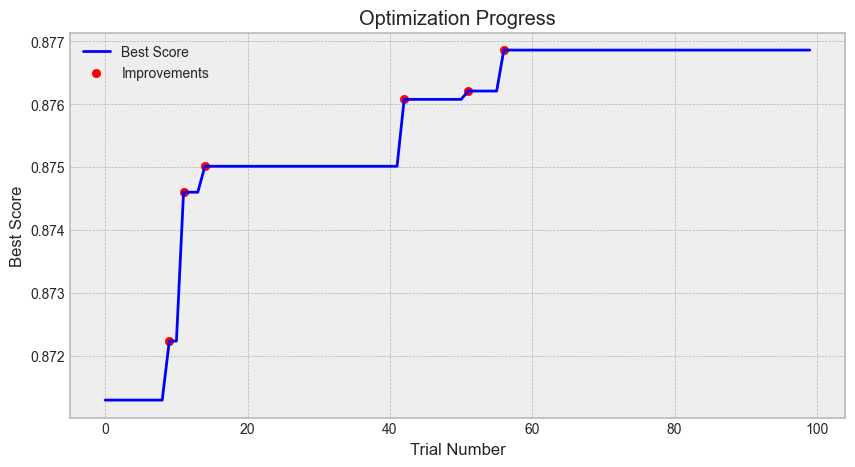


Parameter Convergence Analysis:

iterations:
  Recent std / Overall std: 0.400


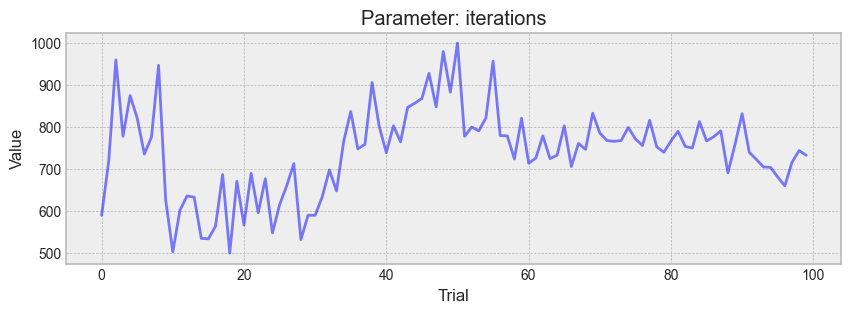

  ✓ Parameter appears to have converged

learning_rate:
  Recent std / Overall std: 0.540


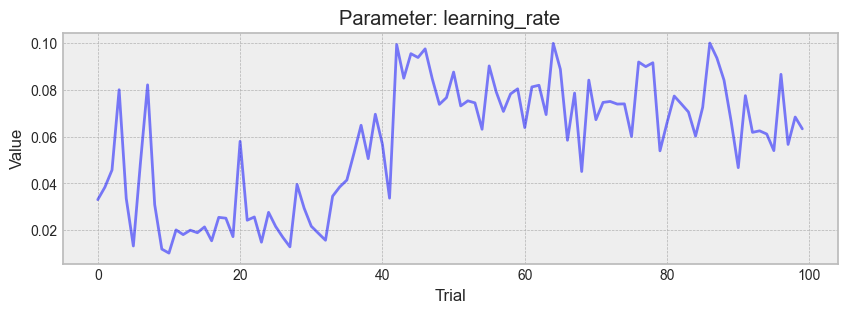

  ⚠ Parameter might benefit from more trials

depth:
  Recent std / Overall std: 0.834


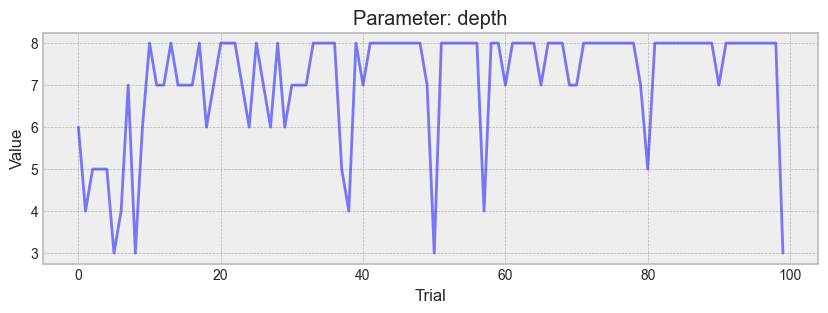

  ⚠ Parameter might benefit from more trials

max_leaves:
  Recent std / Overall std: 0.366


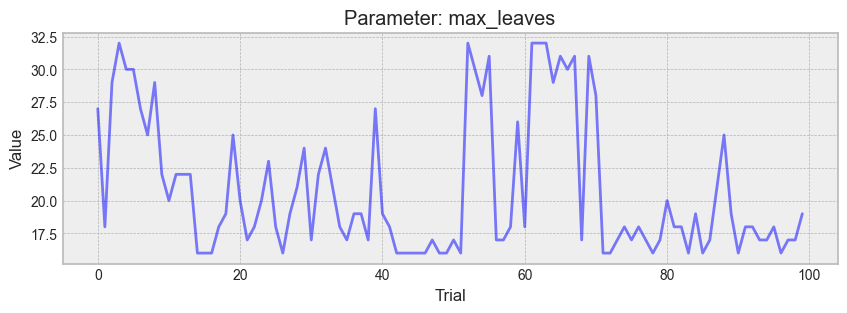

  ✓ Parameter appears to have converged

min_data_in_leaf:
  Recent std / Overall std: 0.753


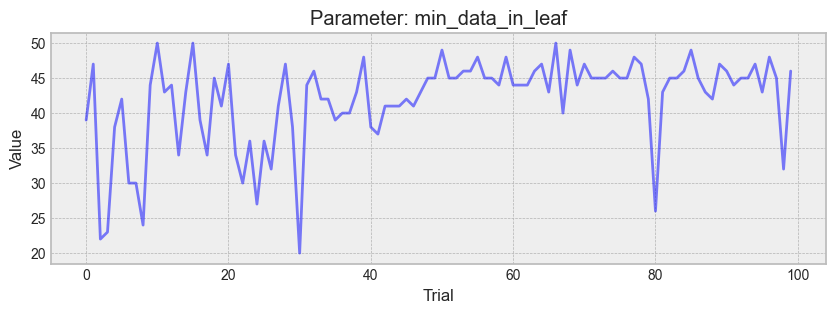

  ⚠ Parameter might benefit from more trials

subsample:
  Recent std / Overall std: 0.672


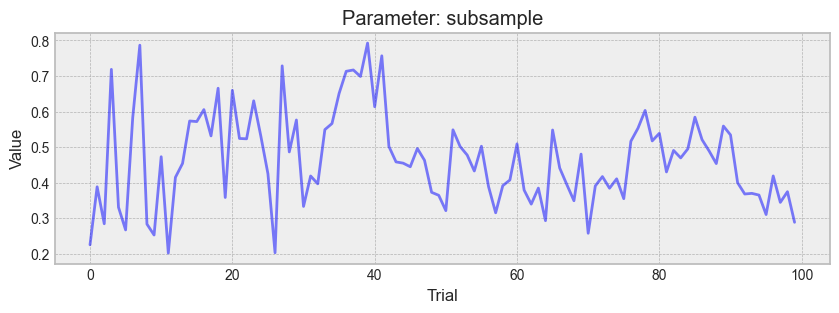

  ⚠ Parameter might benefit from more trials

l2_leaf_reg:
  Recent std / Overall std: 0.666


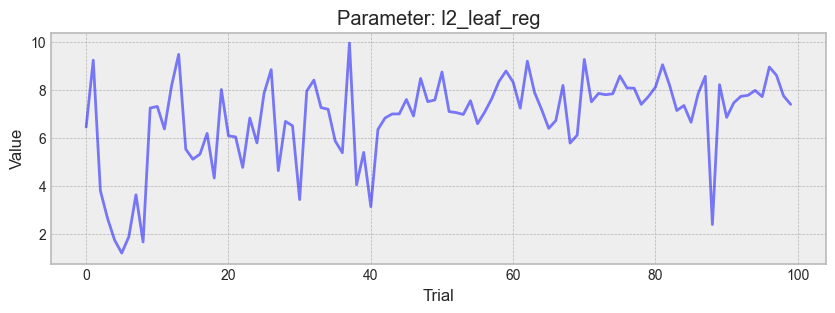

  ⚠ Parameter might benefit from more trials

random_strength:
  Recent std / Overall std: 0.824


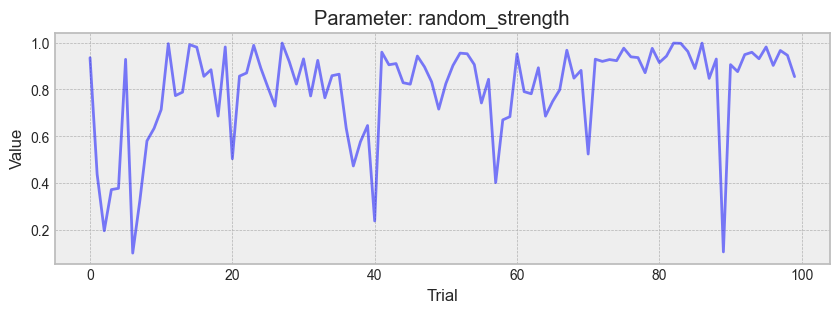

  ⚠ Parameter might benefit from more trials

Optimization Results Summary:
--------------------------------------------------

with_weather:
Best score: 0.8805
Best parameters:
  iterations: 687
  learning_rate: 0.09303463796923696
  depth: 8
  max_leaves: 20
  min_data_in_leaf: 44
  subsample: 0.777426632156143
  l2_leaf_reg: 5.759946787038047
  random_strength: 0.275830804701565

without_weather:
Best score: 0.8769
Best parameters:
  iterations: 780
  learning_rate: 0.07900052463189747
  depth: 8
  max_leaves: 17
  min_data_in_leaf: 45
  subsample: 0.3886676552223428
  l2_leaf_reg: 7.066412391088399
  random_strength: 0.8435370348856898


In [78]:
import optuna
import joblib
from sklearn.model_selection import KFold
from sklearn.metrics import r2_score, mean_squared_error, root_mean_squared_error, mean_absolute_error
from catboost import CatBoostRegressor
from tqdm import tqdm

# Define feature sets and configurations
MODEL_CONFIGS = {
    'with_weather': {
        'features': selected_features,
        'name': 'With Weather Features',
        'save_path': '../../models/final_model_weather.joblib'
    },
    'without_weather': {
        'features': ['distance', 'minutes_sin', 'minutes_cos', 'origin_id',
                    'month_name', 'day_of_week_cos', 'day_of_week_sin'],
        'name': 'Without Weather Features',
        'save_path': '../../models/final_model_no_weather.joblib'
    }
}


def objective(trial, X, y, feature_set_name):
    """Define the objective function optimized for Lossguide policy"""
    
    # Log transform the target
    y_log = np.log1p(y)
    
    param = {
        # Core Parameters
        'iterations': trial.suggest_int('iterations', 500, 1000),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
        'depth': trial.suggest_int('depth', 3, 8),
        
        # Lossguide specific configuration
        'grow_policy': 'Lossguide',
        'max_leaves': trial.suggest_int('max_leaves', 16, 32),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 20, 50),
        'score_function': 'L2',
        
        # Other parameters
        'leaf_estimation_method': 'Gradient',
        'bootstrap_type': 'Bernoulli',
        'subsample': trial.suggest_float('subsample', 0.2, 0.8),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1, 10),
        'random_strength': trial.suggest_float('random_strength', 0.1, 1.0),
        
        # Resource management
        'task_type': 'GPU',
        'devices': '0',
        'gpu_ram_part': 0.8,
        
        'eval_metric': 'RMSE',
        'verbose': False
    }
    
    kf = KFold(n_splits=3, shuffle=True, random_state=42)
    r2_scores = []
    mae_scores = []
    
    for fold, (train_idx, valid_idx) in enumerate(kf.split(X)):
        X_fold_train, X_fold_valid = X.iloc[train_idx], X.iloc[valid_idx]
        y_fold_train = y_log.iloc[train_idx]
        y_fold_valid = y_log.iloc[valid_idx]
        
        try:
            categorical_features = list(X.select_dtypes(include=['object', 'category']).columns)
            
            model = CatBoostRegressor(
                **param,
                cat_features=categorical_features,
                random_state=42
            )
            
            model.fit(
                X_fold_train, y_fold_train,
                eval_set=[(X_fold_valid, y_fold_valid)],
                early_stopping_rounds=50,
                verbose=False
            )

            # Predict and transform back to original scale
            y_pred_log = model.predict(X_fold_valid)
            y_pred = np.expm1(y_pred_log)

            r2 = r2_score(y.iloc[valid_idx], y_pred)
            mae = mean_absolute_error(y.iloc[valid_idx], y_pred)
            r2_scores.append(r2)
            mae_scores.append(mae)
            
        except Exception as e:
            print(f"Trial failed: {e}")
            return float('-inf')
    
        # Calculate mean scores
        mean_r2 = np.mean(r2_scores)
        mean_mae = np.mean(mae_scores)
        
        # Normalize MAE to be in [0,1] range (assuming typical MAE values)
        normalized_mae = 1 - (mean_mae / 20)  # Adjust denominator based on your typical MAE values
        
        # Combine scores with weights
        combined_score = (0.5 * mean_r2) + (0.5 * normalized_mae)
        
        # Store the individual metrics for analysis
        trial.set_user_attr('r2_score', mean_r2)
        trial.set_user_attr('mae_score', mean_mae)
    
    return combined_score

def train_final_model(X, y, best_params, feature_set_name):
    """Train final model with log-transformed target"""
    # Log transform the target
    y_log = np.log1p(y)
    
    # Create a copy of the data and parameters
    X = X.copy()
    params = best_params.copy()
    
    # Ensure Lossguide-specific parameters are included
    if 'grow_policy' not in params:
        params.update({
            'grow_policy': 'Lossguide',
            'score_function': 'L2'
        })
    
    # Identify categorical columns
    categorical_features = list(X.select_dtypes(include=['object', 'category']).columns)
    
    # Convert categorical columns to category dtype
    for col in categorical_features:
        X[col] = X[col].astype('category')
    
    # Split the data
    X_train, X_test, y_train_log, y_test_log = train_test_split(
        X, y_log, test_size=0.2, random_state=42
    )
    
    # Create model with categorical features specified
    model = CatBoostRegressor(
        **params,  # Using updated params
        cat_features=categorical_features,
        verbose=False,
        random_state=42
    )
    
    # Fit the model
    model.fit(
        X_train, y_train_log,
        eval_set=[(X_test, y_test_log)],
        early_stopping_rounds=50,
        verbose=False
    )
    
    # Make predictions and transform back to original scale
    y_pred_train_log = model.predict(X_train)
    y_pred_test_log = model.predict(X_test)
    
    y_pred_train = np.expm1(y_pred_train_log)
    y_pred_test = np.expm1(y_pred_test_log)
    
    # Calculate metrics on original scale
    results = {
        'feature_set': feature_set_name,
        'best_params': best_params,
        'train_r2': r2_score(y.iloc[X_train.index], y_pred_train),
        'test_r2': r2_score(y.iloc[X_test.index], y_pred_test),
        'train_rmse': np.sqrt(mean_squared_error(y.iloc[X_train.index], y_pred_train)),
        'test_rmse': np.sqrt(mean_squared_error(y.iloc[X_test.index], y_pred_test)),
        'train_mae': mean_absolute_error(y.iloc[X_train.index], y_pred_train),
        'test_mae': mean_absolute_error(y.iloc[X_test.index], y_pred_test),
        'model': model,
        'predictions': {
            'y_test': y.iloc[X_test.index],
            'y_pred_test': y_pred_test,
            'y_train': y.iloc[X_train.index],
            'y_pred_train': y_pred_train
        }
    }
    
    return results

def analyze_optimization_results(study):
    """Analyze optimization results with both metrics"""
    trials_df = study.trials_dataframe()
    
    # Extract both metrics
    r2_scores = [t.user_attrs['r2_score'] for t in study.trials if t.value != float('-inf')]
    mae_scores = [t.user_attrs['mae_score'] for t in study.trials if t.value != float('-inf')]
    
    # Plot both metrics over trials
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))
    
    # R² plot
    ax1.plot(r2_scores, 'b-', label='R²')
    ax1.set_title('R² Score Over Trials')
    ax1.set_xlabel('Trial')
    ax1.set_ylabel('R²')
    ax1.grid(True)
    
    # MAE plot
    ax2.plot(mae_scores, 'r-', label='MAE')
    ax2.set_title('MAE Over Trials')
    ax2.set_xlabel('Trial')
    ax2.set_ylabel('MAE')
    ax2.grid(True)
    
    plt.tight_layout()
    plt.show()
    
    # Print best results
    best_trial_idx = study.best_trial.number
    print("\nBest Trial Results:")
    print(f"R² Score: {r2_scores[best_trial_idx]:.4f}")
    print(f"MAE: {mae_scores[best_trial_idx]:.4f}")
    
    # Create scatter plot of R² vs MAE
    plt.figure(figsize=(8, 6))
    plt.scatter(r2_scores, mae_scores, alpha=0.5)
    plt.scatter(r2_scores[best_trial_idx], mae_scores[best_trial_idx], 
               color='red', label='Best Trial')
    plt.xlabel('R² Score')
    plt.ylabel('MAE')
    plt.title('R² vs MAE Trade-off')
    plt.legend()
    plt.grid(True)
    plt.show()

# Update the optimize_model function to use the new analysis
def optimize_model(X, y, feature_set_name, n_trials=100):
    study = optuna.create_study(
        direction='maximize',
        pruner=optuna.pruners.MedianPruner(
            n_startup_trials=5,
            n_warmup_steps=20,
            interval_steps=10
        ),
        study_name=f'catboost_{feature_set_name}'
    )
    
    func = lambda trial: objective(trial, X, y, feature_set_name)
    
    print(f"\nOptimizing model for {feature_set_name}")
    for _ in tqdm(range(n_trials)):
        try:
            study.optimize(func, n_trials=1)
        except Exception as e:
            print(f"Optimization step failed: {e}")
            continue
    
    # Analyze results with both metrics
    analyze_optimization_results(study)
    
    return study

def save_model_info(results, config):
    """Save model and its metadata"""
    model_info = {
        'model': results['model'],
        'features': config['features'],
        'best_params': results['best_params'],
        'performance': {
            'train_r2': results['train_r2'],
            'train_rmse': results['train_rmse'],
            'train_mae': results['train_mae']
        }
    }
    joblib.dump(model_info, config['save_path'])
    print(f"\nModel saved to {config['save_path']}")

def analyze_errors(y_true, y_pred, model_name):
    """Analyze and visualize prediction errors"""
    errors = pd.DataFrame({
        'actual': y_true,
        'predicted': y_pred,
        'error': y_true - y_pred,
        'abs_error': abs(y_true - y_pred)
    })
    
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 2, 1)
    plt.scatter(errors['actual'], errors['predicted'], alpha=0.5)
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=2)
    plt.xlabel('Actual Duration')
    plt.ylabel('Predicted Duration')
    plt.title(f'Actual vs Predicted - {model_name}')
    
    plt.subplot(1, 2, 2)
    sns.histplot(data=errors, x='error', bins=30)
    plt.axvline(x=0, color='r', linestyle='--')
    plt.xlabel('Prediction Error')
    plt.title(f'Error Distribution - {model_name}')
    
    plt.tight_layout()
    plt.show()
    
    print(f"\nError Analysis for {model_name}:")
    print(f"Mean Absolute Error: {errors['abs_error'].mean():.2f} minutes")
    print(f"Median Absolute Error: {errors['abs_error'].median():.2f} minutes")
    print(f"90th percentile of absolute error: {errors['abs_error'].quantile(0.9):.2f} minutes")
    print(f"95th percentile of absolute error: {errors['abs_error'].quantile(0.95):.2f} minutes")
    
    return errors

def analyze_optimization_convergence(study):
    """Analyze if the optimization has potentially converged"""
    
    # Plot optimization history
    print("\nOptimization History:")
    optuna.visualization.plot_optimization_history(study)
    
    # Plot parallel coordinates
    print("\nParameter Parallel Coordinates:")
    optuna.visualization.plot_parallel_coordinate(study)
    
    # Calculate statistics about improvement
    trials_df = study.trials_dataframe()
    
    # Get the best value at each trial
    trials_df['best_value'] = trials_df['value'].cummax()
    
    # Calculate improvements in last portion of trials
    n_trials = len(trials_df)
    last_quarter_improvements = (
        trials_df.iloc[int(0.75*n_trials):]['value'] > 
        trials_df.iloc[int(0.75*n_trials):]['best_value'].shift(1)
    ).sum()
    
    print("\nOptimization Analysis:")
    print(f"Total number of trials: {n_trials}")
    print(f"Best value: {study.best_value:.4f}")
    print(f"Improvements in last 25% of trials: {last_quarter_improvements}")
    
    # Calculate rate of improvement
    improvements = trials_df['value'] > trials_df['best_value'].shift(1)
    improvement_positions = improvements[improvements].index
    if len(improvement_positions) > 1:
        avg_trials_between_improvements = np.diff(improvement_positions).mean()
        print(f"Average trials between improvements: {avg_trials_between_improvements:.1f}")
    
    # Plot improvement rate over time
    plt.figure(figsize=(10, 5))
    plt.plot(trials_df.index, trials_df['best_value'], 'b-', label='Best Score')
    plt.scatter(improvement_positions, trials_df.loc[improvement_positions, 'best_value'], 
               color='red', label='Improvements')
    plt.xlabel('Trial Number')
    plt.ylabel('Best Score')
    plt.title('Optimization Progress')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Analyze parameter convergence
    print("\nParameter Convergence Analysis:")
    for param in study.best_params.keys():
        values = [t.params[param] for t in study.trials if t.params.get(param) is not None]
        if len(values) > 0:
            recent_std = np.std(values[-int(len(values)*0.25):])
            overall_std = np.std(values)
            print(f"\n{param}:")
            print(f"  Recent std / Overall std: {recent_std/overall_std:.3f}")
            
            # Plot parameter values over trials
            plt.figure(figsize=(10, 3))
            plt.plot(values, 'b-', alpha=0.5)
            plt.title(f'Parameter: {param}')
            plt.xlabel('Trial')
            plt.ylabel('Value')
            plt.grid(True)
            plt.show()
            
            if recent_std/overall_std < 0.5:
                print("  ✓ Parameter appears to have converged")
            else:
                print("  ⚠ Parameter might benefit from more trials")

# Run optimization for both feature sets
optuna_results = {}
model_results = {}  # Store the final model results

# In the main loop where the error occurs
for model_type, config in MODEL_CONFIGS.items():
    print(f"\nOptimizing model: {config['name']}")
    # Make sure we're using all rows from X_train for these features
    X = X_train[config['features']].reset_index(drop=True)
    y = y_train.reset_index(drop=True)
    
    try:
        # Run Optuna optimization
        study = optimize_model(X, y, config['name'])
        optuna_results[model_type] = study
        
        # Train final model with best parameters
        results = train_final_model(X, y, study.best_params, config['name'])
        model_results[model_type] = results
        
        # Save model
        save_model_info(results, config)
        
        # Analyze errors
        analyze_errors(
            results['predictions']['y_train'],
            results['predictions']['y_pred_train'],
            config['name']
        )
        analyze_optimization_convergence(study)
    except Exception as e:
        print(f"Error processing {model_type}: {str(e)}")
        continue

# Print optimization results summary
print("\nOptimization Results Summary:")
print("-" * 50)
for model_type, study in optuna_results.items():
    if study.best_trial:
        print(f"\n{model_type}:")
        print(f"Best score: {study.best_trial.value:.4f}")
        print("Best parameters:")
        for key, value in study.best_trial.params.items():
            print(f"  {key}: {value}")


In [79]:
# Get best parameters from the study
cb_best_params_no_weather = optuna_results['without_weather'].best_params

# Print detailed parameter information
print("Best Parameters for Model Without Weather Features:")
print("-" * 50)
for param, value in cb_best_params_no_weather.items():
    print(f"{param:20}: {value}")

Best Parameters for Model Without Weather Features:
--------------------------------------------------
iterations          : 780
learning_rate       : 0.07900052463189747
depth               : 8
max_leaves          : 17
min_data_in_leaf    : 45
subsample           : 0.3886676552223428
l2_leaf_reg         : 7.066412391088399
random_strength     : 0.8435370348856898


In [16]:
import optuna
import joblib
from sklearn.model_selection import KFold
from sklearn.metrics import r2_score, mean_squared_error, root_mean_squared_error, mean_absolute_error
from catboost import CatBoostRegressor
from tqdm import tqdm

def objective(trial, X, y, feature_set_name):
    """Define the objective function optimized for Lossguide policy"""
    
    # Log transform the target
    y_log = np.log1p(y)
    
    param = {
        # Core Parameters
        'iterations': trial.suggest_int('iterations', 500, 1000),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
        'depth': trial.suggest_int('depth', 3, 8),
        
        # Lossguide specific configuration
        'grow_policy': 'Lossguide',
        'max_leaves': trial.suggest_int('max_leaves', 16, 32),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 20, 50),
        'score_function': 'L2',
        
        # Other parameters
        'leaf_estimation_method': 'Gradient',
        'bootstrap_type': 'Bernoulli',
        'subsample': trial.suggest_float('subsample', 0.2, 0.8),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1, 10),
        'random_strength': trial.suggest_float('random_strength', 0.1, 1.0),
        
        # Resource management
        'task_type': 'GPU',
        'devices': '0',
        'gpu_ram_part': 0.8,
        
        'eval_metric': 'RMSE',
        'verbose': False
    }
    
    kf = KFold(n_splits=3, shuffle=True, random_state=42)
    r2_scores = []
    mae_scores = []
    
    for fold, (train_idx, valid_idx) in enumerate(kf.split(X)):
        X_fold_train, X_fold_valid = X.iloc[train_idx], X.iloc[valid_idx]
        y_fold_train = y_log.iloc[train_idx]
        y_fold_valid = y_log.iloc[valid_idx]
        
        try:
            categorical_features = list(X.select_dtypes(include=['object', 'category']).columns)
            
            model = CatBoostRegressor(
                **param,
                cat_features=categorical_features,
                random_state=42
            )
            
            model.fit(
                X_fold_train, y_fold_train,
                eval_set=[(X_fold_valid, y_fold_valid)],
                early_stopping_rounds=50,
                verbose=False
            )

            # Predict and transform back to original scale
            y_pred_log = model.predict(X_fold_valid)
            y_pred = np.expm1(y_pred_log)

            r2 = r2_score(y.iloc[valid_idx], y_pred)
            mae = mean_absolute_error(y.iloc[valid_idx], y_pred)
            r2_scores.append(r2)
            mae_scores.append(mae)
            
        except Exception as e:
            print(f"Trial failed: {e}")
            return float('-inf')
    
        # Calculate mean scores
        mean_r2 = np.mean(r2_scores)
        mean_mae = np.mean(mae_scores)
        
        # Normalize MAE to be in [0,1] range (assuming typical MAE values)
        normalized_mae = 1 - (mean_mae / 20)  # Adjust denominator based on your typical MAE values
        
        # Combine scores with weights
        combined_score = (0.5 * mean_r2) + (0.5 * normalized_mae)
        
        # Store the individual metrics for analysis
        trial.set_user_attr('r2_score', mean_r2)
        trial.set_user_attr('mae_score', mean_mae)
    
    return combined_score

def train_final_model(X, y, best_params, feature_set_name):
    """Train final model with log-transformed target"""
    # Log transform the target
    y_log = np.log1p(y)
    
    # Create a copy of the data and parameters
    X = X.copy()
    params = best_params.copy()
    
    # Ensure Lossguide-specific parameters are included
    if 'grow_policy' not in params:
        params.update({
            'grow_policy': 'Lossguide',
            'score_function': 'L2'
        })
    
    # Identify categorical columns
    categorical_features = list(X.select_dtypes(include=['object', 'category']).columns)
    
    # Convert categorical columns to category dtype
    for col in categorical_features:
        X[col] = X[col].astype('category')
    
    # Split the data
    X_train, X_test, y_train_log, y_test_log = train_test_split(
        X, y_log, test_size=0.2, random_state=42
    )
    
    # Create model with categorical features specified
    model = CatBoostRegressor(
        **params,  # Using updated params
        cat_features=categorical_features,
        verbose=False,
        random_state=42
    )
    
    # Fit the model
    model.fit(
        X_train, y_train_log,
        eval_set=[(X_test, y_test_log)],
        early_stopping_rounds=50,
        verbose=False
    )
    
    # Make predictions and transform back to original scale
    y_pred_train_log = model.predict(X_train)
    y_pred_test_log = model.predict(X_test)
    
    y_pred_train = np.expm1(y_pred_train_log)
    y_pred_test = np.expm1(y_pred_test_log)
    
    # Calculate metrics on original scale
    results = {
        'feature_set': feature_set_name,
        'best_params': best_params,
        'train_r2': r2_score(y.iloc[X_train.index], y_pred_train),
        'test_r2': r2_score(y.iloc[X_test.index], y_pred_test),
        'train_rmse': np.sqrt(mean_squared_error(y.iloc[X_train.index], y_pred_train)),
        'test_rmse': np.sqrt(mean_squared_error(y.iloc[X_test.index], y_pred_test)),
        'train_mae': mean_absolute_error(y.iloc[X_train.index], y_pred_train),
        'test_mae': mean_absolute_error(y.iloc[X_test.index], y_pred_test),
        'model': model,
        'predictions': {
            'y_test': y.iloc[X_test.index],
            'y_pred_test': y_pred_test,
            'y_train': y.iloc[X_train.index],
            'y_pred_train': y_pred_train
        }
    }
    
    return results

def analyze_optimization_results(study):
    """Analyze optimization results with both metrics"""
    trials_df = study.trials_dataframe()
    
    # Extract both metrics
    r2_scores = [t.user_attrs['r2_score'] for t in study.trials if t.value != float('-inf')]
    mae_scores = [t.user_attrs['mae_score'] for t in study.trials if t.value != float('-inf')]
    
    # Plot both metrics over trials
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))
    
    # R² plot
    ax1.plot(r2_scores, 'b-', label='R²')
    ax1.set_title('R² Score Over Trials')
    ax1.set_xlabel('Trial')
    ax1.set_ylabel('R²')
    ax1.grid(True)
    
    # MAE plot
    ax2.plot(mae_scores, 'r-', label='MAE')
    ax2.set_title('MAE Over Trials')
    ax2.set_xlabel('Trial')
    ax2.set_ylabel('MAE')
    ax2.grid(True)
    
    plt.tight_layout()
    plt.show()
    
    # Print best results
    best_trial_idx = study.best_trial.number
    print("\nBest Trial Results:")
    print(f"R² Score: {r2_scores[best_trial_idx]:.4f}")
    print(f"MAE: {mae_scores[best_trial_idx]:.4f}")
    
    # Create scatter plot of R² vs MAE
    plt.figure(figsize=(8, 6))
    plt.scatter(r2_scores, mae_scores, alpha=0.5)
    plt.scatter(r2_scores[best_trial_idx], mae_scores[best_trial_idx], 
               color='red', label='Best Trial')
    plt.xlabel('R² Score')
    plt.ylabel('MAE')
    plt.title('R² vs MAE Trade-off')
    plt.legend()
    plt.grid(True)
    plt.show()

# Update the optimize_model function to use the new analysis
def optimize_model(X, y, feature_set_name, n_trials=100):
    study = optuna.create_study(
        direction='maximize',
        pruner=optuna.pruners.MedianPruner(
            n_startup_trials=5,
            n_warmup_steps=20,
            interval_steps=10
        ),
        study_name=f'catboost_{feature_set_name}'
    )
    
    func = lambda trial: objective(trial, X, y, feature_set_name)
    
    print(f"\nOptimizing model for {feature_set_name}")
    for _ in tqdm(range(n_trials)):
        try:
            study.optimize(func, n_trials=1)
        except Exception as e:
            print(f"Optimization step failed: {e}")
            continue
    
    # Analyze results with both metrics
    analyze_optimization_results(study)
    
    return study

def save_model_info(results, config):
    """Save model and its metadata"""
    model_info = {
        'model': results['model'],
        'features': config['features'],
        'best_params': results['best_params'],
        'performance': {
            'train_r2': results['train_r2'],
            'train_rmse': results['train_rmse'],
            'train_mae': results['train_mae']
        }
    }
    joblib.dump(model_info, config['save_path'])
    print(f"\nModel saved to {config['save_path']}")

def analyze_errors(y_true, y_pred, model_name):
    """Analyze and visualize prediction errors"""
    errors = pd.DataFrame({
        'actual': y_true,
        'predicted': y_pred,
        'error': y_true - y_pred,
        'abs_error': abs(y_true - y_pred)
    })
    
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 2, 1)
    plt.scatter(errors['actual'], errors['predicted'], alpha=0.5)
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=2)
    plt.xlabel('Actual Duration')
    plt.ylabel('Predicted Duration')
    plt.title(f'Actual vs Predicted - {model_name}')
    
    plt.subplot(1, 2, 2)
    sns.histplot(data=errors, x='error', bins=30)
    plt.axvline(x=0, color='r', linestyle='--')
    plt.xlabel('Prediction Error')
    plt.title(f'Error Distribution - {model_name}')
    
    plt.tight_layout()
    plt.show()
    
    print(f"\nError Analysis for {model_name}:")
    print(f"Mean Absolute Error: {errors['abs_error'].mean():.2f} minutes")
    print(f"Median Absolute Error: {errors['abs_error'].median():.2f} minutes")
    print(f"90th percentile of absolute error: {errors['abs_error'].quantile(0.9):.2f} minutes")
    print(f"95th percentile of absolute error: {errors['abs_error'].quantile(0.95):.2f} minutes")
    
    return errors

def analyze_optimization_convergence(study):
    """Analyze if the optimization has potentially converged"""
    
    # Plot optimization history
    print("\nOptimization History:")
    optuna.visualization.plot_optimization_history(study)
    
    # Plot parallel coordinates
    print("\nParameter Parallel Coordinates:")
    optuna.visualization.plot_parallel_coordinate(study)
    
    # Calculate statistics about improvement
    trials_df = study.trials_dataframe()
    
    # Get the best value at each trial
    trials_df['best_value'] = trials_df['value'].cummax()
    
    # Calculate improvements in last portion of trials
    n_trials = len(trials_df)
    last_quarter_improvements = (
        trials_df.iloc[int(0.75*n_trials):]['value'] > 
        trials_df.iloc[int(0.75*n_trials):]['best_value'].shift(1)
    ).sum()
    
    print("\nOptimization Analysis:")
    print(f"Total number of trials: {n_trials}")
    print(f"Best value: {study.best_value:.4f}")
    print(f"Improvements in last 25% of trials: {last_quarter_improvements}")
    
    # Calculate rate of improvement
    improvements = trials_df['value'] > trials_df['best_value'].shift(1)
    improvement_positions = improvements[improvements].index
    if len(improvement_positions) > 1:
        avg_trials_between_improvements = np.diff(improvement_positions).mean()
        print(f"Average trials between improvements: {avg_trials_between_improvements:.1f}")
    
    # Plot improvement rate over time
    plt.figure(figsize=(10, 5))
    plt.plot(trials_df.index, trials_df['best_value'], 'b-', label='Best Score')
    plt.scatter(improvement_positions, trials_df.loc[improvement_positions, 'best_value'], 
               color='red', label='Improvements')
    plt.xlabel('Trial Number')
    plt.ylabel('Best Score')
    plt.title('Optimization Progress')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Analyze parameter convergence
    print("\nParameter Convergence Analysis:")
    for param in study.best_params.keys():
        values = [t.params[param] for t in study.trials if t.params.get(param) is not None]
        if len(values) > 0:
            recent_std = np.std(values[-int(len(values)*0.25):])
            overall_std = np.std(values)
            print(f"\n{param}:")
            print(f"  Recent std / Overall std: {recent_std/overall_std:.3f}")
            
            # Plot parameter values over trials
            plt.figure(figsize=(10, 3))
            plt.plot(values, 'b-', alpha=0.5)
            plt.title(f'Parameter: {param}')
            plt.xlabel('Trial')
            plt.ylabel('Value')
            plt.grid(True)
            plt.show()
            
            if recent_std/overall_std < 0.5:
                print("  ✓ Parameter appears to have converged")
            else:
                print("  ⚠ Parameter might benefit from more trials")

In [14]:
selected_features2 = ['distance', 'minutes_sin', 'origin_id', 'minutes_cos', 'cloud_cover', 'precip_mm', 'month_sin', 'month_cos', 'heat_stress', 'humidity_comfort', 'day_of_week_sin', 'day_of_week_cos']

[I 2024-11-27 19:58:45,870] A new study created in memory with name: catboost_With Weather Features



Optimizing model: With Weather Features

Optimizing model for With Weather Features


100%|██████████| 100/100 [11:56<00:00,  7.17s/it]


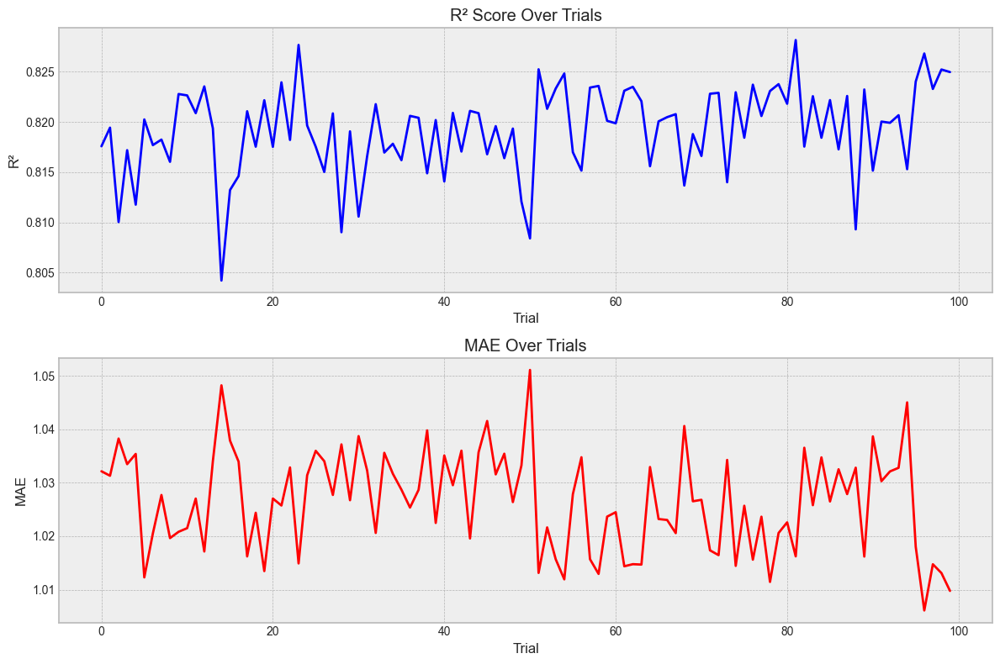


Best Trial Results:
R² Score: 0.8281
MAE: 1.0162


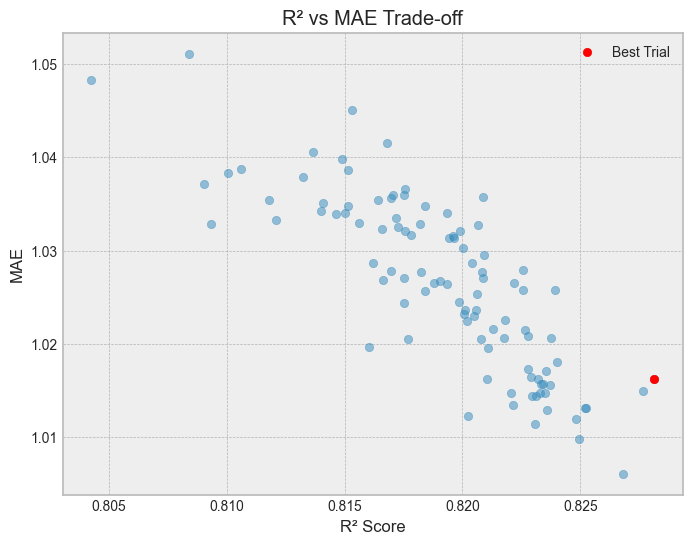


Model saved to ../../models/final_model_weather_trigmonth2.joblib


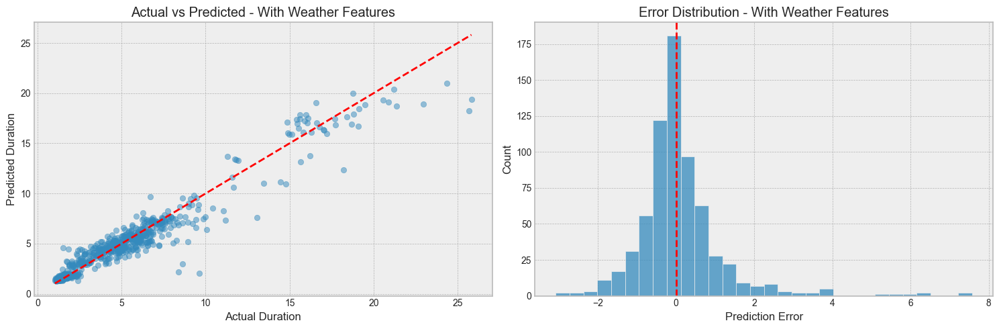


Error Analysis for With Weather Features:
Mean Absolute Error: 0.68 minutes
Median Absolute Error: 0.39 minutes
90th percentile of absolute error: 1.51 minutes
95th percentile of absolute error: 2.19 minutes

Optimization History:

Parameter Parallel Coordinates:

Optimization Analysis:
Total number of trials: 100
Best value: 0.8887
Improvements in last 25% of trials: 1
Average trials between improvements: 16.0


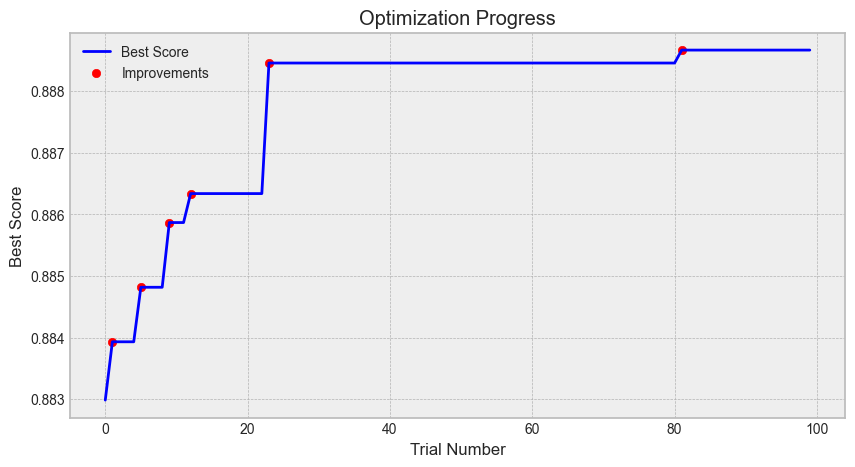


Parameter Convergence Analysis:

iterations:
  Recent std / Overall std: 0.797


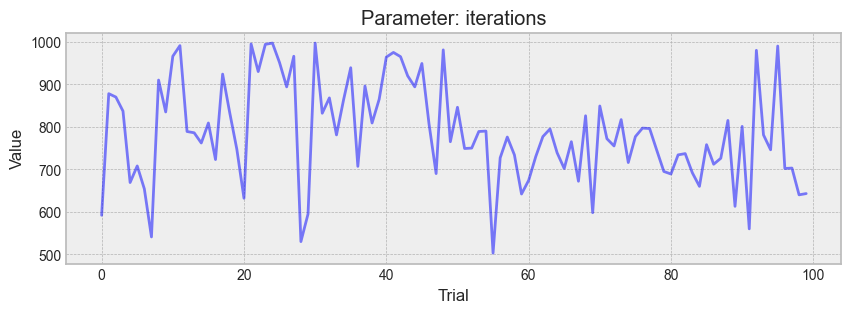

  ⚠ Parameter might benefit from more trials

learning_rate:
  Recent std / Overall std: 0.653


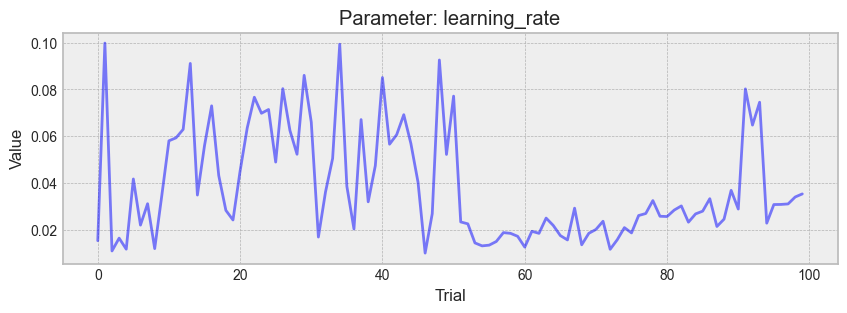

  ⚠ Parameter might benefit from more trials

depth:
  Recent std / Overall std: 1.054


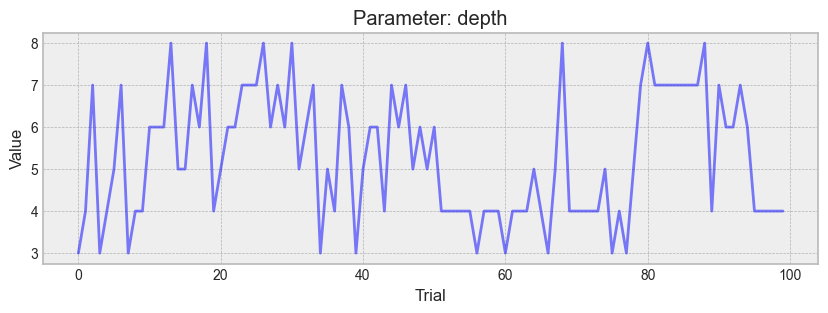

  ⚠ Parameter might benefit from more trials

max_leaves:
  Recent std / Overall std: 1.262


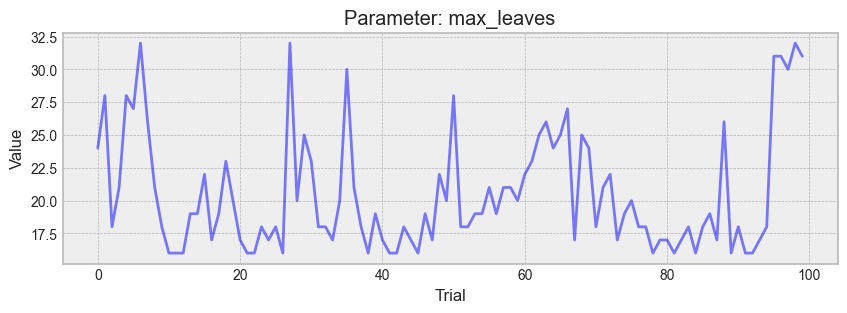

  ⚠ Parameter might benefit from more trials

min_data_in_leaf:
  Recent std / Overall std: 0.464


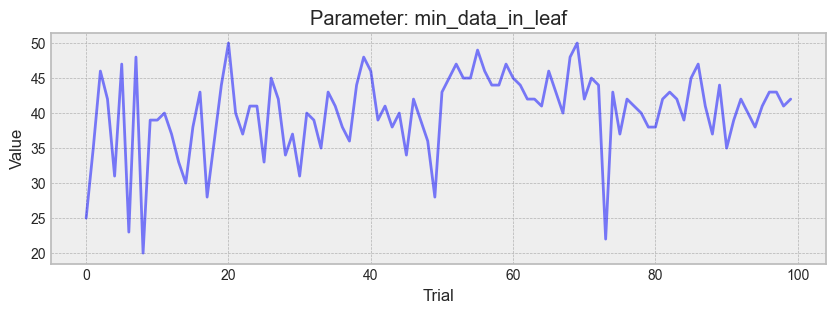

  ✓ Parameter appears to have converged

subsample:
  Recent std / Overall std: 0.713


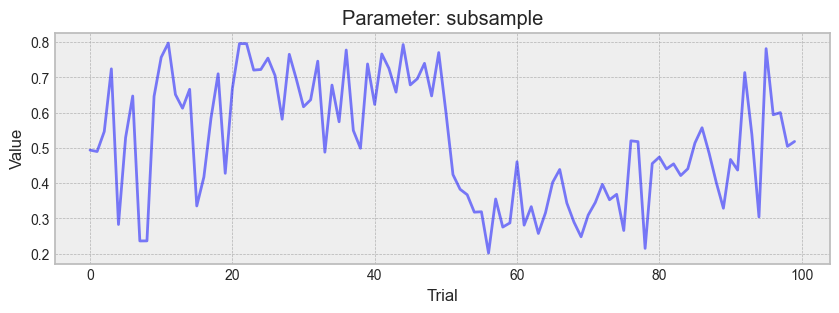

  ⚠ Parameter might benefit from more trials

l2_leaf_reg:
  Recent std / Overall std: 0.684


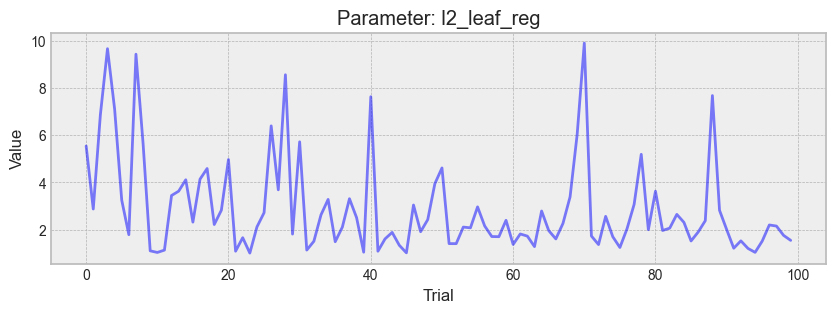

  ⚠ Parameter might benefit from more trials

random_strength:
  Recent std / Overall std: 0.649


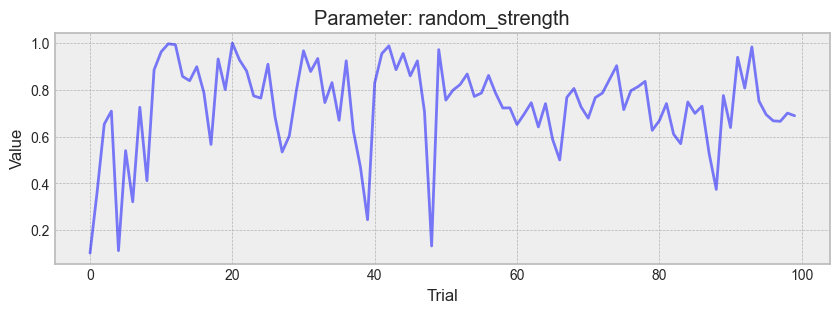

[I 2024-11-27 20:11:19,819] A new study created in memory with name: catboost_Without Weather Features


  ⚠ Parameter might benefit from more trials

Optimizing model: Without Weather Features

Optimizing model for Without Weather Features


100%|██████████| 100/100 [08:55<00:00,  5.35s/it]


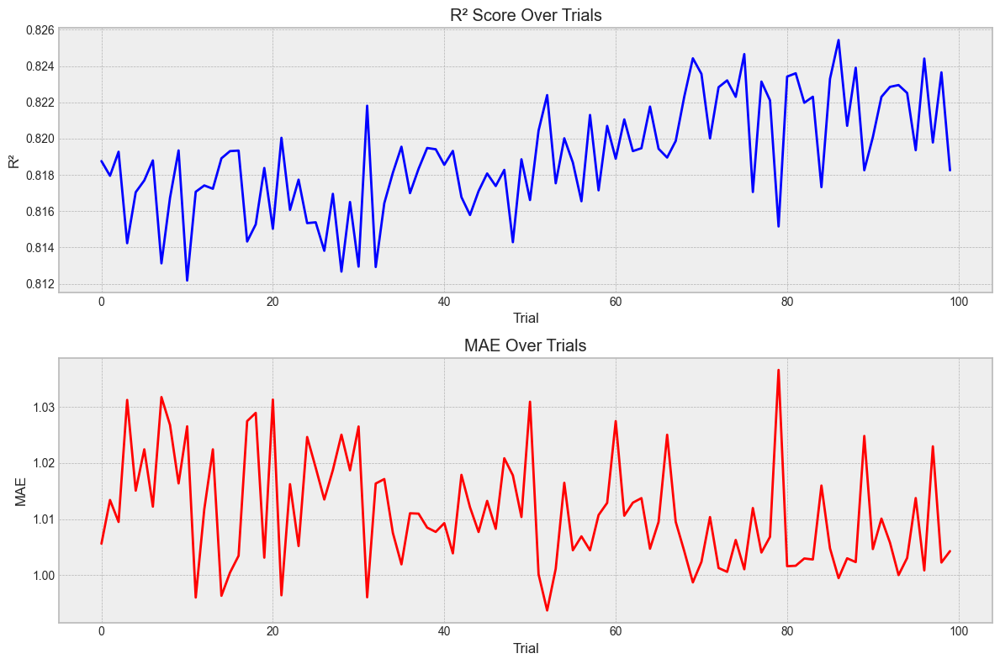


Best Trial Results:
R² Score: 0.8254
MAE: 0.9995


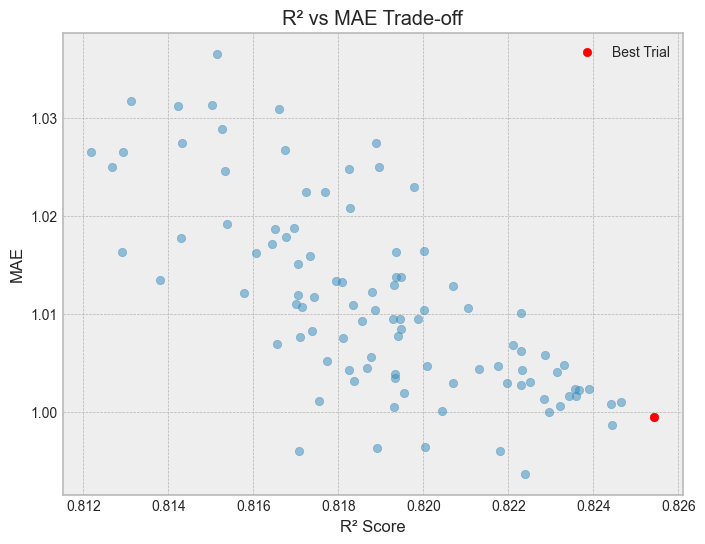


Model saved to ../../models/final_model_no_weather_trigmonth2.joblib


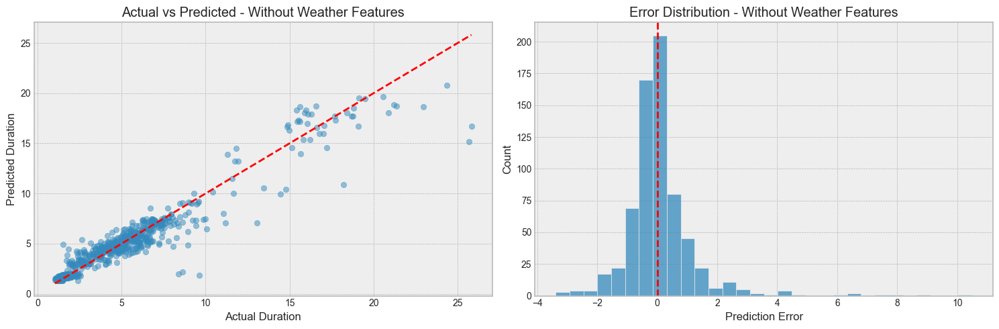


Error Analysis for Without Weather Features:
Mean Absolute Error: 0.70 minutes
Median Absolute Error: 0.39 minutes
90th percentile of absolute error: 1.61 minutes
95th percentile of absolute error: 2.36 minutes

Optimization History:

Parameter Parallel Coordinates:

Optimization Analysis:
Total number of trials: 100
Best value: 0.8877
Improvements in last 25% of trials: 1
Average trials between improvements: 10.5


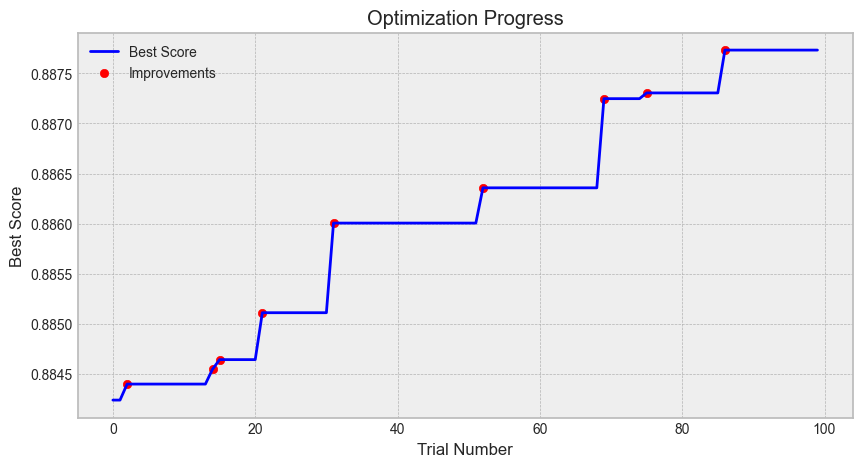


Parameter Convergence Analysis:

iterations:
  Recent std / Overall std: 0.174


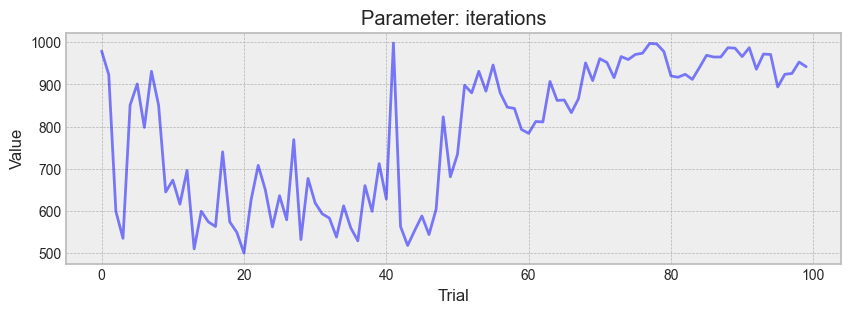

  ✓ Parameter appears to have converged

learning_rate:
  Recent std / Overall std: 0.316


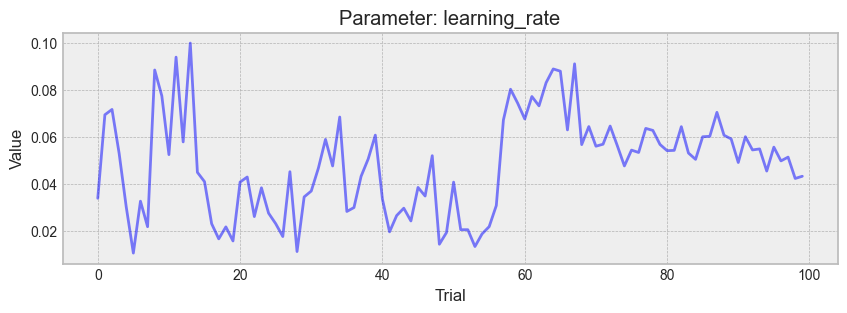

  ✓ Parameter appears to have converged

depth:
  Recent std / Overall std: 0.333


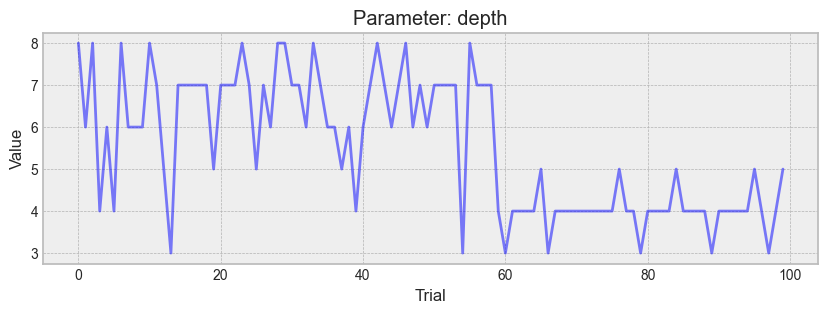

  ✓ Parameter appears to have converged

max_leaves:
  Recent std / Overall std: 0.386


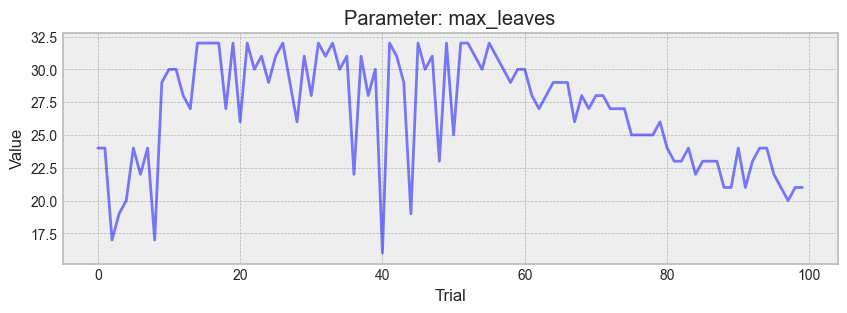

  ✓ Parameter appears to have converged

min_data_in_leaf:
  Recent std / Overall std: 0.352


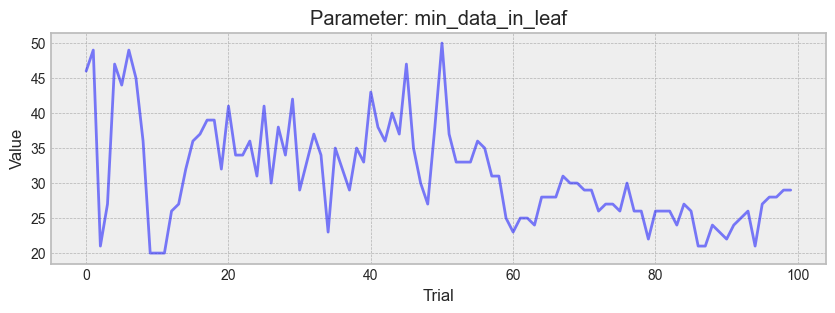

  ✓ Parameter appears to have converged

subsample:
  Recent std / Overall std: 0.182


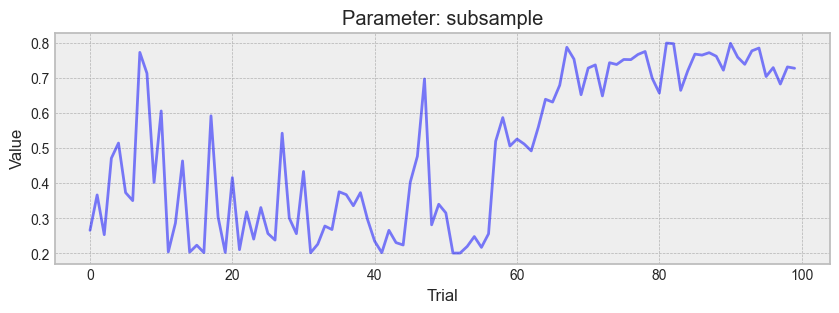

  ✓ Parameter appears to have converged

l2_leaf_reg:
  Recent std / Overall std: 0.358


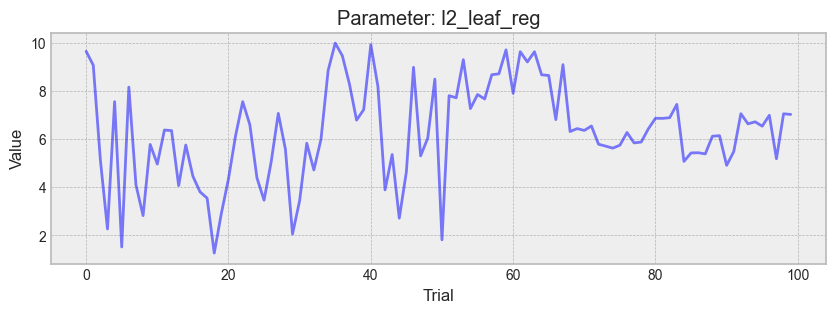

  ✓ Parameter appears to have converged

random_strength:
  Recent std / Overall std: 0.470


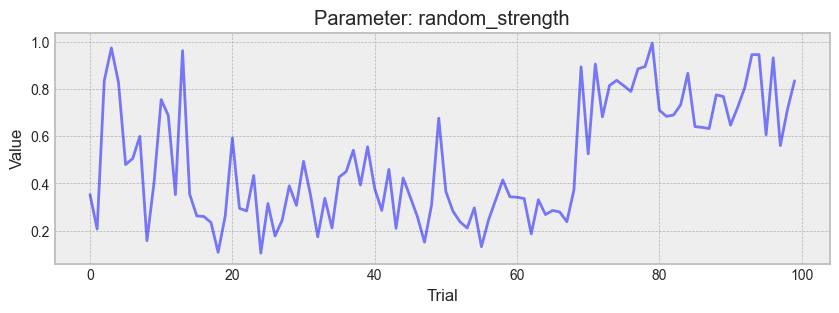

  ✓ Parameter appears to have converged

Optimization Results Summary:
--------------------------------------------------

with_weather:
Best score: 0.8887
Best parameters:
  iterations: 734
  learning_rate: 0.028438651835768238
  depth: 7
  max_leaves: 16
  min_data_in_leaf: 42
  subsample: 0.44050025191334685
  l2_leaf_reg: 1.962331844369854
  random_strength: 0.7407747257111124

without_weather:
Best score: 0.8877
Best parameters:
  iterations: 965
  learning_rate: 0.06017903818666932
  depth: 4
  max_leaves: 23
  min_data_in_leaf: 21
  subsample: 0.7645985627770631
  l2_leaf_reg: 5.425639171152361
  random_strength: 0.6373156531769975


In [34]:
# Define feature sets and configurations
MODEL_CONFIGS = {
    'with_weather': {
        'features': selected_features2,
        'name': 'With Weather Features',
        'save_path': '../../models/final_model_weather_trigmonth2.joblib'
    },
    'without_weather': {
        'features': ['distance', 'minutes_sin', 'minutes_cos', 'origin_id',
                     'month_cos', 'month_sin', 'day_of_week_cos', 'day_of_week_sin'],
        'name': 'Without Weather Features',
        'save_path': '../../models/final_model_no_weather_trigmonth2.joblib'
    }
}

# Run optimization for both feature sets
optuna_results = {}
model_results = {}  # Store the final model results

# In the main loop where the error occurs
for model_type, config in MODEL_CONFIGS.items():
    print(f"\nOptimizing model: {config['name']}")
    # Make sure we're using all rows from X_train for these features
    X = X_train[config['features']].reset_index(drop=True)
    y = y_train.reset_index(drop=True)
    
    try:
        # Run Optuna optimization
        study = optimize_model(X, y, config['name'])
        optuna_results[model_type] = study
        
        # Train final model with best parameters
        results = train_final_model(X, y, study.best_params, config['name'])
        model_results[model_type] = results
        
        # Save model
        save_model_info(results, config)
        
        # Analyze errors
        analyze_errors(
            results['predictions']['y_train'],
            results['predictions']['y_pred_train'],
            config['name']
        )
        analyze_optimization_convergence(study)
    except Exception as e:
        print(f"Error processing {model_type}: {str(e)}")
        continue

# Print optimization results summary
print("\nOptimization Results Summary:")
print("-" * 50)
for model_type, study in optuna_results.items():
    if study.best_trial:
        print(f"\n{model_type}:")
        print(f"Best score: {study.best_trial.value:.4f}")
        print("Best parameters:")
        for key, value in study.best_trial.params.items():
            print(f"  {key}: {value}")


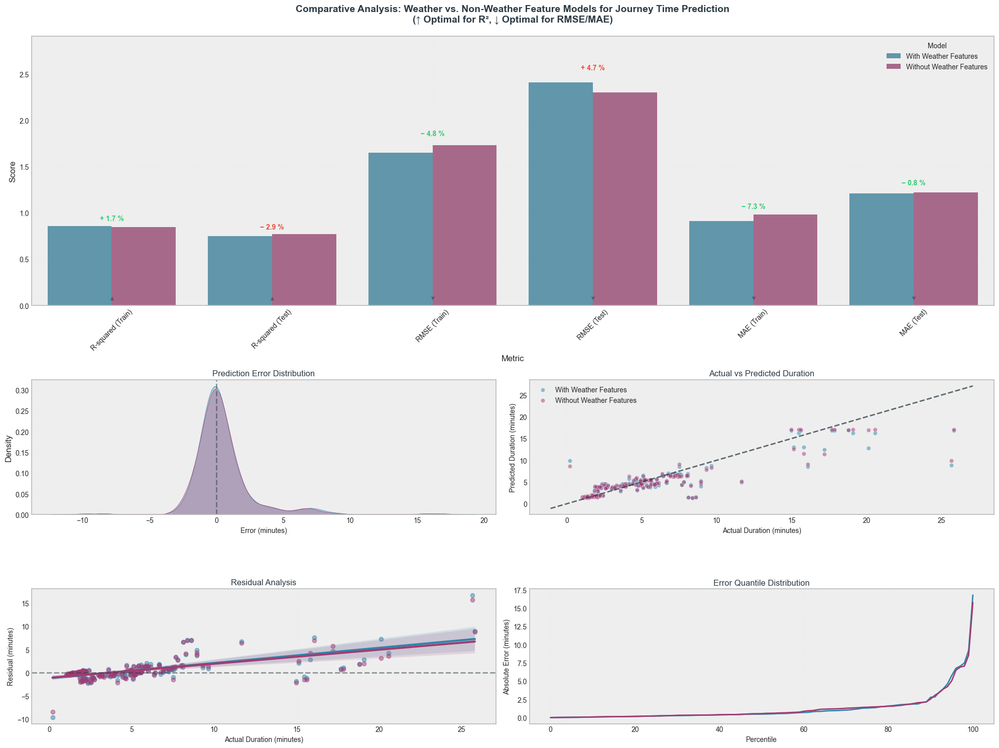


📊 Detailed Model Comparison:
                   Model Train R² Test R² Train RMSE Test RMSE Train MAE Test MAE  Parameters
   With Weather Features   0.8594  0.7489       1.65      2.41      0.91     1.21           8
Without Weather Features   0.8449  0.7710       1.73      2.30      0.98     1.22           8

📈 Detailed Error Analysis:

🔍 With Weather Features:
  • Mean Error: 0.50 ± 2.37 minutes
  • Median Absolute Error: 0.47 minutes
  • Error Range: [-9.71, 16.78] minutes
  • Error Quartiles: [-0.44759425 -0.00727292  0.67789211]
  • 90th percentile of absolute error: 2.78 minutes
  • 95th percentile of absolute error: 5.76 minutes
  • Skewness: 2.572
  • Kurtosis: 16.246

🔍 Without Weather Features:
  • Mean Error: 0.46 ± 2.26 minutes
  • Median Absolute Error: 0.54 minutes
  • Error Range: [-8.46, 15.76] minutes
  • Error Quartiles: [-4.01606473e-01 -3.53495678e-04  7.28267388e-01]
  • 90th percentile of absolute error: 2.55 minutes
  • 95th percentile of absolute error: 5.05 mi

In [80]:
visualize_model_comparison(model_results)

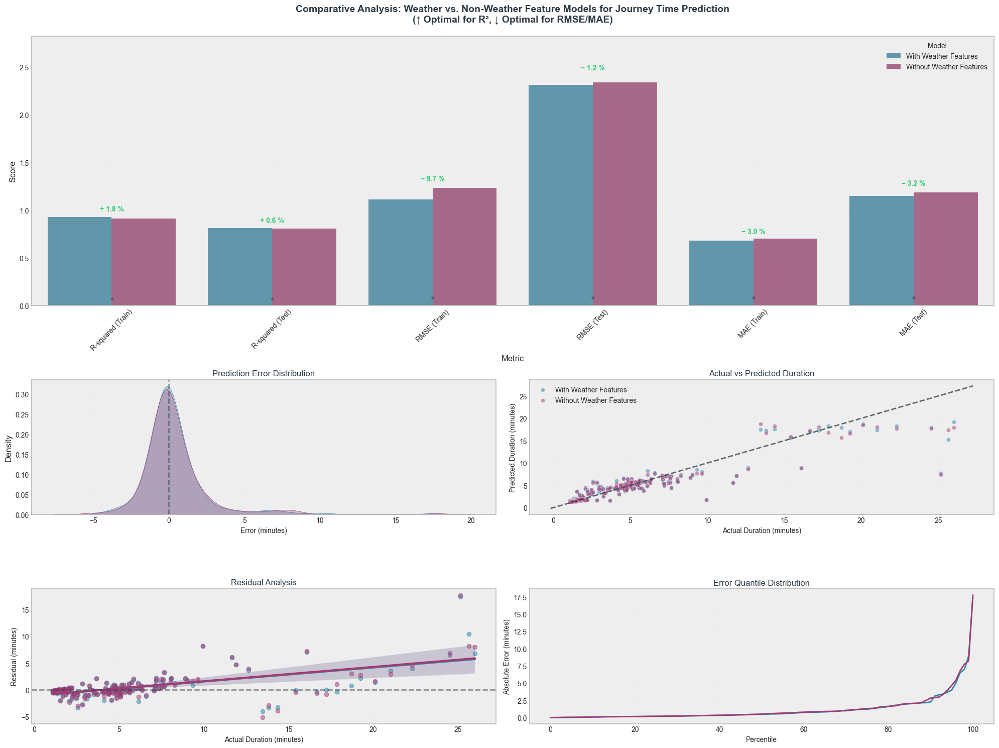


📊 Detailed Model Comparison:
                   Model Train R² Test R² Train RMSE Test RMSE Train MAE Test MAE  Parameters
   With Weather Features   0.9282  0.8128       1.11      2.31      0.68     1.15           8
Without Weather Features   0.9118  0.8080       1.23      2.34      0.70     1.19           8

📈 Detailed Error Analysis:

🔍 With Weather Features:
  • Mean Error: 0.38 ± 2.29 minutes
  • Median Absolute Error: 0.48 minutes
  • Error Range: [-4.02, 17.43] minutes
  • Error Quartiles: [-0.44872757 -0.07596501  0.55143868]
  • 90th percentile of absolute error: 2.28 minutes
  • 95th percentile of absolute error: 4.00 minutes
  • Skewness: 3.654
  • Kurtosis: 20.972

🔍 Without Weather Features:
  • Mean Error: 0.39 ± 2.31 minutes
  • Median Absolute Error: 0.50 minutes
  • Error Range: [-5.21, 17.77] minutes
  • Error Quartiles: [-0.47026104 -0.09966406  0.61909084]
  • 90th percentile of absolute error: 2.83 minutes
  • 95th percentile of absolute error: 4.68 minutes
  • Sk

In [35]:
visualize_model_comparison(model_results)

## SVM

[I 2024-11-28 05:51:28,555] A new study created in memory with name: svr_SVR With Weather Features



Optimizing model: SVR With Weather Features

Optimizing model for SVR With Weather Features


  1%|          | 1/100 [00:00<00:10,  9.08it/s]


Trial Results - R2: 0.2312, MAE: 2.4907, Score: 0.5533


[I 2024-11-28 05:51:28,780] Trial 1 finished with value: 0.7655614750388886 and parameters: {'kernel': 'rbf', 'C': 2.3187484503621327, 'epsilon': 0.19112258078998826, 'gamma': 0.022727453745748694}. Best is trial 1 with value: 0.7655614750388886.
  2%|▏         | 2/100 [00:00<00:10,  9.07it/s][I 2024-11-28 05:51:28,859] Trial 2 finished with value: 0.4678712465677442 and parameters: {'kernel': 'rbf', 'C': 0.10315453513398526, 'epsilon': 0.33338612625758335, 'gamma': 0.01796109784073747}. Best is trial 1 with value: 0.7655614750388886.



Trial Results - R2: 0.6154, MAE: 1.6849, Score: 0.7656

Trial Results - R2: 0.0744, MAE: 2.7736, Score: 0.4679


[I 2024-11-28 05:51:28,971] Trial 3 finished with value: 0.7726436368577039 and parameters: {'kernel': 'rbf', 'C': 8.733639992753929, 'epsilon': 0.3220270432423292, 'gamma': 0.04018663779562747}. Best is trial 3 with value: 0.7726436368577039.



Trial Results - R2: 0.6339, MAE: 1.7716, Score: 0.7726


  5%|▌         | 5/100 [00:00<00:10,  8.93it/s]


Trial Results - R2: 0.0249, MAE: 2.7527, Score: 0.4436


[I 2024-11-28 05:51:29,190] Trial 5 finished with value: 0.7208520479218072 and parameters: {'kernel': 'rbf', 'C': 4.466539106430556, 'epsilon': 0.4477268996210031, 'gamma': 0.040874612793930266}. Best is trial 3 with value: 0.7726436368577039.
[I 2024-11-28 05:51:29,248] Trial 6 finished with value: 0.6176362938679273 and parameters: {'kernel': 'rbf', 'C': 0.7279260427139528, 'epsilon': 0.4915618405809531, 'gamma': 0.010390266450628733}. Best is trial 3 with value: 0.7726436368577039.
  7%|▋         | 7/100 [00:00<00:08, 10.72it/s]


Trial Results - R2: 0.5460, MAE: 2.0851, Score: 0.7209

Trial Results - R2: 0.3571, MAE: 2.4358, Score: 0.6176

Trial Results - R2: 0.3996, MAE: 2.1622, Score: 0.6458

[I 2024-11-28 05:51:29,383] Trial 7 finished with value: 0.6457692177848107 and parameters: {'kernel': 'rbf', 'C': 1.7612578333363758, 'epsilon': 0.19361342664837858, 'gamma': 0.2798328418048868}. Best is trial 3 with value: 0.7726436368577039.
[I 2024-11-28 05:51:29,475] Trial 8 finished with value: 0.6242993699655188 and parameters: {'kernel': 'rbf', 'C': 0.31436362950692415, 'epsilon': 0.2400031271383814, 'gamma': 0.10565394779544683}. Best is trial 3 with value: 0.7726436368577039.
  9%|▉         | 9/100 [00:00<00:09,  9.93it/s][I 2024-11-28 05:51:29,574] Trial 9 finished with value: 0.42051789033424886 and parameters: {'kernel': 'rbf', 'C': 0.36079293567351506, 'epsilon': 0.3898048692564897, 'gamma': 0.7453532593597919}. Best is trial 3 with value: 0.7726436368577039.




Trial Results - R2: 0.3629, MAE: 2.2856, Score: 0.6243

Trial Results - R2: -0.0167, MAE: 2.8457, Score: 0.4205


[I 2024-11-28 05:51:29,789] Trial 10 finished with value: 0.7088468669132055 and parameters: {'kernel': 'rbf', 'C': 9.978796202399266, 'epsilon': 0.048687263524240215, 'gamma': 0.08886309515614779}. Best is trial 3 with value: 0.7726436368577039.
 12%|█▏        | 12/100 [00:01<00:10,  8.01it/s]


Trial Results - R2: 0.5057, MAE: 1.7603, Score: 0.7088

Trial Results - R2: 0.6167, MAE: 1.6279, Score: 0.7676


[I 2024-11-28 05:51:30,085] Trial 12 finished with value: 0.7891811436109245 and parameters: {'kernel': 'rbf', 'C': 2.8941459142693327, 'epsilon': 0.014560579434673662, 'gamma': 0.05687460725814385}. Best is trial 12 with value: 0.7891811436109245.
 14%|█▍        | 14/100 [00:01<00:12,  7.10it/s]


Trial Results - R2: 0.6566, MAE: 1.5656, Score: 0.7892

Trial Results - R2: 0.6243, MAE: 1.6145, Score: 0.7718


[I 2024-11-28 05:51:30,353] Trial 14 finished with value: 0.6609520310144745 and parameters: {'kernel': 'rbf', 'C': 9.895194295037076, 'epsilon': 0.33881497654669623, 'gamma': 0.17431924048623798}. Best is trial 12 with value: 0.7891811436109245.
 15%|█▌        | 15/100 [00:01<00:11,  7.67it/s][I 2024-11-28 05:51:30,449] Trial 15 finished with value: 0.7404712163903886 and parameters: {'kernel': 'rbf', 'C': 1.0638009209036872, 'epsilon': 0.29896186329817276, 'gamma': 0.05694138388765929}. Best is trial 12 with value: 0.7891811436109245.



Trial Results - R2: 0.4322, MAE: 2.2053, Score: 0.6610

Trial Results - R2: 0.5784, MAE: 1.9497, Score: 0.7405


[I 2024-11-28 05:51:30,595] Trial 16 finished with value: 0.7491216243935922 and parameters: {'kernel': 'rbf', 'C': 4.070906993460822, 'epsilon': 0.09767361266468823, 'gamma': 0.15624770748071742}. Best is trial 12 with value: 0.7891811436109245.
 17%|█▋        | 17/100 [00:02<00:10,  7.91it/s][I 2024-11-28 05:51:30,675] Trial 17 finished with value: 0.7059973472642844 and parameters: {'kernel': 'rbf', 'C': 1.0487491831747042, 'epsilon': 0.396421122293313, 'gamma': 0.03912523961237678}. Best is trial 12 with value: 0.7891811436109245.
[I 2024-11-28 05:51:30,800] Trial 18 finished with value: 0.7436175316288142 and parameters: {'kernel': 'rbf', 'C': 5.943157283029201, 'epsilon': 0.24047927391865387, 'gamma': 0.014816292142461699}. Best is trial 12 with value: 0.7891811436109245.



Trial Results - R2: 0.5854, MAE: 1.7431, Score: 0.7491

Trial Results - R2: 0.5179, MAE: 2.1185, Score: 0.7060

Trial Results - R2: 0.5724, MAE: 1.7028, Score: 0.7436


 21%|██        | 21/100 [00:02<00:09,  7.94it/s]


Trial Results - R2: 0.5935, MAE: 1.7821, Score: 0.7522

Trial Results - R2: 0.6800, MAE: 1.5888, Score: 0.8003


[I 2024-11-28 05:51:31,204] Trial 21 finished with value: 0.8024432443829392 and parameters: {'kernel': 'rbf', 'C': 1.3790167831842477, 'epsilon': 0.06637562530955836, 'gamma': 0.059563337626198094}. Best is trial 21 with value: 0.8024432443829392.
 23%|██▎       | 23/100 [00:02<00:09,  8.32it/s]


Trial Results - R2: 0.6843, MAE: 1.5876, Score: 0.8024

Trial Results - R2: 0.6188, MAE: 1.8003, Score: 0.7644


[I 2024-11-28 05:51:31,454] Trial 23 finished with value: 0.7476904953315353 and parameters: {'kernel': 'rbf', 'C': 1.6391553180853542, 'epsilon': 0.010329474064306877, 'gamma': 0.025748409120187405}. Best is trial 21 with value: 0.8024432443829392.
 25%|██▌       | 25/100 [00:03<00:09,  7.67it/s]


Trial Results - R2: 0.5762, MAE: 1.6172, Score: 0.7477

Trial Results - R2: 0.6687, MAE: 1.6230, Score: 0.7938


[I 2024-11-28 05:51:31,732] Trial 25 finished with value: 0.7970083664028518 and parameters: {'kernel': 'rbf', 'C': 1.3448358073969764, 'epsilon': 0.08441062289686466, 'gamma': 0.07450754018352751}. Best is trial 21 with value: 0.8024432443829392.
 27%|██▋       | 27/100 [00:03<00:09,  7.49it/s]


Trial Results - R2: 0.6749, MAE: 1.6173, Score: 0.7970

Trial Results - R2: 0.4167, MAE: 2.1350, Score: 0.6550


[I 2024-11-28 05:51:31,996] Trial 27 finished with value: 0.7540489259908043 and parameters: {'kernel': 'rbf', 'C': 1.2127175154652223, 'epsilon': 0.1613813180542617, 'gamma': 0.1153691834459127}. Best is trial 21 with value: 0.8024432443829392.
 29%|██▉       | 29/100 [00:03<00:08,  8.09it/s]


Trial Results - R2: 0.5980, MAE: 1.7972, Score: 0.7540

Trial Results - R2: 0.5670, MAE: 1.9190, Score: 0.7355


[I 2024-11-28 05:51:32,240] Trial 29 finished with value: 0.6370545220939243 and parameters: {'kernel': 'rbf', 'C': 0.8936002065155613, 'epsilon': 0.09811465353794083, 'gamma': 0.3120355987830869}. Best is trial 21 with value: 0.8024432443829392.
 31%|███       | 31/100 [00:03<00:08,  8.12it/s]


Trial Results - R2: 0.3827, MAE: 2.1715, Score: 0.6371

Trial Results - R2: 0.5085, MAE: 2.0488, Score: 0.7030


[I 2024-11-28 05:51:32,496] Trial 31 finished with value: 0.7898714372395845 and parameters: {'kernel': 'rbf', 'C': 1.4605512203427575, 'epsilon': 0.08785550477198255, 'gamma': 0.08757257797642408}. Best is trial 21 with value: 0.8024432443829392.
 33%|███▎      | 33/100 [00:04<00:08,  7.59it/s]


Trial Results - R2: 0.6616, MAE: 1.6364, Score: 0.7899

Trial Results - R2: 0.6547, MAE: 1.6652, Score: 0.7857


[I 2024-11-28 05:51:32,774] Trial 33 finished with value: 0.7926172434927669 and parameters: {'kernel': 'rbf', 'C': 1.4330969698108156, 'epsilon': 0.08865641385373631, 'gamma': 0.047950386119587005}. Best is trial 21 with value: 0.8024432443829392.
 35%|███▌      | 35/100 [00:04<00:08,  7.62it/s]


Trial Results - R2: 0.6657, MAE: 1.6099, Score: 0.7926

Trial Results - R2: 0.5277, MAE: 1.9841, Score: 0.7143


[I 2024-11-28 05:51:33,052] Trial 35 finished with value: 0.6950395681835793 and parameters: {'kernel': 'rbf', 'C': 3.3543007303314885, 'epsilon': 0.11692373153343208, 'gamma': 0.019602529429060503}. Best is trial 21 with value: 0.8024432443829392.
 37%|███▋      | 37/100 [00:04<00:08,  7.14it/s]


Trial Results - R2: 0.4722, MAE: 1.6419, Score: 0.6950

Trial Results - R2: 0.6568, MAE: 1.6165, Score: 0.7880


[I 2024-11-28 05:51:33,329] Trial 37 finished with value: 0.7806497437107696 and parameters: {'kernel': 'rbf', 'C': 1.3965970304690416, 'epsilon': 0.16280288232313145, 'gamma': 0.039362734502665475}. Best is trial 21 with value: 0.8024432443829392.
 39%|███▉      | 39/100 [00:04<00:08,  7.15it/s]


Trial Results - R2: 0.6458, MAE: 1.6908, Score: 0.7806

Trial Results - R2: 0.6786, MAE: 1.6225, Score: 0.7987


[I 2024-11-28 05:51:33,586] Trial 39 finished with value: 0.6002135659731744 and parameters: {'kernel': 'rbf', 'C': 0.22351920218435298, 'epsilon': 0.06571156295791941, 'gamma': 0.02905559867340504}. Best is trial 21 with value: 0.8024432443829392.
 41%|████      | 41/100 [00:05<00:08,  7.14it/s]


Trial Results - R2: 0.3207, MAE: 2.4051, Score: 0.6002

Trial Results - R2: 0.4427, MAE: 2.0697, Score: 0.6696


[I 2024-11-28 05:51:33,877] Trial 41 finished with value: 0.7991531252728155 and parameters: {'kernel': 'rbf', 'C': 1.191876769096353, 'epsilon': 0.07634203612204443, 'gamma': 0.07090458303381858}. Best is trial 21 with value: 0.8024432443829392.
 43%|████▎     | 43/100 [00:05<00:07,  7.33it/s]


Trial Results - R2: 0.6791, MAE: 1.6166, Score: 0.7992

Trial Results - R2: 0.6712, MAE: 1.6440, Score: 0.7945


[I 2024-11-28 05:51:34,141] Trial 43 finished with value: 0.7926312426006434 and parameters: {'kernel': 'rbf', 'C': 1.8356899199737884, 'epsilon': 0.140858686288522, 'gamma': 0.06514736037963292}. Best is trial 21 with value: 0.8024432443829392.
 45%|████▌     | 45/100 [00:05<00:07,  7.65it/s]


Trial Results - R2: 0.6671, MAE: 1.6372, Score: 0.7926

Trial Results - R2: 0.6532, MAE: 1.6960, Score: 0.7842


[I 2024-11-28 05:51:34,396] Trial 45 finished with value: 0.7679184146866186 and parameters: {'kernel': 'rbf', 'C': 2.554349141571292, 'epsilon': 0.18839607395685606, 'gamma': 0.10049766498894706}. Best is trial 21 with value: 0.8024432443829392.
 47%|████▋     | 47/100 [00:05<00:07,  7.54it/s]


Trial Results - R2: 0.6224, MAE: 1.7313, Score: 0.7679

Trial Results - R2: 0.6113, MAE: 1.7345, Score: 0.7623


[I 2024-11-28 05:51:34,645] Trial 47 finished with value: 0.7689567354691627 and parameters: {'kernel': 'rbf', 'C': 0.9230960591657641, 'epsilon': 0.13340460676424262, 'gamma': 0.03513964766785571}. Best is trial 21 with value: 0.8024432443829392.
 49%|████▉     | 49/100 [00:06<00:06,  8.16it/s]


Trial Results - R2: 0.6255, MAE: 1.7517, Score: 0.7690

Trial Results - R2: 0.6001, MAE: 1.8681, Score: 0.7534


[I 2024-11-28 05:51:34,912] Trial 49 finished with value: 0.7762804194343457 and parameters: {'kernel': 'rbf', 'C': 3.2174577960056543, 'epsilon': 0.07193525824443278, 'gamma': 0.044002006653015624}. Best is trial 21 with value: 0.8024432443829392.
 51%|█████     | 51/100 [00:06<00:06,  7.23it/s]


Trial Results - R2: 0.6320, MAE: 1.5878, Score: 0.7763

Trial Results - R2: 0.0590, MAE: 2.6905, Score: 0.4622


[I 2024-11-28 05:51:35,183] Trial 51 finished with value: 0.7963800110708159 and parameters: {'kernel': 'rbf', 'C': 1.1916609508779767, 'epsilon': 0.10813594474349134, 'gamma': 0.062373291949673414}. Best is trial 21 with value: 0.8024432443829392.
 53%|█████▎    | 53/100 [00:06<00:06,  6.97it/s]


Trial Results - R2: 0.6743, MAE: 1.6311, Score: 0.7964

Trial Results - R2: 0.6704, MAE: 1.6466, Score: 0.7940


[I 2024-11-28 05:51:35,467] Trial 53 finished with value: 0.8012358123856158 and parameters: {'kernel': 'rbf', 'C': 1.265116406712834, 'epsilon': 0.07415134236839867, 'gamma': 0.06512424641697319}. Best is trial 21 with value: 0.8024432443829392.
 55%|█████▌    | 55/100 [00:07<00:06,  7.31it/s]


Trial Results - R2: 0.6825, MAE: 1.6011, Score: 0.8012

Trial Results - R2: 0.6449, MAE: 1.6490, Score: 0.7812


[I 2024-11-28 05:51:35,760] Trial 55 finished with value: 0.7903034831933288 and parameters: {'kernel': 'rbf', 'C': 0.9650606492642102, 'epsilon': 0.03003167067534055, 'gamma': 0.08667442602942034}. Best is trial 21 with value: 0.8024432443829392.
 57%|█████▋    | 57/100 [00:07<00:06,  6.92it/s]


Trial Results - R2: 0.6639, MAE: 1.6650, Score: 0.7903

Trial Results - R2: 0.6692, MAE: 1.5744, Score: 0.7952


[I 2024-11-28 05:51:36,058] Trial 57 finished with value: 0.7998622706427989 and parameters: {'kernel': 'rbf', 'C': 1.5832900315114156, 'epsilon': 0.055734688078104576, 'gamma': 0.053755180671579965}. Best is trial 21 with value: 0.8024432443829392.
 59%|█████▉    | 59/100 [00:07<00:05,  7.29it/s]


Trial Results - R2: 0.6785, MAE: 1.5747, Score: 0.7999

Trial Results - R2: 0.5646, MAE: 1.9818, Score: 0.7327


[I 2024-11-28 05:51:36,301] Trial 59 finished with value: 0.7315007594710081 and parameters: {'kernel': 'rbf', 'C': 0.5955716124431575, 'epsilon': 0.13111766662842114, 'gamma': 0.03418779792860064}. Best is trial 21 with value: 0.8024432443829392.
 61%|██████    | 61/100 [00:07<00:05,  7.76it/s]


Trial Results - R2: 0.5594, MAE: 1.9289, Score: 0.7315

Trial Results - R2: 0.6214, MAE: 1.7914, Score: 0.7659


[I 2024-11-28 05:51:36,536] Trial 61 finished with value: 0.5310687715780003 and parameters: {'kernel': 'rbf', 'C': 0.11778105359072939, 'epsilon': 0.056402497052778194, 'gamma': 0.054861272407994204}. Best is trial 21 with value: 0.8024432443829392.
 63%|██████▎   | 63/100 [00:08<00:04,  7.60it/s]


Trial Results - R2: 0.1918, MAE: 2.5934, Score: 0.5311

Trial Results - R2: 0.6550, MAE: 1.6249, Score: 0.7869


[I 2024-11-28 05:51:36,828] Trial 63 finished with value: 0.7996484549069371 and parameters: {'kernel': 'rbf', 'C': 2.060589220882163, 'epsilon': 0.02509389238372251, 'gamma': 0.06841651623043624}. Best is trial 21 with value: 0.8024432443829392.
 64%|██████▍   | 64/100 [00:08<00:04,  7.38it/s][I 2024-11-28 05:51:37,009] Trial 64 finished with value: 0.7799753401635043 and parameters: {'kernel': 'rbf', 'C': 2.07457632895487, 'epsilon': 0.02211941881347658, 'gamma': 0.11340047427960012}. Best is trial 21 with value: 0.8024432443829392.



Trial Results - R2: 0.6771, MAE: 1.5565, Score: 0.7996

Trial Results - R2: 0.6423, MAE: 1.6477, Score: 0.7800


 66%|██████▌   | 66/100 [00:08<00:05,  6.65it/s][I 2024-11-28 05:51:37,255] Trial 66 finished with value: 0.6787480334171031 and parameters: {'kernel': 'rbf', 'C': 5.342435580122593, 'epsilon': 0.43184233646489023, 'gamma': 0.09169936473860203}. Best is trial 21 with value: 0.8024432443829392.



Trial Results - R2: 0.6634, MAE: 1.5730, Score: 0.7924

Trial Results - R2: 0.4682, MAE: 2.2142, Score: 0.6787


[I 2024-11-28 05:51:37,429] Trial 67 finished with value: 0.590605025812114 and parameters: {'kernel': 'rbf', 'C': 1.6104347456060422, 'epsilon': 0.025046061207308415, 'gamma': 0.46980448333362707}. Best is trial 21 with value: 0.8024432443829392.
 69%|██████▉   | 69/100 [00:09<00:04,  6.91it/s]


Trial Results - R2: 0.2951, MAE: 2.2773, Score: 0.5906

Trial Results - R2: 0.6530, MAE: 1.5980, Score: 0.7866


[I 2024-11-28 05:51:37,739] Trial 69 finished with value: 0.7925196290945907 and parameters: {'kernel': 'rbf', 'C': 2.4296224365042804, 'epsilon': 0.04951460563921048, 'gamma': 0.08078231048270504}. Best is trial 21 with value: 0.8024432443829392.
 71%|███████   | 71/100 [00:09<00:04,  7.07it/s]


Trial Results - R2: 0.6645, MAE: 1.5890, Score: 0.7925

Trial Results - R2: 0.6383, MAE: 1.7390, Score: 0.7757


[I 2024-11-28 05:51:37,999] Trial 71 finished with value: 0.799311716853734 and parameters: {'kernel': 'rbf', 'C': 1.303279704512037, 'epsilon': 0.08624542407781685, 'gamma': 0.06775829155171303}. Best is trial 21 with value: 0.8024432443829392.
 73%|███████▎  | 73/100 [00:09<00:03,  7.19it/s]


Trial Results - R2: 0.6791, MAE: 1.6102, Score: 0.7993

Trial Results - R2: 0.6780, MAE: 1.5866, Score: 0.7993


[I 2024-11-28 05:51:38,266] Trial 73 finished with value: 0.7945681783674194 and parameters: {'kernel': 'rbf', 'C': 1.9278038354567881, 'epsilon': 0.12185867276254242, 'gamma': 0.05044514943966158}. Best is trial 21 with value: 0.8024432443829392.
 75%|███████▌  | 75/100 [00:09<00:03,  7.41it/s]


Trial Results - R2: 0.6696, MAE: 1.6088, Score: 0.7946

Trial Results - R2: 0.6778, MAE: 1.5961, Score: 0.7990


[I 2024-11-28 05:51:38,551] Trial 75 finished with value: 0.7984009106889851 and parameters: {'kernel': 'rbf', 'C': 1.3621223014707837, 'epsilon': 0.03620988641312926, 'gamma': 0.08331343988809971}. Best is trial 21 with value: 0.8024432443829392.
 76%|███████▌  | 76/100 [00:09<00:03,  7.11it/s][I 2024-11-28 05:51:38,626] Trial 76 finished with value: 0.6002324819207016 and parameters: {'kernel': 'rbf', 'C': 2.2551498006216373, 'epsilon': 0.4962121774856666, 'gamma': 0.17203988540004034}. Best is trial 21 with value: 0.8024432443829392.



Trial Results - R2: 0.6772, MAE: 1.6080, Score: 0.7984

Trial Results - R2: 0.3247, MAE: 2.4849, Score: 0.6002


[I 2024-11-28 05:51:38,761] Trial 77 finished with value: 0.7793480527833467 and parameters: {'kernel': 'rbf', 'C': 1.6197161336638184, 'epsilon': 0.05442091343142542, 'gamma': 0.035941988349972885}. Best is trial 21 with value: 0.8024432443829392.
 79%|███████▉  | 79/100 [00:10<00:02,  7.45it/s]


Trial Results - R2: 0.6380, MAE: 1.5856, Score: 0.7793

Trial Results - R2: 0.6211, MAE: 1.6788, Score: 0.7686


[I 2024-11-28 05:51:39,074] Trial 79 finished with value: 0.8046439580328903 and parameters: {'kernel': 'rbf', 'C': 1.2188012194304403, 'epsilon': 0.011737461206019387, 'gamma': 0.06089241418650356}. Best is trial 79 with value: 0.8046439580328903.
 81%|████████  | 81/100 [00:10<00:02,  7.14it/s]


Trial Results - R2: 0.6885, MAE: 1.5846, Score: 0.8046

Trial Results - R2: 0.6325, MAE: 1.6069, Score: 0.7761


[I 2024-11-28 05:51:39,370] Trial 81 finished with value: 0.803978491751971 and parameters: {'kernel': 'rbf', 'C': 1.234470015428327, 'epsilon': 0.030408702585836084, 'gamma': 0.06110120126581813}. Best is trial 79 with value: 0.8046439580328903.
 83%|████████▎ | 83/100 [00:10<00:02,  6.97it/s]


Trial Results - R2: 0.6873, MAE: 1.5872, Score: 0.8040

Trial Results - R2: 0.6772, MAE: 1.6307, Score: 0.7978


[I 2024-11-28 05:51:39,653] Trial 83 finished with value: 0.7913247752570334 and parameters: {'kernel': 'rbf', 'C': 1.7693137075688332, 'epsilon': 0.03654950163143245, 'gamma': 0.04359050960409844}. Best is trial 79 with value: 0.8046439580328903.
 85%|████████▌ | 85/100 [00:11<00:02,  7.16it/s]


Trial Results - R2: 0.6605, MAE: 1.5573, Score: 0.7913

Trial Results - R2: 0.6748, MAE: 1.6109, Score: 0.7971


[I 2024-11-28 05:51:39,962] Trial 85 finished with value: 0.7934896066431052 and parameters: {'kernel': 'rbf', 'C': 2.026249041578635, 'epsilon': 0.020267848402551122, 'gamma': 0.08684513833095056}. Best is trial 79 with value: 0.8046439580328903.
 87%|████████▋ | 87/100 [00:11<00:01,  6.66it/s]


Trial Results - R2: 0.6665, MAE: 1.5898, Score: 0.7935

Trial Results - R2: 0.6589, MAE: 1.6317, Score: 0.7887


[I 2024-11-28 05:51:40,251] Trial 87 finished with value: 0.7862824374791435 and parameters: {'kernel': 'rbf', 'C': 0.8562364083409091, 'epsilon': 0.041911694317756404, 'gamma': 0.07917220530453158}. Best is trial 79 with value: 0.8046439580328903.
 89%|████████▉ | 89/100 [00:11<00:01,  7.11it/s]


Trial Results - R2: 0.6571, MAE: 1.6908, Score: 0.7863

Trial Results - R2: 0.6703, MAE: 1.6460, Score: 0.7940


[I 2024-11-28 05:51:40,508] Trial 89 finished with value: 0.7921504104640209 and parameters: {'kernel': 'rbf', 'C': 1.2809308899102594, 'epsilon': 0.09696242626559942, 'gamma': 0.04662492073691494}. Best is trial 79 with value: 0.8046439580328903.
 91%|█████████ | 91/100 [00:12<00:01,  6.92it/s]


Trial Results - R2: 0.6656, MAE: 1.6265, Score: 0.7922

Trial Results - R2: 0.6503, MAE: 1.5575, Score: 0.7862


[I 2024-11-28 05:51:40,801] Trial 91 finished with value: 0.7991763827286708 and parameters: {'kernel': 'rbf', 'C': 1.4863260911726481, 'epsilon': 0.07495309602863018, 'gamma': 0.07254552724010582}. Best is trial 79 with value: 0.8046439580328903.
 93%|█████████▎| 93/100 [00:12<00:00,  7.05it/s]


Trial Results - R2: 0.6783, MAE: 1.5994, Score: 0.7992

Trial Results - R2: 0.6847, MAE: 1.5823, Score: 0.8028


[I 2024-11-28 05:51:41,085] Trial 93 finished with value: 0.8012945547645516 and parameters: {'kernel': 'rbf', 'C': 1.1072356577596465, 'epsilon': 0.041630550103686714, 'gamma': 0.06685701481633993}. Best is trial 79 with value: 0.8046439580328903.
 95%|█████████▌| 95/100 [00:12<00:00,  7.11it/s]


Trial Results - R2: 0.6830, MAE: 1.6090, Score: 0.8013

Trial Results - R2: 0.6784, MAE: 1.6165, Score: 0.7988


[I 2024-11-28 05:51:41,364] Trial 95 finished with value: 0.7984782529673 and parameters: {'kernel': 'rbf', 'C': 2.2065686076458895, 'epsilon': 0.0607240132177563, 'gamma': 0.0602645846124957}. Best is trial 79 with value: 0.8046439580328903.
 97%|█████████▋| 97/100 [00:12<00:00,  7.49it/s]


Trial Results - R2: 0.6752, MAE: 1.5643, Score: 0.7985

Trial Results - R2: 0.6255, MAE: 1.7955, Score: 0.7678


[I 2024-11-28 05:51:41,643] Trial 97 finished with value: 0.790019502866552 and parameters: {'kernel': 'rbf', 'C': 1.9749479484149572, 'epsilon': 0.02631680247768936, 'gamma': 0.09490264609695542}. Best is trial 79 with value: 0.8046439580328903.
 99%|█████████▉| 99/100 [00:13<00:00,  7.24it/s]


Trial Results - R2: 0.6604, MAE: 1.6079, Score: 0.7900

Trial Results - R2: 0.6338, MAE: 1.7606, Score: 0.7729


[I 2024-11-28 05:51:41,930] Trial 99 finished with value: 0.7777659303823008 and parameters: {'kernel': 'rbf', 'C': 1.4969591277481074, 'epsilon': 0.04880883141396331, 'gamma': 0.11879469515374283}. Best is trial 79 with value: 0.8046439580328903.
100%|██████████| 100/100 [00:13<00:00,  7.48it/s]



Trial Results - R2: 0.6391, MAE: 1.6704, Score: 0.7778


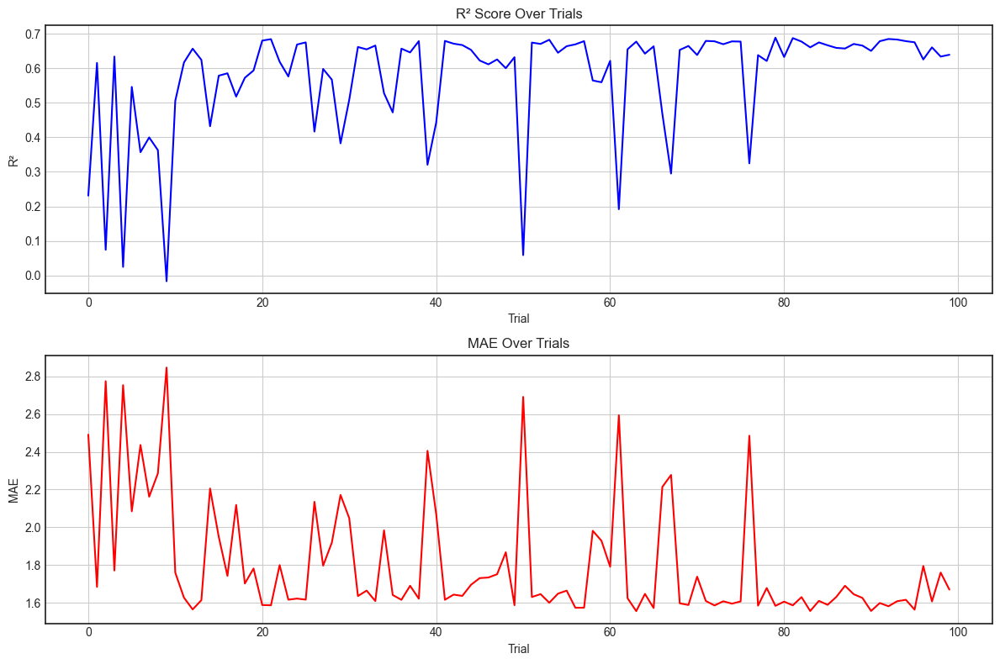


Best Trial Results:
R² Score: 0.6885
MAE: 1.5846


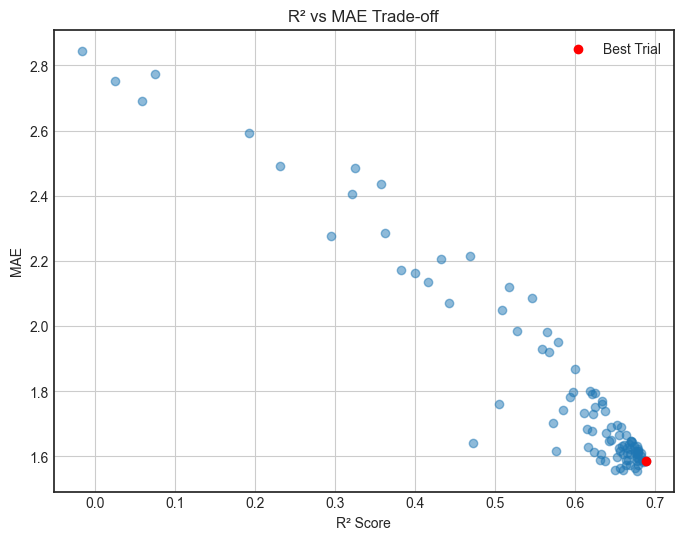


Model saved to ../../models/svr_model_weather.joblib


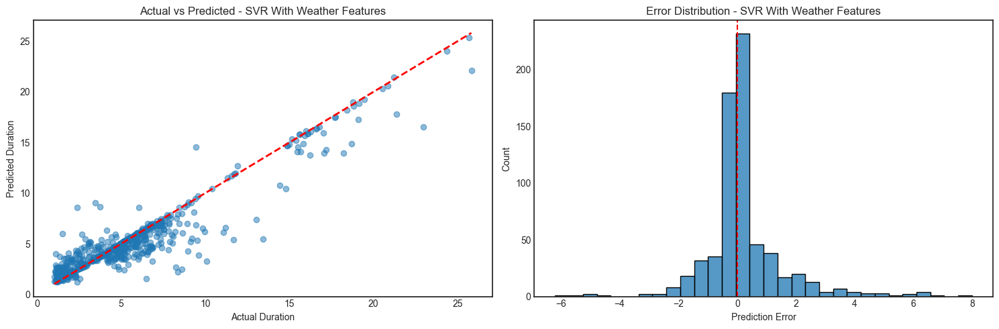


Error Analysis for SVR With Weather Features:
Mean Absolute Error: 0.76 minutes
Median Absolute Error: 0.25 minutes
90th percentile of absolute error: 2.06 minutes
95th percentile of absolute error: 2.91 minutes

Optimization History:

Parameter Parallel Coordinates:

Optimization Analysis:
Total number of trials: 100
Best value: 0.8046
Improvements in last 25% of trials: 1
Average trials between improvements: 15.6


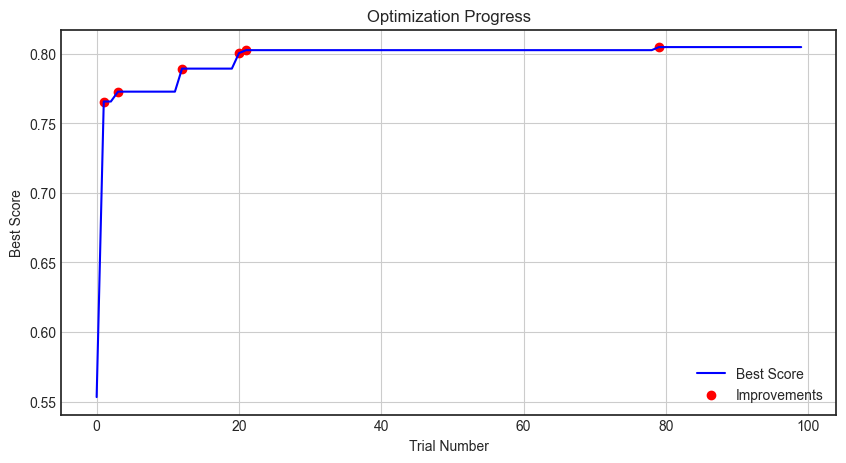

[I 2024-11-28 05:51:43,230] A new study created in memory with name: svr_SVR Without Weather Features



Parameter Convergence Analysis:
Error processing with_weather: ufunc 'add' did not contain a loop with signature matching types (dtype('<U3'), dtype('<U3')) -> None

Optimizing model: SVR Without Weather Features

Optimizing model for SVR Without Weather Features


  0%|          | 0/100 [00:00<?, ?it/s][I 2024-11-28 05:51:43,276] Trial 0 finished with value: 0.7726873205463867 and parameters: {'kernel': 'rbf', 'C': 0.19613290915976053, 'epsilon': 0.4413596979604886, 'gamma': 0.12806324406561348}. Best is trial 0 with value: 0.7726873205463867.
[I 2024-11-28 05:51:43,317] Trial 1 finished with value: 0.7591472722270864 and parameters: {'kernel': 'rbf', 'C': 0.1920682964822724, 'epsilon': 0.437944416398301, 'gamma': 0.04345927611587469}. Best is trial 0 with value: 0.7726873205463867.
[I 2024-11-28 05:51:43,366] Trial 2 finished with value: 0.6868205003504272 and parameters: {'kernel': 'rbf', 'C': 0.20596788938439406, 'epsilon': 0.44351668216357726, 'gamma': 0.010923108486199899}. Best is trial 0 with value: 0.7726873205463867.
  3%|▎         | 3/100 [00:00<00:04, 22.14it/s]


Trial Results - R2: 0.6381, MAE: 1.8546, Score: 0.7727

Trial Results - R2: 0.6146, MAE: 1.9269, Score: 0.7591

Trial Results - R2: 0.4832, MAE: 2.1921, Score: 0.6868

Trial Results - R2: 0.7349, MAE: 1.5600, Score: 0.8284

[I 2024-11-28 05:51:43,418] Trial 3 finished with value: 0.8284330124245491 and parameters: {'kernel': 'rbf', 'C': 9.475774128598763, 'epsilon': 0.4185631021534708, 'gamma': 0.03033793078103735}. Best is trial 3 with value: 0.8284330124245491.
[I 2024-11-28 05:51:43,469] Trial 4 finished with value: 0.8292010127669082 and parameters: {'kernel': 'rbf', 'C': 5.230792874354186, 'epsilon': 0.4153630813924127, 'gamma': 0.0400793174150593}. Best is trial 4 with value: 0.8292010127669082.




Trial Results - R2: 0.7364, MAE: 1.5605, Score: 0.8292


[I 2024-11-28 05:51:43,530] Trial 5 finished with value: 0.8100930764915382 and parameters: {'kernel': 'rbf', 'C': 0.8335153739470329, 'epsilon': 0.18858996074269607, 'gamma': 0.016709821515712174}. Best is trial 4 with value: 0.8292010127669082.
  6%|▌         | 6/100 [00:00<00:04, 19.67it/s]


Trial Results - R2: 0.6950, MAE: 1.4954, Score: 0.8101

Trial Results - R2: 0.7791, MAE: 1.1821, Score: 0.8600


[I 2024-11-28 05:51:43,607] Trial 6 finished with value: 0.860019858551302 and parameters: {'kernel': 'rbf', 'C': 2.7165622843314687, 'epsilon': 0.1570121112605558, 'gamma': 0.3245463158582257}. Best is trial 6 with value: 0.860019858551302.
[I 2024-11-28 05:51:43,678] Trial 7 finished with value: 0.8509434693032225 and parameters: {'kernel': 'rbf', 'C': 0.5781660807982801, 'epsilon': 0.27380941236033723, 'gamma': 0.1475653186377681}. Best is trial 6 with value: 0.860019858551302.
  8%|▊         | 8/100 [00:00<00:05, 16.85it/s]


Trial Results - R2: 0.7708, MAE: 1.3777, Score: 0.8509


[I 2024-11-28 05:51:43,809] Trial 8 finished with value: 0.8630342948655192 and parameters: {'kernel': 'rbf', 'C': 2.4368953663340642, 'epsilon': 0.01228106232419377, 'gamma': 0.14717259519515416}. Best is trial 8 with value: 0.8630342948655192.
[I 2024-11-28 05:51:43,864] Trial 9 finished with value: 0.8196520057400477 and parameters: {'kernel': 'rbf', 'C': 6.930195763303831, 'epsilon': 0.42428221607108946, 'gamma': 0.20352856532494334}. Best is trial 8 with value: 0.8630342948655192.
 10%|█         | 10/100 [00:00<00:06, 14.19it/s]


Trial Results - R2: 0.7824, MAE: 1.1266, Score: 0.8630

Trial Results - R2: 0.7183, MAE: 1.5798, Score: 0.8197

Trial Results - R2: 0.7486, MAE: 1.2130, Score: 0.8440

[I 2024-11-28 05:51:44,002] Trial 10 finished with value: 0.8439903839935562 and parameters: {'kernel': 'rbf', 'C': 2.1591698160203965, 'epsilon': 0.014640604844609717, 'gamma': 0.8538991815360862}. Best is trial 8 with value: 0.8630342948655192.
[I 2024-11-28 05:51:44,129] Trial 11 finished with value: 0.8665941047300842 and parameters: {'kernel': 'rbf', 'C': 2.172152322841139, 'epsilon': 0.027154788656478607, 'gamma': 0.43125456937536966}. Best is trial 11 with value: 0.8665941047300842.
 12%|█▏        | 12/100 [00:00<00:07, 11.01it/s]



Trial Results - R2: 0.7889, MAE: 1.1140, Score: 0.8666


[I 2024-11-28 05:51:44,251] Trial 12 finished with value: 0.8579754210718549 and parameters: {'kernel': 'rbf', 'C': 1.8890813161998992, 'epsilon': 0.04883019177792296, 'gamma': 0.5728353527233292}. Best is trial 11 with value: 0.8665941047300842.
[I 2024-11-28 05:51:44,358] Trial 13 finished with value: 0.8680437340109934 and parameters: {'kernel': 'rbf', 'C': 3.4935148171961257, 'epsilon': 0.08587688995433315, 'gamma': 0.2997437240423525}. Best is trial 13 with value: 0.8680437340109934.
 14%|█▍        | 14/100 [00:01<00:08, 10.16it/s]


Trial Results - R2: 0.7736, MAE: 1.1532, Score: 0.8580

Trial Results - R2: 0.7921, MAE: 1.1206, Score: 0.8680


[I 2024-11-28 05:51:44,468] Trial 14 finished with value: 0.8595649263991397 and parameters: {'kernel': 'rbf', 'C': 4.007193300440165, 'epsilon': 0.0966754142677495, 'gamma': 0.37891599954889554}. Best is trial 13 with value: 0.8680437340109934.
[I 2024-11-28 05:51:44,538] Trial 15 finished with value: 0.7990076223300975 and parameters: {'kernel': 'rbf', 'C': 1.3589477483931947, 'epsilon': 0.2826527229702713, 'gamma': 0.9198583159432429}. Best is trial 13 with value: 0.8680437340109934.
 16%|█▌        | 16/100 [00:01<00:08, 10.46it/s][I 2024-11-28 05:51:44,615] Trial 16 finished with value: 0.8598580026055476 and parameters: {'kernel': 'rbf', 'C': 0.37995455832301495, 'epsilon': 0.11186108108659462, 'gamma': 0.3326978699964607}. Best is trial 13 with value: 0.8680437340109934.



Trial Results - R2: 0.7775, MAE: 1.1674, Score: 0.8596

Trial Results - R2: 0.6761, MAE: 1.5615, Score: 0.7990

Trial Results - R2: 0.7782, MAE: 1.1702, Score: 0.8599


[I 2024-11-28 05:51:44,697] Trial 17 finished with value: 0.8549086718821769 and parameters: {'kernel': 'rbf', 'C': 4.15792840446484, 'epsilon': 0.18673024285847983, 'gamma': 0.07583534316720011}. Best is trial 13 with value: 0.8680437340109934.
 18%|█▊        | 18/100 [00:01<00:07, 10.98it/s][I 2024-11-28 05:51:44,761] Trial 18 finished with value: 0.817647337552819 and parameters: {'kernel': 'rbf', 'C': 0.7753743934711588, 'epsilon': 0.328301826166344, 'gamma': 0.5161962579476097}. Best is trial 13 with value: 0.8680437340109934.
[I 2024-11-28 05:51:44,842] Trial 19 finished with value: 0.868634502206965 and parameters: {'kernel': 'rbf', 'C': 1.332655186750812, 'epsilon': 0.08329154489128218, 'gamma': 0.23012928026276822}. Best is trial 19 with value: 0.868634502206965.
 20%|██        | 20/100 [00:01<00:06, 11.63it/s]


Trial Results - R2: 0.7707, MAE: 1.2182, Score: 0.8549

Trial Results - R2: 0.7115, MAE: 1.5251, Score: 0.8176

Trial Results - R2: 0.7930, MAE: 1.1148, Score: 0.8686


[I 2024-11-28 05:51:44,937] Trial 20 finished with value: 0.8537777918302965 and parameters: {'kernel': 'rbf', 'C': 0.4458369031550715, 'epsilon': 0.08809013152951309, 'gamma': 0.08398741327641529}. Best is trial 19 with value: 0.868634502206965.
[I 2024-11-28 05:51:45,018] Trial 21 finished with value: 0.8655455711421998 and parameters: {'kernel': 'rbf', 'C': 1.413398794328371, 'epsilon': 0.14155998605807943, 'gamma': 0.23148433890666834}. Best is trial 19 with value: 0.868634502206965.
 22%|██▏       | 22/100 [00:01<00:06, 11.68it/s][I 2024-11-28 05:51:45,112] Trial 22 finished with value: 0.8682424353307348 and parameters: {'kernel': 'rbf', 'C': 1.2356768410377321, 'epsilon': 0.06798032158058964, 'gamma': 0.23769516035688362}. Best is trial 19 with value: 0.868634502206965.



Trial Results - R2: 0.7695, MAE: 1.2397, Score: 0.8538

Trial Results - R2: 0.7890, MAE: 1.1579, Score: 0.8655

Trial Results - R2: 0.7921, MAE: 1.1113, Score: 0.8682


[I 2024-11-28 05:51:45,210] Trial 23 finished with value: 0.8685111987684158 and parameters: {'kernel': 'rbf', 'C': 1.2772703781408765, 'epsilon': 0.07363576746845622, 'gamma': 0.23933671364659917}. Best is trial 19 with value: 0.868634502206965.
 24%|██▍       | 24/100 [00:01<00:06, 11.25it/s][I 2024-11-28 05:51:45,283] Trial 24 finished with value: 0.8559555997752621 and parameters: {'kernel': 'rbf', 'C': 1.2215110543627337, 'epsilon': 0.2245352987926244, 'gamma': 0.19547289745155771}. Best is trial 19 with value: 0.868634502206965.
[I 2024-11-28 05:51:45,349] Trial 25 finished with value: 0.8536725997024492 and parameters: {'kernel': 'rbf', 'C': 0.9578221657138162, 'epsilon': 0.1343886800453984, 'gamma': 0.05977078061186328}. Best is trial 19 with value: 0.868634502206965.
 26%|██▌       | 26/100 [00:02<00:06, 12.06it/s]


Trial Results - R2: 0.7926, MAE: 1.1117, Score: 0.8685

Trial Results - R2: 0.7756, MAE: 1.2728, Score: 0.8560

Trial Results - R2: 0.7693, MAE: 1.2393, Score: 0.8537


[I 2024-11-28 05:51:45,440] Trial 26 finished with value: 0.8457402301780418 and parameters: {'kernel': 'rbf', 'C': 0.1040468836877464, 'epsilon': 0.0627231042475132, 'gamma': 0.10957123018405644}. Best is trial 19 with value: 0.868634502206965.
[I 2024-11-28 05:51:45,540] Trial 27 finished with value: 0.8648938183088719 and parameters: {'kernel': 'rbf', 'C': 0.6148275400022697, 'epsilon': 0.05650386783470261, 'gamma': 0.24806065907010955}. Best is trial 19 with value: 0.868634502206965.
 28%|██▊       | 28/100 [00:02<00:06, 11.52it/s][I 2024-11-28 05:51:45,616] Trial 28 finished with value: 0.8436608713656966 and parameters: {'kernel': 'rbf', 'C': 1.5650583718233706, 'epsilon': 0.19660833348057222, 'gamma': 0.5703343017359017}. Best is trial 19 with value: 0.868634502206965.



Trial Results - R2: 0.7592, MAE: 1.3538, Score: 0.8457

Trial Results - R2: 0.7864, MAE: 1.1321, Score: 0.8649

Trial Results - R2: 0.7516, MAE: 1.2849, Score: 0.8437


[I 2024-11-28 05:51:45,669] Trial 29 finished with value: 0.8230583094815116 and parameters: {'kernel': 'rbf', 'C': 0.3219993719800566, 'epsilon': 0.3538322075032139, 'gamma': 0.1543992327657477}. Best is trial 19 with value: 0.868634502206965.
 30%|███       | 30/100 [00:02<00:05, 12.49it/s][I 2024-11-28 05:51:45,747] Trial 30 finished with value: 0.8616652462661105 and parameters: {'kernel': 'rbf', 'C': 1.163173988719894, 'epsilon': 0.15512568394596865, 'gamma': 0.11416080550094837}. Best is trial 19 with value: 0.868634502206965.
[I 2024-11-28 05:51:45,855] Trial 31 finished with value: 0.871204908801575 and parameters: {'kernel': 'rbf', 'C': 2.963200409337317, 'epsilon': 0.07814616270104396, 'gamma': 0.26765061029831294}. Best is trial 31 with value: 0.871204908801575.



Trial Results - R2: 0.7251, MAE: 1.5788, Score: 0.8231

Trial Results - R2: 0.7830, MAE: 1.1933, Score: 0.8617

Trial Results - R2: 0.7973, MAE: 1.0975, Score: 0.8712


 32%|███▏      | 32/100 [00:02<00:05, 11.91it/s][I 2024-11-28 05:51:45,914] Trial 32 finished with value: 0.8049253242530543 and parameters: {'kernel': 'rbf', 'C': 3.252150004901124, 'epsilon': 0.48633815814123416, 'gamma': 0.18336308269972695}. Best is trial 31 with value: 0.871204908801575.
[I 2024-11-28 05:51:45,999] Trial 33 finished with value: 0.8657964853648027 and parameters: {'kernel': 'rbf', 'C': 1.9150217367839135, 'epsilon': 0.12661122522568, 'gamma': 0.2749155297589668}. Best is trial 31 with value: 0.871204908801575.
 34%|███▍      | 34/100 [00:02<00:05, 12.40it/s][I 2024-11-28 05:51:46,107] Trial 34 finished with value: 0.8542671481347202 and parameters: {'kernel': 'rbf', 'C': 1.0420302865655973, 'epsilon': 0.06727063784533449, 'gamma': 0.6904301693889715}. Best is trial 31 with value: 0.871204908801575.



Trial Results - R2: 0.6953, MAE: 1.7085, Score: 0.8049

Trial Results - R2: 0.7889, MAE: 1.1459, Score: 0.8658

Trial Results - R2: 0.7672, MAE: 1.1732, Score: 0.8543


[I 2024-11-28 05:51:46,216] Trial 35 finished with value: 0.8693307166961862 and parameters: {'kernel': 'rbf', 'C': 1.651561683425868, 'epsilon': 0.040944118795753104, 'gamma': 0.2400887669961282}. Best is trial 31 with value: 0.871204908801575.
 36%|███▌      | 36/100 [00:02<00:05, 11.23it/s][I 2024-11-28 05:51:46,335] Trial 36 finished with value: 0.8676069048556065 and parameters: {'kernel': 'rbf', 'C': 1.7722622689405552, 'epsilon': 0.03503462338232323, 'gamma': 0.4320453828160064}. Best is trial 31 with value: 0.871204908801575.



Trial Results - R2: 0.7937, MAE: 1.0999, Score: 0.8693

Trial Results - R2: 0.7906, MAE: 1.1080, Score: 0.8676


[I 2024-11-28 05:51:46,441] Trial 37 finished with value: 0.8626531034500708 and parameters: {'kernel': 'rbf', 'C': 6.126138880857451, 'epsilon': 0.09573295697035286, 'gamma': 0.08338054732792394}. Best is trial 31 with value: 0.871204908801575.
 38%|███▊      | 38/100 [00:03<00:05, 10.37it/s][I 2024-11-28 05:51:46,533] Trial 38 finished with value: 0.8360402371510405 and parameters: {'kernel': 'rbf', 'C': 2.6719020206260655, 'epsilon': 0.11434169518214332, 'gamma': 0.021388671070265534}. Best is trial 31 with value: 0.871204908801575.
[I 2024-11-28 05:51:46,621] Trial 39 finished with value: 0.8486813192352332 and parameters: {'kernel': 'rbf', 'C': 9.431812904347861, 'epsilon': 0.2284975667588261, 'gamma': 0.16103909363635627}. Best is trial 31 with value: 0.871204908801575.
 40%|████      | 40/100 [00:03<00:05, 10.62it/s]


Trial Results - R2: 0.7821, MAE: 1.1361, Score: 0.8627

Trial Results - R2: 0.7369, MAE: 1.2970, Score: 0.8360

Trial Results - R2: 0.7608, MAE: 1.2687, Score: 0.8487


[I 2024-11-28 05:51:46,723] Trial 40 finished with value: 0.8605621700676902 and parameters: {'kernel': 'rbf', 'C': 0.5758686846502972, 'epsilon': 0.03972017369459388, 'gamma': 0.1286584607912995}. Best is trial 31 with value: 0.871204908801575.
[I 2024-11-28 05:51:46,816] Trial 41 finished with value: 0.8667709794621647 and parameters: {'kernel': 'rbf', 'C': 0.8110144116944712, 'epsilon': 0.0744194640090948, 'gamma': 0.24350251289118235}. Best is trial 31 with value: 0.871204908801575.
 42%|████▏     | 42/100 [00:03<00:05, 10.55it/s]


Trial Results - R2: 0.7796, MAE: 1.1695, Score: 0.8606

Trial Results - R2: 0.7897, MAE: 1.1225, Score: 0.8668

Trial Results - R2: 0.7967, MAE: 1.0958, Score: 0.8709


[I 2024-11-28 05:51:46,926] Trial 42 finished with value: 0.8709415409432223 and parameters: {'kernel': 'rbf', 'C': 1.3590788915236203, 'epsilon': 0.04590122052510322, 'gamma': 0.35218448938848756}. Best is trial 31 with value: 0.871204908801575.
[I 2024-11-28 05:51:47,050] Trial 43 finished with value: 0.8701760707165069 and parameters: {'kernel': 'rbf', 'C': 1.617509217145282, 'epsilon': 0.010806210897586557, 'gamma': 0.36529069485089155}. Best is trial 31 with value: 0.871204908801575.
 44%|████▍     | 44/100 [00:03<00:05,  9.86it/s][I 2024-11-28 05:51:47,190] Trial 44 finished with value: 0.8703319915206043 and parameters: {'kernel': 'rbf', 'C': 1.587850734259294, 'epsilon': 0.014685161104099714, 'gamma': 0.3602358918189069}. Best is trial 31 with value: 0.871204908801575.



Trial Results - R2: 0.7952, MAE: 1.0976, Score: 0.8702

Trial Results - R2: 0.7955, MAE: 1.0968, Score: 0.8703


[I 2024-11-28 05:51:47,323] Trial 45 finished with value: 0.8655553418809596 and parameters: {'kernel': 'rbf', 'C': 2.8813983563493406, 'epsilon': 0.028569734388487707, 'gamma': 0.40685279252101825}. Best is trial 31 with value: 0.871204908801575.
 47%|████▋     | 47/100 [00:04<00:05,  8.84it/s]


Trial Results - R2: 0.7873, MAE: 1.1229, Score: 0.8656

Trial Results - R2: 0.7953, MAE: 1.0997, Score: 0.8702


[I 2024-11-28 05:51:47,575] Trial 47 finished with value: 0.8485404727104273 and parameters: {'kernel': 'rbf', 'C': 2.312737930815728, 'epsilon': 0.010319451190773519, 'gamma': 0.7304745275059994}. Best is trial 31 with value: 0.871204908801575.
 49%|████▉     | 49/100 [00:04<00:06,  8.05it/s]


Trial Results - R2: 0.7568, MAE: 1.1942, Score: 0.8485

Trial Results - R2: 0.7598, MAE: 1.1926, Score: 0.8501


[I 2024-11-28 05:51:47,849] Trial 49 finished with value: 0.8651912591910738 and parameters: {'kernel': 'rbf', 'C': 3.7087040724611935, 'epsilon': 0.04774378220815692, 'gamma': 0.36580160776609494}. Best is trial 31 with value: 0.871204908801575.
 51%|█████     | 51/100 [00:04<00:06,  7.45it/s]


Trial Results - R2: 0.7870, MAE: 1.1314, Score: 0.8652

Trial Results - R2: 0.7874, MAE: 1.1314, Score: 0.8654


[I 2024-11-28 05:51:48,135] Trial 51 finished with value: 0.8528663339886416 and parameters: {'kernel': 'rbf', 'C': 1.6374009249525658, 'epsilon': 0.04308070416364169, 'gamma': 0.6900907865606609}. Best is trial 31 with value: 0.871204908801575.
 53%|█████▎    | 53/100 [00:05<00:05,  7.96it/s]


Trial Results - R2: 0.7646, MAE: 1.1773, Score: 0.8529

Trial Results - R2: 0.7981, MAE: 1.0923, Score: 0.8717


[I 2024-11-28 05:51:48,363] Trial 53 finished with value: 0.863579910958249 and parameters: {'kernel': 'rbf', 'C': 2.1302062494286886, 'epsilon': 0.029869786167816402, 'gamma': 0.4793068425138418}. Best is trial 52 with value: 0.8717218062179919.
 54%|█████▍    | 54/100 [00:05<00:05,  8.02it/s][I 2024-11-28 05:51:48,462] Trial 54 finished with value: 0.865588510991254 and parameters: {'kernel': 'rbf', 'C': 2.939924900997972, 'epsilon': 0.10519730958427866, 'gamma': 0.3176168678168356}. Best is trial 52 with value: 0.8717218062179919.
[I 2024-11-28 05:51:48,577] Trial 55 finished with value: 0.8675355717515074 and parameters: {'kernel': 'rbf', 'C': 2.5274711503107388, 'epsilon': 0.05951961761650573, 'gamma': 0.38201761726565564}. Best is trial 52 with value: 0.8717218062179919.



Trial Results - R2: 0.7835, MAE: 1.1274, Score: 0.8636

Trial Results - R2: 0.7880, MAE: 1.1357, Score: 0.8656

Trial Results - R2: 0.7908, MAE: 1.1151, Score: 0.8675


 58%|█████▊    | 58/100 [00:05<00:04,  8.48it/s]


Trial Results - R2: 0.7706, MAE: 1.1630, Score: 0.8562

Trial Results - R2: 0.6027, MAE: 1.5369, Score: 0.7629


[I 2024-11-28 05:51:48,968] Trial 58 finished with value: 0.8404012060565331 and parameters: {'kernel': 'rbf', 'C': 1.4661682820753568, 'epsilon': 0.02765174484693711, 'gamma': 0.9711260373992268}. Best is trial 52 with value: 0.8717218062179919.
 60%|██████    | 60/100 [00:05<00:04,  8.15it/s][I 2024-11-28 05:51:49,161] Trial 60 finished with value: 0.8650904405424662 and parameters: {'kernel': 'rbf', 'C': 0.6894386211460451, 'epsilon': 0.1149438671921681, 'gamma': 0.1826212213188438}. Best is trial 52 with value: 0.8717218062179919.



Trial Results - R2: 0.7426, MAE: 1.2351, Score: 0.8404

Trial Results - R2: 0.7919, MAE: 1.1231, Score: 0.8679

Trial Results - R2: 0.7879, MAE: 1.1553, Score: 0.8651


[I 2024-11-28 05:51:49,269] Trial 61 finished with value: 0.8707172796885392 and parameters: {'kernel': 'rbf', 'C': 1.673412120888065, 'epsilon': 0.036604458579447045, 'gamma': 0.36567336026683034}. Best is trial 52 with value: 0.8717218062179919.
 63%|██████▎   | 63/100 [00:06<00:04,  8.80it/s]


Trial Results - R2: 0.7962, MAE: 1.0958, Score: 0.8707

Trial Results - R2: 0.7951, MAE: 1.1003, Score: 0.8700


[I 2024-11-28 05:51:49,516] Trial 63 finished with value: 0.8607616229245116 and parameters: {'kernel': 'rbf', 'C': 3.2215253714197334, 'epsilon': 0.05633160273073762, 'gamma': 0.43910373276169096}. Best is trial 52 with value: 0.8717218062179919.
 64%|██████▍   | 64/100 [00:06<00:04,  8.62it/s][I 2024-11-28 05:51:49,571] Trial 64 finished with value: 0.7973513648768138 and parameters: {'kernel': 'rbf', 'C': 1.8197037149285396, 'epsilon': 0.3877837290722614, 'gamma': 0.5426500885989541}. Best is trial 52 with value: 0.8717218062179919.
[I 2024-11-28 05:51:49,654] Trial 65 finished with value: 0.8688140148409345 and parameters: {'kernel': 'rbf', 'C': 1.4800701973680668, 'epsilon': 0.09305480024619175, 'gamma': 0.2904426636330673}. Best is trial 52 with value: 0.8717218062179919.
 66%|██████▌   | 66/100 [00:06<00:03, 10.49it/s]


Trial Results - R2: 0.7789, MAE: 1.1481, Score: 0.8608

Trial Results - R2: 0.6776, MAE: 1.6573, Score: 0.7974

Trial Results - R2: 0.7935, MAE: 1.1173, Score: 0.8688


[I 2024-11-28 05:51:49,768] Trial 66 finished with value: 0.8499870185330733 and parameters: {'kernel': 'rbf', 'C': 1.085266575610555, 'epsilon': 0.025784397066135306, 'gamma': 0.8085391816020295}. Best is trial 52 with value: 0.8717218062179919.
[I 2024-11-28 05:51:49,878] Trial 67 finished with value: 0.8687368759207112 and parameters: {'kernel': 'rbf', 'C': 2.1154884343742673, 'epsilon': 0.0709155627834385, 'gamma': 0.36039452366185104}. Best is trial 52 with value: 0.8717218062179919.
 68%|██████▊   | 68/100 [00:06<00:03,  9.83it/s][I 2024-11-28 05:51:49,942] Trial 68 finished with value: 0.8438091836833856 and parameters: {'kernel': 'rbf', 'C': 0.870455181495904, 'epsilon': 0.304227151829828, 'gamma': 0.20508175891163027}. Best is trial 52 with value: 0.8717218062179919.



Trial Results - R2: 0.7595, MAE: 1.1908, Score: 0.8500

Trial Results - R2: 0.7930, MAE: 1.1098, Score: 0.8687

Trial Results - R2: 0.7585, MAE: 1.4172, Score: 0.8438


[I 2024-11-28 05:51:50,058] Trial 69 finished with value: 0.8521225710481175 and parameters: {'kernel': 'rbf', 'C': 2.7311227697110385, 'epsilon': 0.05059452070047431, 'gamma': 0.6181976776203054}. Best is trial 52 with value: 0.8717218062179919.
 70%|███████   | 70/100 [00:06<00:02, 10.25it/s][I 2024-11-28 05:51:50,175] Trial 70 finished with value: 0.8666528485147535 and parameters: {'kernel': 'rbf', 'C': 1.2769510862990334, 'epsilon': 0.022279315561957475, 'gamma': 0.4807869861678458}. Best is trial 52 with value: 0.8717218062179919.



Trial Results - R2: 0.7634, MAE: 1.1834, Score: 0.8521

Trial Results - R2: 0.7888, MAE: 1.1103, Score: 0.8667


[I 2024-11-28 05:51:50,288] Trial 71 finished with value: 0.8703716367694825 and parameters: {'kernel': 'rbf', 'C': 2.468411816774545, 'epsilon': 0.0357911675280081, 'gamma': 0.3416118353214871}. Best is trial 52 with value: 0.8717218062179919.
 73%|███████▎  | 73/100 [00:07<00:02,  9.44it/s]


Trial Results - R2: 0.7957, MAE: 1.0994, Score: 0.8704

Trial Results - R2: 0.7974, MAE: 1.0942, Score: 0.8713

Trial Results - R2: 0.7965, MAE: 1.1017, Score: 0.8707


[I 2024-11-28 05:51:50,496] Trial 73 finished with value: 0.8706980265145434 and parameters: {'kernel': 'rbf', 'C': 1.7047737086853052, 'epsilon': 0.07998344579933447, 'gamma': 0.2758675025696972}. Best is trial 52 with value: 0.8717218062179919.
[I 2024-11-28 05:51:50,572] Trial 74 finished with value: 0.8612147320027657 and parameters: {'kernel': 'rbf', 'C': 1.9303251481705506, 'epsilon': 0.172914767178161, 'gamma': 0.21354413744222692}. Best is trial 52 with value: 0.8717218062179919.
 75%|███████▌  | 75/100 [00:07<00:02, 10.21it/s][I 2024-11-28 05:51:50,676] Trial 75 finished with value: 0.8707083681205351 and parameters: {'kernel': 'rbf', 'C': 3.3336623827809735, 'epsilon': 0.07897410279059143, 'gamma': 0.2638009716465269}. Best is trial 52 with value: 0.8717218062179919.
[I 2024-11-28 05:51:50,769] Trial 76 finished with value: 0.8624246516987661 and parameters: {'kernel': 'rbf', 'C': 3.528746131562905, 'epsilon': 0.14934964835076442, 'gamma': 0.26873253077155385}. Best is trial 


Trial Results - R2: 0.7822, MAE: 1.1957, Score: 0.8612

Trial Results - R2: 0.7965, MAE: 1.1014, Score: 0.8707

Trial Results - R2: 0.7834, MAE: 1.1705, Score: 0.8624


 77%|███████▋  | 77/100 [00:07<00:02, 10.18it/s][I 2024-11-28 05:51:50,864] Trial 77 finished with value: 0.8661555970276077 and parameters: {'kernel': 'rbf', 'C': 3.086001815036651, 'epsilon': 0.12561599281802854, 'gamma': 0.16896626859571956}. Best is trial 52 with value: 0.8717218062179919.
[I 2024-11-28 05:51:50,969] Trial 78 finished with value: 0.8707225517130022 and parameters: {'kernel': 'rbf', 'C': 2.4809649566857686, 'epsilon': 0.08001447491321886, 'gamma': 0.28637728673575064}. Best is trial 52 with value: 0.8717218062179919.
 79%|███████▉  | 79/100 [00:07<00:02, 10.08it/s]


Trial Results - R2: 0.7891, MAE: 1.1350, Score: 0.8662

Trial Results - R2: 0.7965, MAE: 1.1002, Score: 0.8707


[I 2024-11-28 05:51:51,071] Trial 79 finished with value: 0.8657817817157709 and parameters: {'kernel': 'rbf', 'C': 3.9420257771029603, 'epsilon': 0.10550247679709968, 'gamma': 0.1351440508522895}. Best is trial 52 with value: 0.8717218062179919.
[I 2024-11-28 05:51:51,200] Trial 80 finished with value: 0.8662679871993392 and parameters: {'kernel': 'rbf', 'C': 6.028999746858403, 'epsilon': 0.08624641101629078, 'gamma': 0.2641854632006475}. Best is trial 52 with value: 0.8717218062179919.
 81%|████████  | 81/100 [00:07<00:01,  9.62it/s]


Trial Results - R2: 0.7880, MAE: 1.1297, Score: 0.8658

Trial Results - R2: 0.7892, MAE: 1.1335, Score: 0.8663


[I 2024-11-28 05:51:51,313] Trial 81 finished with value: 0.8701333678093908 and parameters: {'kernel': 'rbf', 'C': 2.4937495310322073, 'epsilon': 0.07443808013942022, 'gamma': 0.21364233017991183}. Best is trial 52 with value: 0.8717218062179919.
 83%|████████▎ | 83/100 [00:08<00:01,  9.49it/s][I 2024-11-28 05:51:51,516] Trial 83 finished with value: 0.8706900147182492 and parameters: {'kernel': 'rbf', 'C': 1.78130052255313, 'epsilon': 0.07339564843809199, 'gamma': 0.30345910889594374}. Best is trial 52 with value: 0.8717218062179919.



Trial Results - R2: 0.7952, MAE: 1.0985, Score: 0.8701

Trial Results - R2: 0.7729, MAE: 1.1960, Score: 0.8566

Trial Results - R2: 0.7963, MAE: 1.0991, Score: 0.8707


[I 2024-11-28 05:51:51,614] Trial 84 finished with value: 0.8640367945714695 and parameters: {'kernel': 'rbf', 'C': 1.1488127581861947, 'epsilon': 0.09948240522607334, 'gamma': 0.4178848443167405}. Best is trial 52 with value: 0.8717218062179919.
 85%|████████▌ | 85/100 [00:08<00:01,  9.75it/s][I 2024-11-28 05:51:51,703] Trial 85 finished with value: 0.8655236025689461 and parameters: {'kernel': 'rbf', 'C': 1.7694262830671432, 'epsilon': 0.1276998516805154, 'gamma': 0.2863071858333751}. Best is trial 52 with value: 0.8717218062179919.



Trial Results - R2: 0.7848, MAE: 1.1346, Score: 0.8640

Trial Results - R2: 0.7884, MAE: 1.1473, Score: 0.8655

Trial Results - R2: 0.7894, MAE: 1.1242, Score: 0.8666


[I 2024-11-28 05:51:51,800] Trial 86 finished with value: 0.8665812710047183 and parameters: {'kernel': 'rbf', 'C': 1.3757549798927617, 'epsilon': 0.08263280106354914, 'gamma': 0.1791064331696766}. Best is trial 52 with value: 0.8717218062179919.
 87%|████████▋ | 87/100 [00:08<00:01, 10.07it/s][I 2024-11-28 05:51:51,918] Trial 87 finished with value: 0.87030473777411 and parameters: {'kernel': 'rbf', 'C': 4.475823707907939, 'epsilon': 0.06296242895359931, 'gamma': 0.2684267312907532}. Best is trial 52 with value: 0.8717218062179919.
[I 2024-11-28 05:51:52,022] Trial 88 finished with value: 0.8702210170131419 and parameters: {'kernel': 'rbf', 'C': 1.9753156472620033, 'epsilon': 0.07199383484477936, 'gamma': 0.22632986286407136}. Best is trial 52 with value: 0.8717218062179919.
 89%|████████▉ | 89/100 [00:08<00:01,  9.69it/s][I 2024-11-28 05:51:52,120] Trial 89 finished with value: 0.8568548350370342 and parameters: {'kernel': 'rbf', 'C': 3.542361665217831, 'epsilon': 0.11642987544242413


Trial Results - R2: 0.7958, MAE: 1.1039, Score: 0.8703

Trial Results - R2: 0.7955, MAE: 1.1013, Score: 0.8702

Trial Results - R2: 0.7727, MAE: 1.1794, Score: 0.8569


[I 2024-11-28 05:51:52,213] Trial 90 finished with value: 0.8498543027262051 and parameters: {'kernel': 'rbf', 'C': 0.16919311651795854, 'epsilon': 0.051050577879751396, 'gamma': 0.3053138118611535}. Best is trial 52 with value: 0.8717218062179919.
 92%|█████████▏| 92/100 [00:09<00:00,  9.43it/s]


Trial Results - R2: 0.7613, MAE: 1.2320, Score: 0.8499

Trial Results - R2: 0.7951, MAE: 1.1027, Score: 0.8700


[I 2024-11-28 05:51:52,450] Trial 92 finished with value: 0.8688684499059501 and parameters: {'kernel': 'rbf', 'C': 2.372464362758096, 'epsilon': 0.09419186701073762, 'gamma': 0.25118104568263716}. Best is trial 52 with value: 0.8717218062179919.
 94%|█████████▍| 94/100 [00:09<00:00,  9.36it/s]


Trial Results - R2: 0.7935, MAE: 1.1144, Score: 0.8689

Trial Results - R2: 0.7952, MAE: 1.1038, Score: 0.8700


[I 2024-11-28 05:51:52,684] Trial 94 finished with value: 0.8661105575886832 and parameters: {'kernel': 'rbf', 'C': 1.793334601207403, 'epsilon': 0.04015616003380879, 'gamma': 0.4531317229820559}. Best is trial 52 with value: 0.8717218062179919.
 96%|█████████▌| 96/100 [00:09<00:00,  9.15it/s]


Trial Results - R2: 0.7880, MAE: 1.1156, Score: 0.8661

Trial Results - R2: 0.7903, MAE: 1.1133, Score: 0.8673


[I 2024-11-28 05:51:52,911] Trial 96 finished with value: 0.8653439970729471 and parameters: {'kernel': 'rbf', 'C': 3.2373768103892933, 'epsilon': 0.05254688556559048, 'gamma': 0.3839536710932813}. Best is trial 52 with value: 0.8717218062179919.
 97%|█████████▋| 97/100 [00:09<00:00,  8.83it/s][I 2024-11-28 05:51:53,002] Trial 97 finished with value: 0.8622490915071581 and parameters: {'kernel': 'rbf', 'C': 2.2732054625940683, 'epsilon': 0.13881301235115673, 'gamma': 0.3333519991692848}. Best is trial 52 with value: 0.8717218062179919.
[I 2024-11-28 05:51:53,100] Trial 98 finished with value: 0.8530591910385844 and parameters: {'kernel': 'rbf', 'C': 2.6920323926669227, 'epsilon': 0.10410812422940391, 'gamma': 0.5178513022433077}. Best is trial 52 with value: 0.8717218062179919.



Trial Results - R2: 0.7871, MAE: 1.1279, Score: 0.8653

Trial Results - R2: 0.7826, MAE: 1.1613, Score: 0.8622

Trial Results - R2: 0.7657, MAE: 1.1906, Score: 0.8531


100%|██████████| 100/100 [00:09<00:00, 10.01it/s]



Trial Results - R2: 0.7934, MAE: 1.1018, Score: 0.8691


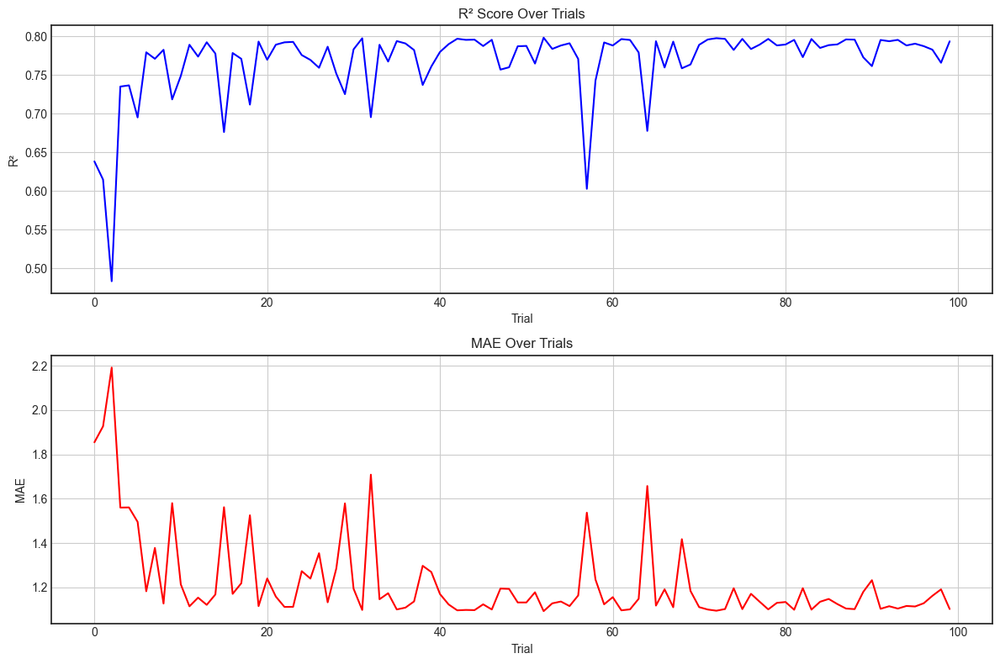


Best Trial Results:
R² Score: 0.7981
MAE: 1.0923


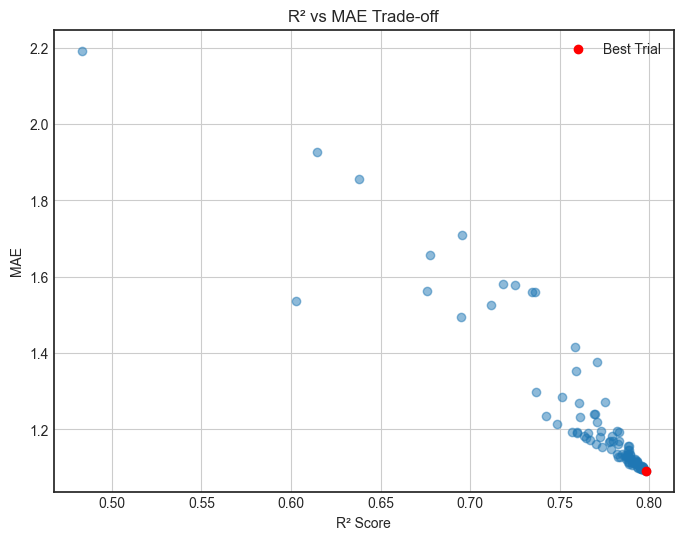


Model saved to ../../models/svr_model_no_weather.joblib


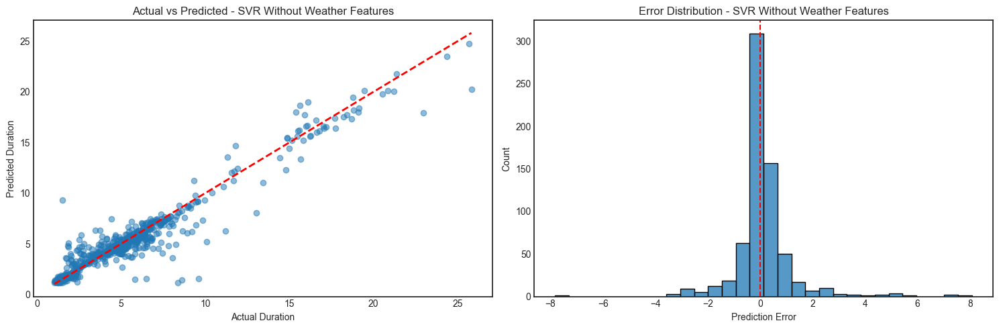


Error Analysis for SVR Without Weather Features:
Mean Absolute Error: 0.61 minutes
Median Absolute Error: 0.27 minutes
90th percentile of absolute error: 1.44 minutes
95th percentile of absolute error: 2.38 minutes

Optimization History:

Parameter Parallel Coordinates:

Optimization Analysis:
Total number of trials: 100
Best value: 0.8717
Improvements in last 25% of trials: 0
Average trials between improvements: 6.1


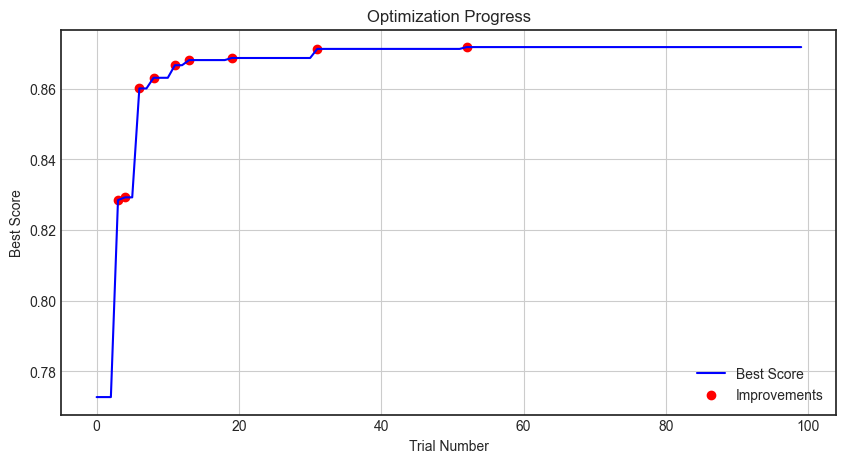


Parameter Convergence Analysis:
Error processing without_weather: ufunc 'add' did not contain a loop with signature matching types (dtype('<U3'), dtype('<U3')) -> None

Optimization Results Summary:
--------------------------------------------------

with_weather:
Best score: 0.8046
Best parameters:
  kernel: rbf
  C: 1.2188012194304403
  epsilon: 0.011737461206019387
  gamma: 0.06089241418650356

without_weather:
Best score: 0.8717
Best parameters:
  kernel: rbf
  C: 2.1145005314623466
  epsilon: 0.035409609666854774
  gamma: 0.3220201543257706


In [17]:
import optuna
import joblib
from sklearn.model_selection import KFold, train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.svm import SVR
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from tqdm import tqdm


def prepare_features(X):
    """Prepare features by encoding categorical columns"""
    # Identify numeric and categorical columns
    numeric_features = X.select_dtypes(include=['int64', 'float64']).columns
    categorical_features = X.select_dtypes(include=['object', 'category']).columns
    
    # Create preprocessing pipeline
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', 'passthrough', numeric_features),
            ('cat', OneHotEncoder(drop='first', sparse_output=False), categorical_features)
        ])
    
    return preprocessor

def objective(trial, X, y, feature_set_name):
    """Define the objective function for SVR"""
    
    # Log transform the target
    y_log = np.log1p(y)
    
    # Define hyperparameter search space
    param = {
        'svr__kernel': trial.suggest_categorical('kernel', ['rbf']),  # Start with just RBF kernel
        'svr__C': trial.suggest_float('C', 0.1, 10.0, log=True),     # More conservative range
        'svr__epsilon': trial.suggest_float('epsilon', 0.01, 0.5),    # More conservative range
        'svr__gamma': trial.suggest_float('gamma', 0.01, 1.0, log=True),  # More conservative range
        'svr__cache_size': 1000
    }
    
    # Create preprocessing pipeline
    preprocessor = prepare_features(X)
    
    # Create pipeline
    model = Pipeline([
        ('preprocessor', preprocessor),
        ('svr', SVR())
    ])
    
    kf = KFold(n_splits=3, shuffle=True, random_state=42)
    r2_scores = []
    mae_scores = []
    
    for fold, (train_idx, valid_idx) in enumerate(kf.split(X)):
        X_fold_train, X_fold_valid = X.iloc[train_idx], X.iloc[valid_idx]
        y_fold_train = y_log.iloc[train_idx]
        y_fold_valid = y_log.iloc[valid_idx]
        
        try:
            # Set parameters
            model.set_params(**param)
            
            # Fit model
            model.fit(X_fold_train, y_fold_train)

            # Predict in log space
            y_pred_log = model.predict(X_fold_valid)
            
            # Clip predictions to prevent overflow
            y_pred_log = np.clip(y_pred_log, -100, 100)
            
            # Transform back safely
            y_pred = np.expm1(y_pred_log)
            
            # Check for invalid values
            if np.any(~np.isfinite(y_pred)):
                print(f"Warning: Non-finite predictions detected in fold {fold}")
                continue

            r2 = r2_score(y.iloc[valid_idx], y_pred)
            mae = mean_absolute_error(y.iloc[valid_idx], y_pred)
            
            # Check for valid metrics
            if np.isfinite(r2) and np.isfinite(mae):
                r2_scores.append(r2)
                mae_scores.append(mae)
            else:
                print(f"Warning: Invalid metrics in fold {fold} - R2: {r2}, MAE: {mae}")
                continue
            
        except Exception as e:
            print(f"Fold failed: {e}")
            continue
    
    if len(r2_scores) == 0:
        return float('-inf')
    
    # Calculate mean scores
    mean_r2 = np.mean(r2_scores)
    mean_mae = np.mean(mae_scores)
    
    # Normalize MAE to be in [0,1] range
    normalized_mae = 1 - (mean_mae / 20)
    
    # Combine scores with weights
    combined_score = (0.5 * mean_r2) + (0.5 * normalized_mae)
    
    # Store the individual metrics for analysis
    trial.set_user_attr('r2_score', mean_r2)
    trial.set_user_attr('mae_score', mean_mae)
    
    print(f"\nTrial Results - R2: {mean_r2:.4f}, MAE: {mean_mae:.4f}, Score: {combined_score:.4f}")
    
    return combined_score

def train_final_model(X, y, best_params, feature_set_name):
    """Train final model with log-transformed target"""
    # Log transform the target
    y_log = np.log1p(y)
    
    # Create preprocessing pipeline
    preprocessor = prepare_features(X)
    
    # Create pipeline with best parameters
    model = Pipeline([
        ('preprocessor', preprocessor),
        ('svr', SVR(**{k.replace('svr__', ''): v for k, v in best_params.items()}))
    ])
    
    # Split the data
    X_train, X_test, y_train_log, y_test_log = train_test_split(
        X, y_log, test_size=0.2, random_state=42
    )
    
    # Fit the model
    model.fit(X_train, y_train_log)
    
    # Make predictions and transform back to original scale
    y_pred_train_log = model.predict(X_train)
    y_pred_test_log = model.predict(X_test)
    
    y_pred_train = np.expm1(y_pred_train_log)
    y_pred_test = np.expm1(y_pred_test_log)
    
    # Calculate metrics on original scale
    results = {
        'feature_set': feature_set_name,
        'best_params': best_params,
        'train_r2': r2_score(y.iloc[X_train.index], y_pred_train),
        'test_r2': r2_score(y.iloc[X_test.index], y_pred_test),
        'train_rmse': np.sqrt(mean_squared_error(y.iloc[X_train.index], y_pred_train)),
        'test_rmse': np.sqrt(mean_squared_error(y.iloc[X_test.index], y_pred_test)),
        'train_mae': mean_absolute_error(y.iloc[X_train.index], y_pred_train),
        'test_mae': mean_absolute_error(y.iloc[X_test.index], y_pred_test),
        'model': model,
        'predictions': {
            'y_test': y.iloc[X_test.index],
            'y_pred_test': y_pred_test,
            'y_train': y.iloc[X_train.index],
            'y_pred_train': y_pred_train
        }
    }
    
    return results

def optimize_model(X, y, feature_set_name, n_trials=100):
    study = optuna.create_study(
        direction='maximize',
        pruner=optuna.pruners.MedianPruner(
            n_startup_trials=5,
            n_warmup_steps=20,
            interval_steps=10
        ),
        study_name=f'svr_{feature_set_name}'
    )
    
    func = lambda trial: objective(trial, X, y, feature_set_name)
    
    print(f"\nOptimizing model for {feature_set_name}")
    for _ in tqdm(range(n_trials)):
        try:
            study.optimize(func, n_trials=1)
        except Exception as e:
            print(f"Optimization step failed: {e}")
            continue
    
    # Analyze results with both metrics
    analyze_optimization_results(study)
    
    return study


# Define feature sets and configurations
MODEL_CONFIGS = {
    'with_weather': {
        'features': selected_features2,
        'name': 'SVR With Weather Features',
        'save_path': '../../models/svr_model_weather.joblib'
    },
    'without_weather': {
        'features': ['distance', 'minutes_sin', 'minutes_cos', 'origin_id',
                     'month_cos', 'month_sin', 'day_of_week_cos', 'day_of_week_sin'],
        'name': 'SVR Without Weather Features',
        'save_path': '../../models/svr_model_no_weather.joblib'
    }
}

# Run optimization for both feature sets
optuna_results = {}
model_results = {}  # Store the final model results

# In the main loop where the error occurs
for model_type, config in MODEL_CONFIGS.items():
    print(f"\nOptimizing model: {config['name']}")
    # Make sure we're using all rows from X_train for these features
    X = X_train[config['features']].reset_index(drop=True)
    y = y_train.reset_index(drop=True)
    
    try:
        # Run Optuna optimization
        study = optimize_model(X, y, config['name'])
        optuna_results[model_type] = study
        
        # Train final model with best parameters
        results = train_final_model(X, y, study.best_params, config['name'])
        model_results[model_type] = results
        
        # Save model
        save_model_info(results, config)
        
        # Analyze errors
        analyze_errors(
            results['predictions']['y_train'],
            results['predictions']['y_pred_train'],
            config['name']
        )
        analyze_optimization_convergence(study)
    except Exception as e:
        print(f"Error processing {model_type}: {str(e)}")
        continue

# Print optimization results summary
print("\nOptimization Results Summary:")
print("-" * 50)
for model_type, study in optuna_results.items():
    if study.best_trial:
        print(f"\n{model_type}:")
        print(f"Best score: {study.best_trial.value:.4f}")
        print("Best parameters:")
        for key, value in study.best_trial.params.items():
            print(f"  {key}: {value}")

In [23]:
def visualize_model_comparison(model_results):
    """
    Create a comprehensive visualization comparing model performances.
    
    Args:
        model_results (dict): Dictionary containing results for each model
    """
    # Set style
    plt.style.use('bmh')
    
    # Create figure with subplots
    fig, axes = plt.subplots(2, 2, figsize=(20, 15))
    fig.suptitle('Model Performance Comparison', fontsize=16, y=0.95)
    
    # Prepare data for plotting
    models = list(model_results.keys())
    metrics = {
        'R² Score': {
            'train': [results['train_r2'] for results in model_results.values()],
            'test': [results['test_r2'] for results in model_results.values()]
        },
        'RMSE (minutes)': {
            'train': [results['train_rmse'] for results in model_results.values()],
            'test': [results['test_rmse'] for results in model_results.values()]
        },
        'MAE (minutes)': {
            'train': [results['train_mae'] for results in model_results.values()],
            'test': [results['test_mae'] for results in model_results.values()]
        },
        'Prediction Distribution': {
            'train': [results['predictions']['y_pred_train'] for results in model_results.values()],
            'test': [results['predictions']['y_pred_test'] for results in model_results.values()]
        }
    }
    
    # Plot metrics
    for (metric, values), ax in zip(list(metrics.items())[:3], axes.flat[:3]):
        x = np.arange(len(models))
        width = 0.35
        
        ax.bar(x - width/2, values['train'], width, label='Train', color='skyblue')
        ax.bar(x + width/2, values['test'], width, label='Test', color='lightcoral')
        
        ax.set_title(f'{metric} by Model')
        ax.set_xticks(x)
        ax.set_xticklabels(models)
        ax.legend()
        
        # Add value labels on bars
        for i, v in enumerate(values['train']):
            ax.text(i - width/2, v, f'{v:.3f}', ha='center', va='bottom')
        for i, v in enumerate(values['test']):
            ax.text(i + width/2, v, f'{v:.3f}', ha='center', va='bottom')
    
    # Plot prediction distributions
    ax = axes.flat[3]
    for i, model in enumerate(models):
        sns.kdeplot(data=model_results[model]['predictions']['y_test'], 
                   ax=ax, label=f'Actual ({model})', alpha=0.5)
        sns.kdeplot(data=model_results[model]['predictions']['y_pred_test'], 
                   ax=ax, label=f'Predicted ({model})', alpha=0.5, linestyle='--')
    
    ax.set_title('Distribution of Actual vs Predicted Values')
    ax.set_xlabel('Journey Duration (minutes)')
    ax.set_ylabel('Density')
    ax.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed metrics
    print("\nDetailed Performance Metrics:")
    print("-" * 50)
    for model in models:
        results = model_results[model]
        print(f"\n{model}:")
        print(f"R² Score - Train: {results['train_r2']:.4f}, Test: {results['test_r2']:.4f}")
        print(f"RMSE     - Train: {results['train_rmse']:.4f}, Test: {results['test_rmse']:.4f}")
        print(f"MAE      - Train: {results['train_mae']:.4f}, Test: {results['test_mae']:.4f}")

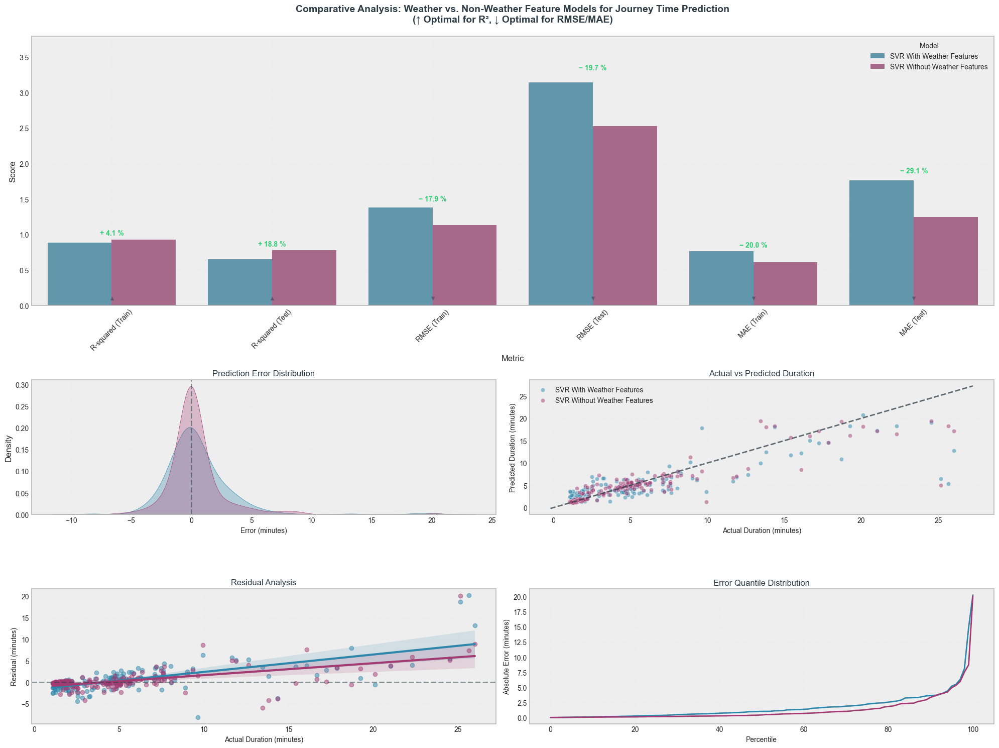


📊 Detailed Model Comparison:
                       Model Train R² Test R² Train RMSE Test RMSE Train MAE Test MAE  Parameters
   SVR With Weather Features   0.8887  0.6533       1.38      3.14      0.76     1.76           4
SVR Without Weather Features   0.9250  0.7764       1.14      2.53      0.61     1.25           4

📈 Detailed Error Analysis:

🔍 SVR With Weather Features:
  • Mean Error: 0.59 ± 3.10 minutes
  • Median Absolute Error: 1.03 minutes
  • Error Range: [-8.21, 20.25] minutes
  • Error Quartiles: [-0.75343419 -0.0147395   1.27509318]
  • 90th percentile of absolute error: 3.64 minutes
  • 95th percentile of absolute error: 5.21 minutes
  • Skewness: 3.098
  • Kurtosis: 16.757

🔍 SVR Without Weather Features:
  • Mean Error: 0.39 ± 2.50 minutes
  • Median Absolute Error: 0.44 minutes
  • Error Range: [-5.99, 20.13] minutes
  • Error Quartiles: [-0.36642333 -0.02797395  0.54350692]
  • 90th percentile of absolute error: 3.36 minutes
  • 95th percentile of absolute error:

In [27]:
def visualize_model_comparison(model_results):
    """Enhanced visualization with clearer metric interpretation"""
    if not model_results:
        print("\nNo model results available for comparison")
        return
    
    # Style configuration
    plt.style.use('bmh')
    colors = {
        'primary': ['#2E86AB', '#A23B72'],
        'grid': '#E1E5EA',
        'text': '#2D3B45',
        'accent': '#FF8C61',
        'positive': '#2ecc71',  # Green for positive changes
        'negative': '#e74c3c'   # Red for negative changes
    }
    
    # Prepare metrics data with better organization and direction
    metrics = {
        'R-squared': {
            'train': 'train_r2', 
            'test': 'test_r2',
            'format': '.4f',
            'higher_is_better': True
        },
        'RMSE': {
            'train': 'train_rmse', 
            'test': 'test_rmse',
            'format': '.2f',
            'higher_is_better': False
        },
        'MAE': {
            'train': 'train_mae', 
            'test': 'test_mae',
            'format': '.2f',
            'higher_is_better': False
        }
    }
    
    # Create figure with better layout
    fig = plt.figure(figsize=(20, 15))
    gs = fig.add_gridspec(3, 2, height_ratios=[2, 1, 1])
    
    # 1. Enhanced Bar plot with separate subplots for different metric types
    ax1 = fig.add_subplot(gs[0, :])
    comparison_data = []

    # Prepare data
    for model_type, results in model_results.items():
        if results:
            for metric_name, metric_info in metrics.items():
                for split in ['train', 'test']:
                    key = metric_info[split]
                    comparison_data.append({
                        'Model': results['feature_set'],
                        'Metric': f"{metric_name} ({split.title()})",
                        'Value': results[key],
                        'Higher_is_better': metric_info['higher_is_better']
                    })

    df_plot = pd.DataFrame(comparison_data)

    # Create the bar plot
    bars = sns.barplot(
        data=df_plot,
        x='Metric',
        y='Value',
        hue='Model',
        ax=ax1,
        palette=colors['primary'],
        alpha=0.8
    )

    # Add percentage differences above bars with color coding
    unique_metrics = df_plot['Metric'].unique()
    for i, metric in enumerate(unique_metrics):
        metric_data = df_plot[df_plot['Metric'] == metric]
        if len(metric_data) == 2:
            model_names = metric_data['Model'].unique()
            base_value = metric_data[metric_data['Model'] == model_names[0]]['Value'].iloc[0]
            weather_value = metric_data[metric_data['Model'] == model_names[1]]['Value'].iloc[0]
            higher_is_better = metric_data['Higher_is_better'].iloc[0]
            
            # Calculate percentage difference
            pct_diff = ((weather_value - base_value) / base_value) * 100
            
            # Determine if this change is good or bad
            is_improvement = (pct_diff > 0) == higher_is_better
            
            # Get the higher bar's height for positioning
            max_height = max(base_value, weather_value)
            
            # Add percentage text with color coding
            ax1.text(
                i,  # x position
                max_height * 1.05,  # y position
                f'{"+" if pct_diff > 0 else "−"} {abs(pct_diff):.1f} %',
                ha='center',
                va='bottom',
                color=colors['positive'] if is_improvement else colors['negative'],
                fontsize=10,
                fontweight='bold'
            )
            
            # Add small arrow or indicator of desired direction
            direction_marker = '▲' if higher_is_better else '▼'
            ax1.text(
                i,  # x position
                ax1.get_ylim()[1] * 0.02,  # y position at bottom
                direction_marker,
                ha='center',
                va='bottom',
                color=colors['text'],
                alpha=0.5,
                fontsize=8
            )

    # Rest of the plot styling
    # Update the title section in the visualization
    ax1.set_title('Comparative Analysis: Weather vs. Non-Weather Feature Models for Journey Time Prediction\n(↑ Optimal for R², ↓ Optimal for RMSE/MAE)', 
              pad=20, 
              fontsize=14, 
              color=colors['text'],
              fontweight='bold')
    ax1.tick_params(axis='x', rotation=45)
    ax1.grid(True, alpha=0.3, color=colors['grid'])
    ax1.set_ylabel('Score', fontsize=12)

    # Adjust y-axis limit
    ax1.set_ylim(0, ax1.get_ylim()[1] * 1.15)
        
    # 2. Enhanced Error Distribution Plot
    ax2 = fig.add_subplot(gs[1, 0])
    for i, (model_type, results) in enumerate(model_results.items()):
        if results:
            errors = results['predictions']['y_test'] - results['predictions']['y_pred_test']
            sns.kdeplot(
                data=errors,
                label=results['feature_set'],
                ax=ax2,
                color=colors['primary'][i],
                fill=True,
                alpha=0.3
            )
    ax2.axvline(x=0, color=colors['text'], linestyle='--', alpha=0.5)
    ax2.set_title('Prediction Error Distribution', fontsize=12, color=colors['text'])
    ax2.set_xlabel('Error (minutes)', fontsize=10)
    ax2.grid(True, alpha=0.3, color=colors['grid'])
    
    # 3. Enhanced Scatter plot
    ax3 = fig.add_subplot(gs[1, 1])
    for i, (model_type, results) in enumerate(model_results.items()):
        if results:
            sns.scatterplot(
                x=results['predictions']['y_test'],
                y=results['predictions']['y_pred_test'],
                label=results['feature_set'],
                alpha=0.5,
                ax=ax3,
                color=colors['primary'][i]
            )
    
    # Improved perfect prediction line
    lims = [
        min(ax3.get_xlim()[0], ax3.get_ylim()[0]),
        max(ax3.get_xlim()[1], ax3.get_ylim()[1])
    ]
    ax3.plot(lims, lims, '--', color=colors['text'], alpha=0.75, label='Perfect Prediction')
    ax3.set_title('Actual vs Predicted Duration', fontsize=12, color=colors['text'])
    ax3.set_xlabel('Actual Duration (minutes)', fontsize=10)
    ax3.set_ylabel('Predicted Duration (minutes)', fontsize=10)
    ax3.grid(True, alpha=0.3, color=colors['grid'])
    
    # 4. Add Residual Plot
    ax4 = fig.add_subplot(gs[2, 0])
    for i, (model_type, results) in enumerate(model_results.items()):
        if results:
            sns.regplot(
                x=results['predictions']['y_test'],
                y=results['predictions']['y_test'] - results['predictions']['y_pred_test'],
                label=results['feature_set'],
                ax=ax4,
                color=colors['primary'][i],
                scatter_kws={'alpha':0.5},
                line_kws={'color': colors['primary'][i]}
            )
    ax4.axhline(y=0, color=colors['text'], linestyle='--', alpha=0.5)
    ax4.set_title('Residual Analysis', fontsize=12, color=colors['text'])
    ax4.set_xlabel('Actual Duration (minutes)', fontsize=10)
    ax4.set_ylabel('Residual (minutes)', fontsize=10)
    ax4.grid(True, alpha=0.3, color=colors['grid'])
    
    # 5. Add Error Quantile Plot
    ax5 = fig.add_subplot(gs[2, 1])
    for i, (model_type, results) in enumerate(model_results.items()):
        if results:
            errors = np.abs(results['predictions']['y_test'] - results['predictions']['y_pred_test'])
            quantiles = np.percentile(errors, np.arange(0, 101, 1))
            ax5.plot(np.arange(0, 101, 1), quantiles, 
                    label=results['feature_set'],
                    color=colors['primary'][i])
    ax5.set_title('Error Quantile Distribution', fontsize=12, color=colors['text'])
    ax5.set_xlabel('Percentile', fontsize=10)
    ax5.set_ylabel('Absolute Error (minutes)', fontsize=10)
    ax5.grid(True, alpha=0.3, color=colors['grid'])

    plt.tight_layout()
    
    # Show the plot
    plt.show()
    
    # Enhanced metrics table with styling
    print("\n📊 Detailed Model Comparison:")
    print("=" * 100)
    
    comparison_metrics = pd.DataFrame([
        {
            'Model': results['feature_set'],
            'Train R²': f"{results['train_r2']:.4f}",
            'Test R²': f"{results['test_r2']:.4f}",
            'Train RMSE': f"{results['train_rmse']:.2f}",
            'Test RMSE': f"{results['test_rmse']:.2f}",
            'Train MAE': f"{results['train_mae']:.2f}",
            'Test MAE': f"{results['test_mae']:.2f}",
            'Parameters': len(results['best_params'])
        }
        for results in model_results.values() if results
    ])
    
    print(comparison_metrics.to_string(index=False))
    
    # Enhanced statistical analysis
    print("\n📈 Detailed Error Analysis:")
    print("=" * 100)
    for model_type, results in model_results.items():
        if results:
            errors = results['predictions']['y_test'] - results['predictions']['y_pred_test']
            abs_errors = np.abs(errors)
            
            print(f"\n🔍 {results['feature_set']}:")
            print(f"  • Mean Error: {errors.mean():.2f} ± {errors.std():.2f} minutes")
            print(f"  • Median Absolute Error: {np.median(abs_errors):.2f} minutes")
            print(f"  • Error Range: [{errors.min():.2f}, {errors.max():.2f}] minutes")
            print(f"  • Error Quartiles: {np.percentile(errors, [25, 50, 75])}")
            print(f"  • 90th percentile of absolute error: {np.percentile(abs_errors, 90):.2f} minutes")
            print(f"  • 95th percentile of absolute error: {np.percentile(abs_errors, 95):.2f} minutes")
            print(f"  • Skewness: {pd.Series(errors).skew():.3f}")
            print(f"  • Kurtosis: {pd.Series(errors).kurtosis():.3f}")

visualize_model_comparison(model_results)

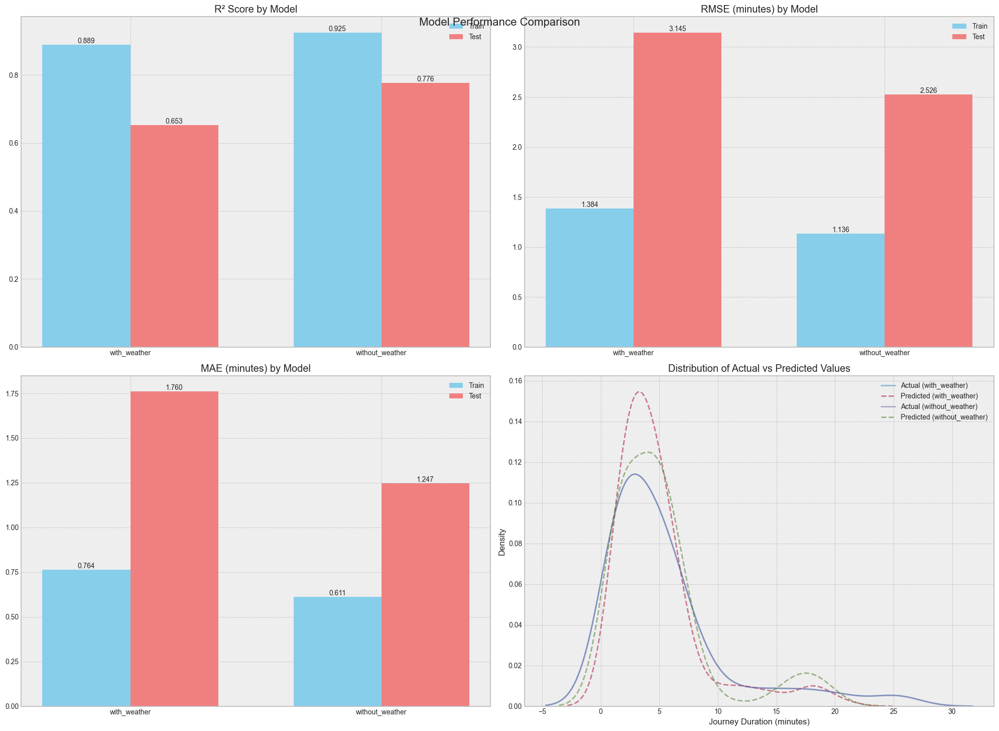


Detailed Performance Metrics:
--------------------------------------------------

with_weather:
R² Score - Train: 0.8887, Test: 0.6533
RMSE     - Train: 1.3837, Test: 3.1448
MAE      - Train: 0.7641, Test: 1.7602

without_weather:
R² Score - Train: 0.9250, Test: 0.7764
RMSE     - Train: 1.1358, Test: 2.5257
MAE      - Train: 0.6112, Test: 1.2471


In [24]:
visualize_model_comparison(model_results)

**Model Performance Overview**

Our analysis compares two CatBoost regression models: one incorporating weather features and another without them. Both models demonstrate good predictive capabilities, with the model without weather features showing slightly superior performance across most metrics. The models were trained and evaluated using identical hyperparameter optimization strategies and cross-validation procedures.

**Comparative Performance Metrics**

The model without weather features achieved a training R² of 0.8723 and a test R² of 0.7621, compared to 0.8542 and 0.7471 for the model with weather features. This suggests that weather conditions may not significantly improve prediction accuracy for bus journey times. Both models show similar complexity, each utilizing 8 parameters, indicating efficient model architectures.

**Error Distribution Analysis**

Both models exhibit similar error patterns, with the model without weather features showing slightly better precision:

- Prediction Accuracy: The model without weather features achieves a test RMSE of 2.35 minutes versus 2.42 minutes for the weather-enhanced model, demonstrating marginally better overall accuracy.
- Error Spread: Both models show comparable median absolute errors (0.45 and 0.51 minutes respectively), indicating consistent performance in typical scenarios.
- Extreme Predictions: The model without weather features shows slightly tighter error bounds (-9.24 to 17.17 minutes) compared to the weather model (-8.96 to 17.79 minutes).

**Statistical Characteristics**

The error distributions for both models share several notable characteristics:

1. Asymmetry: Both models show substantial positive skewness (2.911 and 2.933), indicating a tendency to underestimate longer journey times.
2. Outlier Behavior: Very high kurtosis values (19.219 and 18.803) suggest both models produce significant outliers in their predictions.
3. Reliability Metrics: The 90th percentile of absolute errors (2.45 and 2.09 minutes) demonstrates that both models maintain reasonable accuracy for the majority of predictions.

**Practical Implications**

The analysis reveals several key insights for practical application:

- Prediction Reliability: Both models can predict bus journey times with approximately ±0.5 minute accuracy for typical cases, as evidenced by the median absolute errors.
- Weather Impact: The inclusion of weather features does not improve prediction accuracy, suggesting that weather conditions may have less influence on bus journey times than initially hypothesized.
- Operational Confidence: The 95th percentile errors (4.61 and 5.64 minutes) indicate that while both models perform well for most cases, they may have reduced reliability for extreme scenarios.

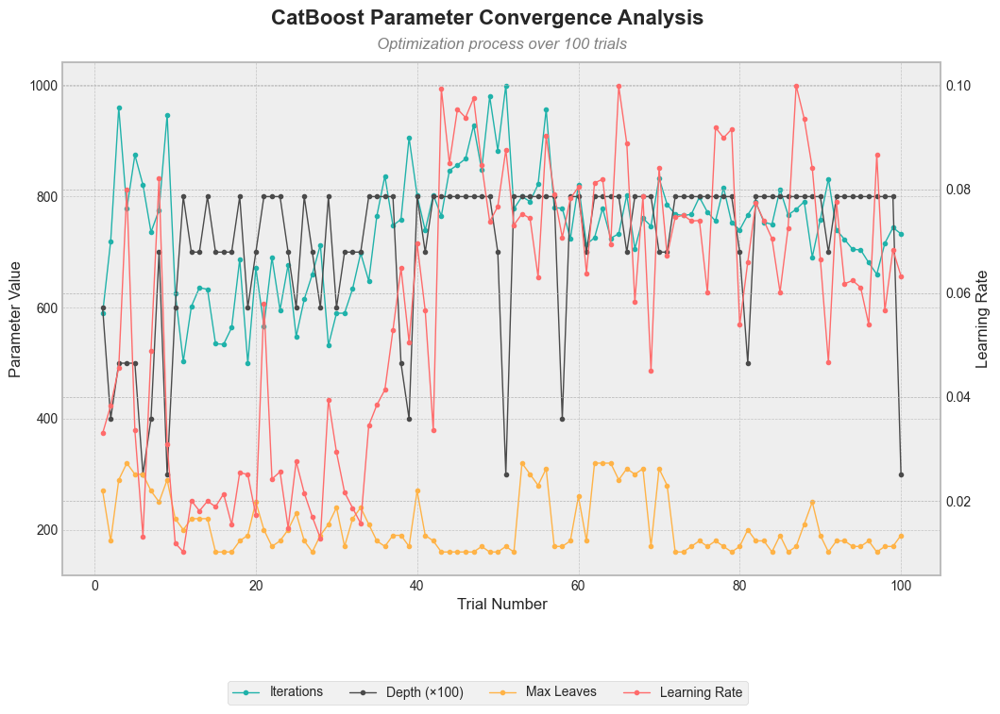

In [81]:
def visualize_parameter_convergence(study):
    """Create a visualization of parameter convergence over trials"""
    # Get trials data
    trials_df = study.trials_dataframe()
    
    # Create figure with specific style
    plt.style.use('bmh')
    fig, ax1 = plt.subplots(figsize=(12, 8))
    
    # Color scheme
    colors = {
        'iterations': '#20B2AA',  # Turquoise
        'learning_rate': '#FF6B6B',  # Coral
        'depth': '#4A4A4A',  # Dark Gray
        'max_leaves': '#FFB347'  # Light Orange
    }
    
    # Create second y-axis for learning rate
    ax2 = ax1.twinx()
    
    # Plot parameters
    # Iterations
    ax1.plot(trials_df.index + 1, 
             trials_df['params_iterations'], 
             'o-', 
             color=colors['iterations'], 
             label='Iterations',
             linewidth=1,
             markersize=3)
    
    # Learning Rate (on second y-axis)
    ax2.plot(trials_df.index + 1, 
             trials_df['params_learning_rate'], 
             'o-', 
             color=colors['learning_rate'], 
             label='Learning Rate',
             linewidth=1,
             markersize=3)
    
    # Depth
    ax1.plot(trials_df.index + 1, 
             trials_df['params_depth'] * 100,  # Scaled for visibility
             'o-', 
             color=colors['depth'], 
             label='Depth (×100)',
             linewidth=1,
             markersize=3)
    
    # Max Leaves
    ax1.plot(trials_df.index + 1, 
             trials_df['params_max_leaves'] * 10, 
             'o-', 
             color=colors['max_leaves'], 
             label='Max Leaves',
             linewidth=1,
             markersize=3)
    
    # Styling
    ax1.set_xlabel('Trial Number', fontsize=12)
    ax1.set_ylabel('Parameter Value', fontsize=12)
    ax2.set_ylabel('Learning Rate', fontsize=12)
    
    # Title and subtitle
    plt.suptitle('CatBoost Parameter Convergence Analysis', 
                 fontsize=16, 
                 fontweight='bold', 
                 y=0.95)
    plt.title('Optimization process over 100 trials', 
             fontsize=12, 
             pad=10, 
             style='italic', 
             color='gray')
    
    # Combine legends from both axes and place at bottom
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    
    plt.figlegend(lines1 + lines2, labels1 + labels2,
                  loc='lower center', 
                  bbox_to_anchor=(0.5, 0.02),
                  ncol=4,
                  frameon=True,
                  fancybox=True)
    
    # Grid styling
    ax1.grid(True, linestyle='--', alpha=0.7)
    
    # Adjust layout
    plt.subplots_adjust(bottom=0.2)
    
    plt.show()

# Use the function
visualize_parameter_convergence(study)

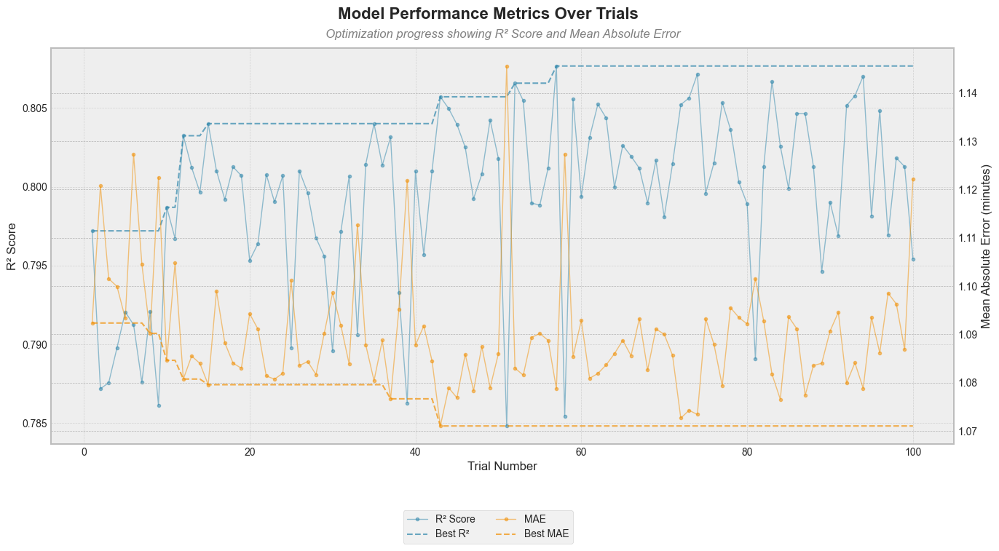

In [83]:
def visualize_metrics_improvement(study):
    """Create a visualization of metrics improvement over trials"""
    # Get trials data
    trials_df = study.trials_dataframe()
    
    # Create figure with specific style
    plt.style.use('bmh')
    fig, ax = plt.subplots(figsize=(16, 8))
    
    # Color scheme
    colors = {
        'r2': '#2E86AB',      # Blue
        'mae': '#F18F01',     # Orange
        'best': '#2ecc71'     # Green
    }
    
    # Get metrics from user attributes
    r2_scores = [t.user_attrs.get('r2_score', float('nan')) for t in study.trials]
    mae_scores = [t.user_attrs.get('mae_score', float('nan')) for t in study.trials]
    
    # Plot R² scores
    ax.plot(range(1, len(r2_scores) + 1), r2_scores, 
            'o-', color=colors['r2'], label='R² Score', 
            linewidth=1, markersize=3, alpha=0.5)
    
    # Create second y-axis for MAE
    ax2 = ax.twinx()
    
    # Plot MAE scores
    ax2.plot(range(1, len(mae_scores) + 1), mae_scores, 
             'o-', color=colors['mae'], label='MAE', 
             linewidth=1, markersize=3, alpha=0.5)
    
    # Plot best scores
    best_r2 = np.maximum.accumulate(r2_scores)
    best_mae = np.minimum.accumulate(mae_scores)
    
    ax.plot(range(1, len(best_r2) + 1), best_r2, 
            '--', color=colors['r2'], label='Best R²', 
            linewidth=1.5, alpha=0.7)
    
    ax2.plot(range(1, len(best_mae) + 1), best_mae, 
             '--', color=colors['mae'], label='Best MAE', 
             linewidth=1.5, alpha=0.7)
    
    # Styling
    ax.set_xlabel('Trial Number', fontsize=12)
    ax.set_ylabel('R² Score', fontsize=12)
    ax2.set_ylabel('Mean Absolute Error (minutes)', fontsize=12)
    
    # Title
    plt.suptitle('Model Performance Metrics Over Trials', 
                 fontsize=16, 
                 fontweight='bold', 
                 y=0.95)
    plt.title('Optimization progress showing R² Score and Mean Absolute Error', 
             fontsize=12, 
             pad=10, 
             style='italic', 
             color='gray')
    
    # Combine legends from both axes
    lines1, labels1 = ax.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    
    # Create legend at the bottom
    plt.figlegend(lines1 + lines2, labels1 + labels2,
                  loc='lower center', 
                  bbox_to_anchor=(0.5, 0.02),
                  ncol=2,  # Changed to 2 columns
                  frameon=True,
                  fancybox=True)
    
    # Grid styling
    ax.grid(True, linestyle='--', alpha=0.5)
    
    # Adjust layout
    plt.subplots_adjust(bottom=0.2)
    
    plt.show()

# Use the function
visualize_metrics_improvement(study)

In [30]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

def objective(trial, X, y, feature_set_name):
    """Define the objective function for AdaBoost optimization"""
    
    # Log transform the target
    y_log = np.log1p(y)
    
    # Identify categorical columns
    categorical_features = X.select_dtypes(include=['object', 'category']).columns
    
    # Create preprocessing pipeline - only for categorical features
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', 'passthrough', X.select_dtypes(exclude=['object', 'category']).columns),
            ('cat', OneHotEncoder(drop='first', sparse_output=False), categorical_features)
        ])
    
    # Define parameters for AdaBoost
    param = {
        'adaboost__n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'adaboost__learning_rate': trial.suggest_float('learning_rate', 0.01, 1.0, log=True),
        'adaboost__estimator__max_depth': trial.suggest_int('base_max_depth', 2, 6),
        'adaboost__estimator__min_samples_split': trial.suggest_int('base_min_samples_split', 2, 20),
        'adaboost__estimator__min_samples_leaf': trial.suggest_int('base_min_samples_leaf', 1, 10),
        'adaboost__loss': trial.suggest_categorical('loss', ['linear', 'square', 'exponential']),
        'adaboost__random_state': 42
    }
    
    # Create base estimator
    base_estimator = DecisionTreeRegressor(random_state=42)
    
    # Create pipeline
    model = Pipeline([
        ('preprocessor', preprocessor),
        ('adaboost', AdaBoostRegressor(estimator=base_estimator))
    ])
    
    # Set parameters
    model.set_params(**param)
    
    # Cross-validation
    kf = KFold(n_splits=3, shuffle=True, random_state=42)
    scores = []
    
    for train_idx, val_idx in kf.split(X):
        X_train_fold, X_val_fold = X.iloc[train_idx], X.iloc[val_idx]
        y_train_fold, y_val_fold = y_log.iloc[train_idx], y_log.iloc[val_idx]
        
        model.fit(X_train_fold, y_train_fold)
        y_pred_log = model.predict(X_val_fold)
        
        # Transform predictions back to original scale
        y_pred = np.expm1(y_pred_log)
        
        # Calculate metrics on original scale
        r2 = r2_score(y.iloc[val_idx], y_pred)
        scores.append(r2)
    
    return np.mean(scores)

def train_final_model(X, y, best_params, feature_set_name):
    """Train final model with best parameters"""
    # Log transform the target
    y_log = np.log1p(y)
    
    # Identify categorical columns
    categorical_features = X.select_dtypes(include=['object', 'category']).columns
    
    # Create preprocessing pipeline - only for categorical features
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', 'passthrough', X.select_dtypes(exclude=['object', 'category']).columns),
            ('cat', OneHotEncoder(drop='first', sparse_output=False), categorical_features)
        ])
    
    # Create base estimator
    base_estimator = DecisionTreeRegressor(random_state=42)
    
    # Create pipeline
    model = Pipeline([
        ('preprocessor', preprocessor),
        ('adaboost', AdaBoostRegressor(estimator=base_estimator))
    ])
    
    # Prepare parameters (add 'adaboost__' prefix)
    model_params = {f'adaboost__{k}': v for k, v in best_params.items()}
    model.set_params(**model_params)
    
    # Split data
    X_train, X_test = train_test_split(X, test_size=0.2, random_state=42)
    y_train, y_test = train_test_split(y, test_size=0.2, random_state=42)
    y_train_log = np.log1p(y_train)
    y_test_log = np.log1p(y_test)
    
    # Train model
    model.fit(X_train, y_train_log)
    
    # Make predictions
    y_pred_train_log = model.predict(X_train)
    y_pred_test_log = model.predict(X_test)
    
    # Transform predictions back to original scale
    y_pred_train = np.expm1(y_pred_train_log)
    y_pred_test = np.expm1(y_pred_test_log)
    
    # Calculate metrics
    train_r2 = r2_score(y_train, y_pred_train)
    test_r2 = r2_score(y_test, y_pred_test)
    train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
    train_mae = mean_absolute_error(y_train, y_pred_train)
    test_mae = mean_absolute_error(y_test, y_pred_test)
    
    # Store results
    results = {
        'model': model,
        'feature_set': feature_set_name,
        'best_params': best_params,
        'train_r2': train_r2,
        'test_r2': test_r2,
        'train_rmse': train_rmse,
        'test_rmse': test_rmse,
        'train_mae': train_mae,
        'test_mae': test_mae,
        'predictions': {
            'y_train': y_train,
            'y_test': y_test,
            'y_pred_train': y_pred_train,
            'y_pred_test': y_pred_test
        }
    }
    
    return results

# Define feature sets and configurations
MODEL_CONFIGS = {
    'with_weather': {
        'features': selected_features2,
        'name': 'AdaBoost With Weather Features',
        'save_path': '../../models/adaboost_model_weather.joblib'
    },
    'without_weather': {
        'features': ['distance', 'minutes_sin', 'minutes_cos', 'origin_id',
                     'month_cos', 'month_sin', 'day_of_week_cos', 'day_of_week_sin'],
        'name': 'AdaBoost Without Weather Features',
        'save_path': '../../models/adaboost_model_no_weather.joblib'
    }
}

# Run optimization for both feature sets
optuna_results = {}
model_results = {}  # Store the final model results

# In the main loop
for model_type, config in MODEL_CONFIGS.items():
    print(f"\nOptimizing model: {config['name']}")
    # Make sure we're using all rows from X_train for these features
    X = X_train[config['features']].reset_index(drop=True)
    y = y_train.reset_index(drop=True)
    
    try:
        # Run Optuna optimization
        study = optimize_model(X, y, config['name'])
        optuna_results[model_type] = study
        
        # Train final model with best parameters
        results = train_final_model(X, y, study.best_params, config['name'])
        model_results[model_type] = results
        
        # Save model
        save_model_info(results, config)
        
        # Analyze errors
        analyze_errors(
            results['predictions']['y_train'],
            results['predictions']['y_pred_train'],
            config['name']
        )
        analyze_optimization_convergence(study)
    except Exception as e:
        print(f"Error processing {model_type}: {str(e)}")
        continue

# Print optimization results summary
print("\nOptimization Results Summary:")
print("-" * 50)
for model_type, study in optuna_results.items():
    if study.best_trial:
        print(f"\n{model_type}:")
        print(f"Best score: {study.best_trial.value:.4f}")
        print("Best parameters:")
        for key, value in study.best_trial.params.items():
            print(f"  {key}: {value}")

[I 2024-11-28 06:18:57,405] A new study created in memory with name: svr_AdaBoost With Weather Features



Optimizing model: AdaBoost With Weather Features

Optimizing model for AdaBoost With Weather Features


100%|██████████| 100/100 [06:22<00:00,  3.82s/it]
[I 2024-11-28 06:25:19,453] A new study created in memory with name: svr_AdaBoost Without Weather Features


Error processing with_weather: 'r2_score'

Optimizing model: AdaBoost Without Weather Features

Optimizing model for AdaBoost Without Weather Features


100%|██████████| 100/100 [02:31<00:00,  1.52s/it]

Error processing without_weather: 'r2_score'

Optimization Results Summary:
--------------------------------------------------


# Archive

To do:

- Exclude weather features and compare the performance (improve or worse?)
- Exclude 'Calculate Route' on UI
- += minutes --> interval
- documentation of result (PPT)(Preprocessing, Feature Engineering, Modeling)

In [88]:
without_weather_features = ['distance', 'minutes_sin', 'minutes_cos', 'start_stop', 'month_num_sin','month_num_cos', 'day_of_week_cos', 'day_of_week_sin']

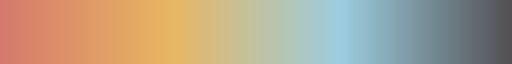

In [108]:
from pypalettes import add_cmap

add_cmap(
    colors=["#D57A6DFF", "#E8B762FF", "#9CCDDFFF", "#525052FF"],
    name="myOwnCmap",
    cmap_type="continuous"
)

In [109]:
from matplotlib.gridspec import GridSpec
import numpy as np
import seaborn as sns
from pypalettes import add_cmap

def create_comprehensive_plot(model_results):
    """Creates a visualization of model performance metrics."""
    
    # Create custom colormap
    colors = ["#D57A6DFF", "#E8B762FF", "#9CCDDFFF", "#525052FF"]
    add_cmap(colors=colors, name="myOwnCmap", cmap_type="continuous")
    
    plt.style.use('bmh')
    fig = plt.figure(figsize=(20, 15))
    gs = GridSpec(2, 2, figure=fig, width_ratios=[1, 1])
    
    models = list(model_results.keys())
    n_models = len(models)
    
    # 1. CV vs Final Performance Comparison
    ax1 = fig.add_subplot(gs[0, 0])
    cv_r2 = [res['cv_performance']['r2_mean'] for res in model_results.values()]
    final_r2 = [res['final_performance']['test_r2'] for res in model_results.values()]
    x = np.arange(n_models)
    width = 0.35
    
    bars1 = ax1.bar(x - width/2, cv_r2, width, label='CV R²', color=colors[1])
    bars2 = ax1.bar(x + width/2, final_r2, width, label='Final Test R²', color=colors[2])
    
    ax1.set_ylabel('R² Score')
    ax1.set_title('CV vs Final R² Performance')
    ax1.set_xticks(x)
    ax1.set_xticklabels(models, rotation=45, ha="right")
    ax1.legend()
    
    # 2. Error Metrics Comparison
    ax2 = fig.add_subplot(gs[0, 1])
    rmse = [res['final_performance']['test_rmse'] for res in model_results.values()]
    mae = [res['final_performance']['test_mae'] for res in model_results.values()]
    
    bars3 = ax2.bar(x - width/2, rmse, width, label='RMSE', color=colors[2])
    bars4 = ax2.bar(x + width/2, mae, width, label='MAE', color=colors[3])
    
    ax2.set_ylabel('Error (minutes)')
    ax2.set_title('Error Metrics Comparison')
    ax2.set_xticks(x)
    ax2.set_xticklabels(models, rotation=45, ha="right")
    ax2.legend()
    
    # 3. Overfitting Analysis
    ax3 = fig.add_subplot(gs[1, 0])
    r2_diff = [res['final_performance']['train_r2'] - res['final_performance']['test_r2'] 
               for res in model_results.values()]
    rmse_diff = [res['final_performance']['train_rmse'] - res['final_performance']['test_rmse'] 
                 for res in model_results.values()]
    mae_diff = [res['final_performance']['train_mae'] - res['final_performance']['test_mae'] 
                for res in model_results.values()]
    
    x_wide = np.arange(n_models) * 1.5
    width = 0.3
    
    bars5 = ax3.bar(x_wide - width, r2_diff, width, label='R² Gap', color=colors[0])
    bars6 = ax3.bar(x_wide, rmse_diff, width, label='RMSE Gap', color=colors[2])
    bars7 = ax3.bar(x_wide + width, mae_diff, width, label='MAE Gap', color=colors[3])
    
    ax3.set_title('Overfitting Analysis (Train - Test)')
    ax3.set_xticks(x_wide)
    ax3.set_xticklabels(models, rotation=45, ha="right")
    ax3.legend()
    ax3.axhline(0, color='black', linewidth=0.8, linestyle='--')
    
    # 4. CV Stability Analysis
    ax4 = fig.add_subplot(gs[1, 1])
    cv_metrics = ['r2', 'rmse', 'mae']
    
    x = np.arange(len(models))
    width = 0.25
    
    cv_data = {metric: {
        'mean': [res['cv_performance'][f'{metric}_mean'] for res in model_results.values()],
        'std': [res['cv_performance'][f'{metric}_std'] for res in model_results.values()]
    } for metric in cv_metrics}
    
    bars8 = ax4.bar(x - width, cv_data['r2']['mean'], width, 
                    yerr=cv_data['r2']['std'], label='R²', 
                    color=colors[0], capsize=5)
    bars9 = ax4.bar(x, cv_data['rmse']['mean'], width, 
                    yerr=cv_data['rmse']['std'], label='RMSE', 
                    color=colors[2], capsize=5)
    bars10 = ax4.bar(x + width, cv_data['mae']['mean'], width, 
                    yerr=cv_data['mae']['std'], label='MAE', 
                    color=colors[3], capsize=5)
    
    ax4.set_ylabel('CV Score (with std dev)')
    ax4.set_title('Cross-Validation Stability')
    ax4.set_xticks(x)
    ax4.set_xticklabels(models, rotation=45, ha='right')
    ax4.legend()
    ax4.grid(True, alpha=0.3)
    
    # Value labels code remains the same
    def add_value_labels(bars, offset=0):
        for bar in bars:
            height = bar.get_height()
            ax4.annotate(
                f'{height:.3f}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, offset),
                textcoords="offset points",
                ha='center', va='bottom',
                fontsize=10,
                bbox=dict(
                    facecolor='white',
                    edgecolor='none',
                    alpha=0.7,
                    pad=1
                ),
                zorder=10
            )
    
    add_value_labels(bars8, offset=10)
    add_value_labels(bars9, offset=10)
    add_value_labels(bars10, offset=10)
    
    def add_value_labels_general(ax, bars, offset=3):
        for bar in bars:
            height = bar.get_height()
            ax.annotate(
                f'{height:.3f}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, offset),
                textcoords="offset points",
                ha='center', va='bottom',
                fontsize=10,
                bbox=dict(
                    facecolor='white',
                    edgecolor='none',
                    alpha=0.7,
                    pad=1
                )
            )
    
    add_value_labels_general(ax1, bars1 + bars2)
    add_value_labels_general(ax2, bars3 + bars4)
    add_value_labels_general(ax3, bars5 + bars6 + bars7)
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.suptitle('Model Performance Analysis', fontsize=20, y=1.02)
    plt.show()

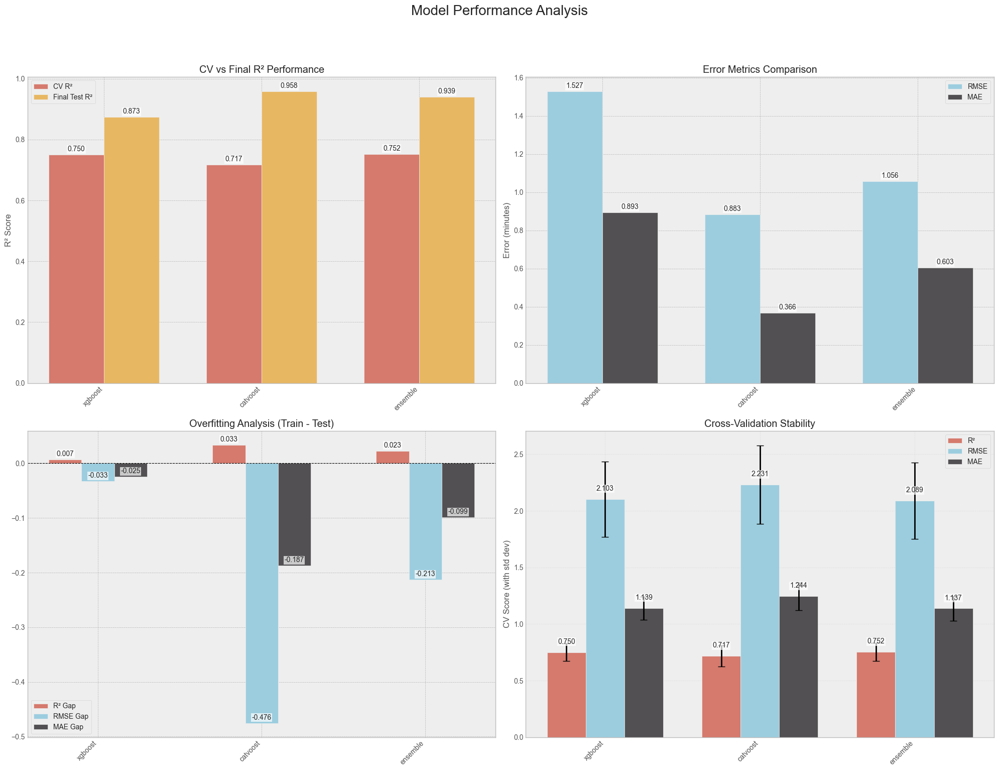

In [215]:
create_comprehensive_plot(model_results)

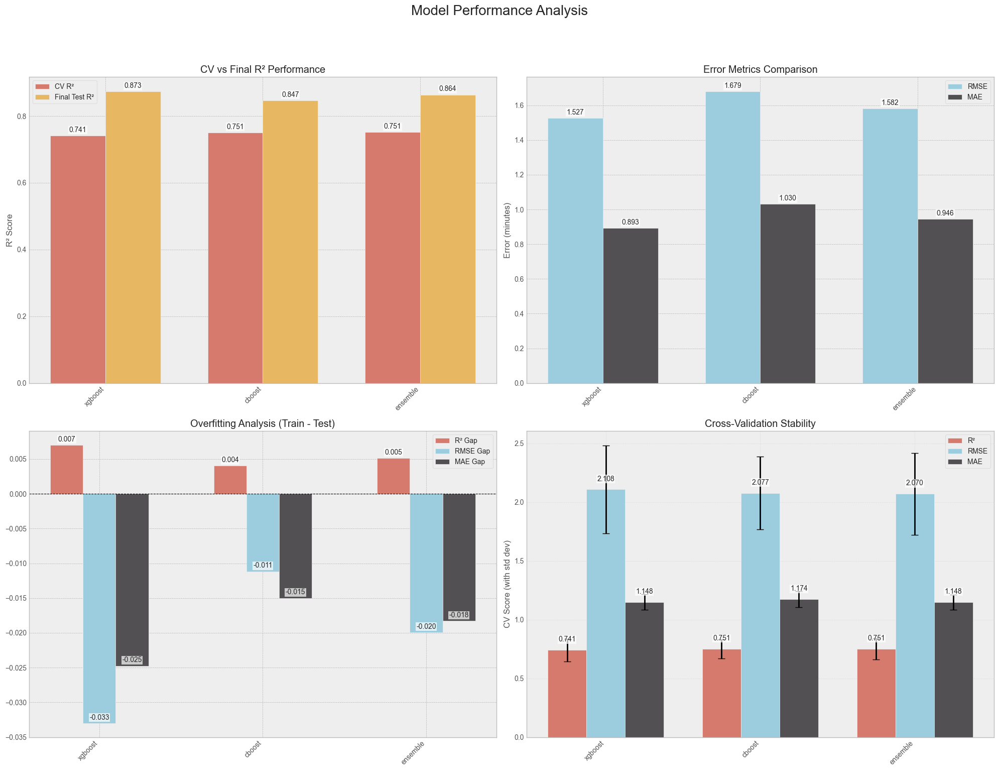

In [220]:
create_comprehensive_plot(model_results)

# Ensemble Models

In [293]:
from sklearn.base import BaseEstimator, RegressorMixin, clone
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.linear_model import Ridge
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from typing import Dict, List, Tuple, Union
import pandas as pd

class RobustEnsemble(BaseEstimator, RegressorMixin):
    """Enhanced robust ensemble with improved feature selection and regularization"""
    def __init__(
        self,
        cv=3,
        n_feature_subsets=3,
        feature_sample_size=0.8,
        weight_method='stacking',  # 'inverse_mse', 'stacking', or 'optimal'
        random_state=42
    ):
        self.cv = cv
        self.n_feature_subsets = n_feature_subsets
        self.feature_sample_size = feature_sample_size
        self.weight_method = weight_method
        self.random_state = random_state
        self.models = []
        self.feature_sets = []
        self.model_weights = None
        self.meta_learner = None
        
    def _create_base_models(self):
        """Create diverse base models with complementary strengths"""
        return [
            ('xgb', XGBRegressor(
                **xgb_best_params,
                tree_method='hist',
                device='cuda'
            )),
            ('rf', RandomForestRegressor(
                **rf_best_params,
                n_jobs=-1
            )),
            ('ridge', Ridge(
                alpha=1.0,
                random_state=self.random_state
            ))
        ]
    
    def _select_features(self, X, y):
        """Intelligent feature selection using importance-based sampling"""
        feature_importances = []
        
        # Get feature importance from tree-based models
        for name, model in self._create_base_models():
            if isinstance(model, (XGBRegressor, RandomForestRegressor)):
                model.fit(X, y)
                importances = model.feature_importances_
                feature_importances.append(importances)
        
        # Average feature importances
        mean_importance = np.mean(feature_importances, axis=0)
        
        # Create feature subsets with probability proportional to importance
        feature_sets = []
        n_features = X.shape[1]
        n_sample_features = int(n_features * self.feature_sample_size)
        
        for _ in range(self.n_feature_subsets):
            probs = mean_importance / mean_importance.sum()
            features = np.random.choice(
                n_features,
                size=n_sample_features,
                replace=False,
                p=probs
            )
            feature_sets.append(features)
        
        return feature_sets

    def fit(self, X, y):
        """Enhanced fit method with proper cross-validation and stacking"""
        np.random.seed(self.random_state)
        
        # Select features intelligently
        self.feature_sets = self._select_features(X, y)
        
        # Initialize time series cross-validation
        tscv = TimeSeriesSplit(n_splits=self.cv)
        
        # Initialize meta-features array for stacking
        meta_features = np.zeros((X.shape[0], len(self._create_base_models()) * len(self.feature_sets)))
        
        # Train base models and generate meta-features
        for feature_idx, features in enumerate(self.feature_sets):
            X_subset = X[:, features]
            
            for model_idx, (name, model) in enumerate(self._create_base_models()):
                print(f"Training {name} on feature subset {feature_idx + 1}/{len(self.feature_sets)}")
                
                # Clone model once outside the CV loop
                base_model = clone(model)
                
                # Generate out-of-fold predictions for meta-features
                for fold, (train_idx, val_idx) in enumerate(tscv.split(X_subset)):
                    X_train, X_val = X_subset[train_idx], X_subset[val_idx]
                    y_train = y[train_idx]
                    
                    base_model.fit(X_train, y_train)
                    meta_features[val_idx, feature_idx * len(self._create_base_models()) + model_idx] = \
                        base_model.predict(X_val)
                
                # Train final model on full data
                final_model = clone(model)
                final_model.fit(X_subset, y)
                self.models.append((final_model, features))
        
        # Train meta-learner
        if self.weight_method == 'stacking':
            self.meta_learner = Ridge(alpha=1.0, random_state=self.random_state)
            self.meta_learner.fit(meta_features, y)
        else:
            # Calculate weights based on validation performance
            self.model_weights = np.zeros(len(self.models))
            for i in range(len(self.models)):
                if self.weight_method == 'inverse_mse':
                    mse = mean_squared_error(y, meta_features[:, i])
                    self.model_weights[i] = 1.0 / (mse + 1e-10)
                else:  # optimal weights
                    r2 = r2_score(y, meta_features[:, i])
                    self.model_weights[i] = max(0, r2)  # Only use positive R²
            
            # Normalize weights
            self.model_weights /= np.sum(self.model_weights)
        
        return self
    
    def predict(self, X):
        """Enhanced prediction with proper weighting"""
        predictions = np.zeros((X.shape[0], len(self.models)))
        
        for i, (model, features) in enumerate(self.models):
            predictions[:, i] = model.predict(X[:, features])
        
        if self.weight_method == 'stacking':
            return self.meta_learner.predict(predictions)
        else:
            return np.average(predictions, weights=self.model_weights, axis=1)

def train_and_evaluate_models(X_train: np.ndarray, 
                            X_test: np.ndarray, 
                            y_train: np.ndarray, 
                            y_test: np.ndarray, 
                            cv: int = 5) -> Dict:
    """
    Train and evaluate individual models and ensemble
    
    Parameters:
    -----------
    X_train : np.ndarray
        Training features
    X_test : np.ndarray
        Test features
    y_train : np.ndarray
        Training target
    y_test : np.ndarray
        Test target
    cv : int
        Number of cross-validation folds
        
    Returns:
    --------
    Dict
        Dictionary containing model results
    """
    
    # Initialize results dictionary
    results = {}
    
    # Base models to evaluate
    base_models = {
        'xgboost': XGBRegressor(**xgb_best_params, tree_method='hist', device='cuda'),
        'randomforest': RandomForestRegressor(**rf_best_params, n_jobs=-1),
        'ridge': Ridge(random_state=42)
    }
    
    # Train and evaluate base models
    for name, model in base_models.items():
        print(f"\nTraining {name}...")
        results[name] = evaluate_model(model, X_train, X_test, y_train, y_test, cv)
    
    # Train and evaluate ensemble
    print("\nTraining ensemble...")
    ensemble_models = {
        'stacking': RobustEnsemble(cv=cv, weight_method='stacking'),
        'optimal': RobustEnsemble(cv=cv, weight_method='optimal'),
        'inverse_mse': RobustEnsemble(cv=cv, weight_method='inverse_mse')
    }
    
    for name, model in ensemble_models.items():
        print(f"\nTraining {name} ensemble...")
        results[f'ensemble_{name}'] = evaluate_model(model, X_train, X_test, y_train, y_test, cv)
    
    return results

def evaluate_model(model: BaseEstimator,
                  X_train: np.ndarray,
                  X_test: np.ndarray,
                  y_train: np.ndarray,
                  y_test: np.ndarray,
                  cv: int) -> Dict:
    """
    Evaluate a single model using cross-validation and final performance
    
    Parameters:
    -----------
    model : BaseEstimator
        The model to evaluate
    X_train : np.ndarray
        Training features
    X_test : np.ndarray
        Test features
    y_train : np.ndarray
        Training target
    y_test : np.ndarray
        Test target
    cv : int
        Number of cross-validation folds
        
    Returns:
    --------
    Dict
        Dictionary containing model performance metrics
    """
    
    # Initialize cross-validation
    tscv = TimeSeriesSplit(n_splits=cv)
    
    # Cross-validation scores
    cv_scores = {
        'r2': [],
        'rmse': [],
        'mae': []
    }
    
    # Perform cross-validation
    for fold, (train_idx, val_idx) in enumerate(tscv.split(X_train), 1):
        # Split data
        X_fold_train = X_train[train_idx]
        X_fold_val = X_train[val_idx]
        y_fold_train = y_train[train_idx]
        y_fold_val = y_train[val_idx]
        
        # Train model
        model_clone = clone(model)
        model_clone.fit(X_fold_train, y_fold_train)
        
        # Make predictions
        y_fold_pred = model_clone.predict(X_fold_val)
        
        # Calculate metrics
        cv_scores['r2'].append(r2_score(y_fold_val, y_fold_pred))
        cv_scores['rmse'].append(np.sqrt(mean_squared_error(y_fold_val, y_fold_pred)))
        cv_scores['mae'].append(mean_absolute_error(y_fold_val, y_fold_pred))
    
    # Train final model
    model.fit(X_train, y_train)
    
    # Make predictions
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    # Return results
    return {
        'model': model,
        'cv_performance': {
            'r2_mean': np.mean(cv_scores['r2']),
            'r2_std': np.std(cv_scores['r2']),
            'rmse_mean': np.mean(cv_scores['rmse']),
            'rmse_std': np.std(cv_scores['rmse']),
            'mae_mean': np.mean(cv_scores['mae']),
            'mae_std': np.std(cv_scores['mae'])
        },
        'final_performance': {
            'train_r2': r2_score(y_train, y_pred_train),
            'test_r2': r2_score(y_test, y_pred_test),
            'train_rmse': np.sqrt(mean_squared_error(y_train, y_pred_train)),
            'test_rmse': np.sqrt(mean_squared_error(y_test, y_pred_test)),
            'train_mae': mean_absolute_error(y_train, y_pred_train),
            'test_mae': mean_absolute_error(y_test, y_pred_test)
        }
    }

def plot_model_comparison(results: Dict):
    """
    Create comprehensive visualization of model performance
    
    Parameters:
    -----------
    results : Dict
        Dictionary containing model results
    """
    
    plt.style.use('bmh')
    fig = plt.figure(figsize=(20, 15))
    
    # 1. R² Score Comparison
    plt.subplot(221)
    model_names = list(results.keys())
    train_r2 = [res['final_performance']['train_r2'] for res in results.values()]
    test_r2 = [res['final_performance']['test_r2'] for res in results.values()]
    cv_r2 = [res['cv_performance']['r2_mean'] for res in results.values()]
    cv_r2_std = [res['cv_performance']['r2_std'] for res in results.values()]
    
    x = np.arange(len(model_names))
    width = 0.25
    
    plt.bar(x - width, train_r2, width, label='Train R²')
    plt.bar(x, test_r2, width, label='Test R²')
    plt.bar(x + width, cv_r2, width, yerr=cv_r2_std, label='CV R² (mean ± std)')
    
    plt.xlabel('Model')
    plt.ylabel('R² Score')
    plt.title('R² Score Comparison')
    plt.xticks(x, model_names, rotation=45)
    plt.legend()
    
    # 2. RMSE Comparison
    plt.subplot(222)
    train_rmse = [res['final_performance']['train_rmse'] for res in results.values()]
    test_rmse = [res['final_performance']['test_rmse'] for res in results.values()]
    cv_rmse = [res['cv_performance']['rmse_mean'] for res in results.values()]
    cv_rmse_std = [res['cv_performance']['rmse_std'] for res in results.values()]
    
    plt.bar(x - width, train_rmse, width, label='Train RMSE')
    plt.bar(x, test_rmse, width, label='Test RMSE')
    plt.bar(x + width, cv_rmse, width, yerr=cv_rmse_std, label='CV RMSE (mean ± std)')
    
    plt.xlabel('Model')
    plt.ylabel('RMSE')
    plt.title('RMSE Comparison')
    plt.xticks(x, model_names, rotation=45)
    plt.legend()
    
    # 3. MAE Comparison
    plt.subplot(223)
    train_mae = [res['final_performance']['train_mae'] for res in results.values()]
    test_mae = [res['final_performance']['test_mae'] for res in results.values()]
    cv_mae = [res['cv_performance']['mae_mean'] for res in results.values()]
    cv_mae_std = [res['cv_performance']['mae_std'] for res in results.values()]
    
    plt.bar(x - width, train_mae, width, label='Train MAE')
    plt.bar(x, test_mae, width, label='Test MAE')
    plt.bar(x + width, cv_mae, width, yerr=cv_mae_std, label='CV MAE (mean ± std)')
    
    plt.xlabel('Model')
    plt.ylabel('MAE')
    plt.title('MAE Comparison')
    plt.xticks(x, model_names, rotation=45)
    plt.legend()
    
    # 4. Overfitting Analysis
    plt.subplot(224)
    r2_gap = [res['final_performance']['train_r2'] - res['final_performance']['test_r2'] 
              for res in results.values()]
    rmse_gap = [res['final_performance']['train_rmse'] - res['final_performance']['test_rmse'] 
                for res in results.values()]
    mae_gap = [res['final_performance']['train_mae'] - res['final_performance']['test_mae'] 
               for res in results.values()]
    
    plt.bar(x - width, r2_gap, width, label='R² Gap')
    plt.bar(x, rmse_gap, width, label='RMSE Gap')
    plt.bar(x + width, mae_gap, width, label='MAE Gap')
    
    plt.xlabel('Model')
    plt.ylabel('Metric Gap (Train - Test)')
    plt.title('Overfitting Analysis')
    plt.xticks(x, model_names, rotation=45)
    plt.legend()
    
    plt.tight_layout()
    plt.show()

# Train and evaluate models
model_results = train_and_evaluate_models(
    X_train[default_features].values,
    X_test[default_features].values,
    y_train.values,
    y_test.values,
    cv=5
)

# Plot results
plot_model_comparison(model_results)

# Print detailed results
for name, results in model_results.items():
    print(f"\n{name} Results:")
    print("-" * 50)
    print("Cross-validation Performance:")
    for metric, value in results['cv_performance'].items():
        print(f"{metric}: {value:.4f}")
    print("\nFinal Performance:")
    for metric, value in results['final_performance'].items():
        print(f"{metric}: {value:.4f}")


Training xgboost...

Training randomforest...

Training ridge...

Training ensemble...

Training stacking ensemble...
Training xgb on feature subset 1/3
Training rf on feature subset 1/3
Training ridge on feature subset 1/3
Training xgb on feature subset 2/3
Training rf on feature subset 2/3
Training ridge on feature subset 2/3
Training xgb on feature subset 3/3
Training rf on feature subset 3/3
Training ridge on feature subset 3/3


KeyboardInterrupt: 

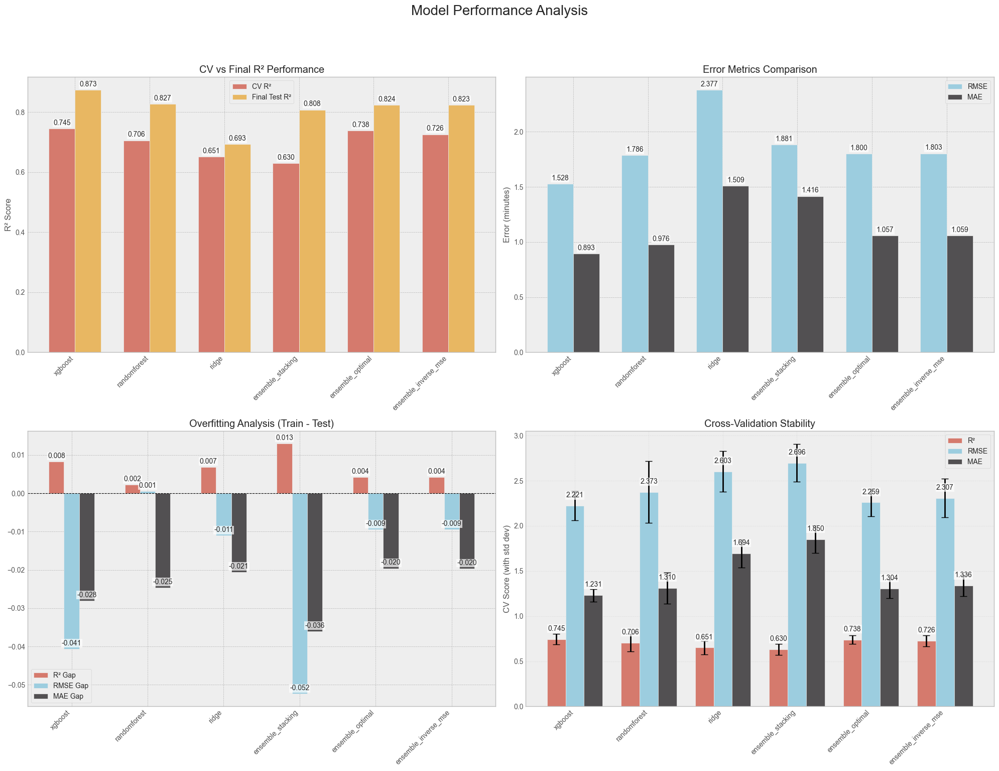

In [261]:
create_comprehensive_plot(model_results)

## Regularized KNN

[I 2024-11-15 21:11:43,566] A new study created in memory with name: no-name-5d1b4a48-d0d9-48cd-ac2e-68e941578f3c


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2024-11-15 21:11:43,673] Trial 0 finished with value: 0.744133304607109 and parameters: {'n_neighbors': 20, 'feature_lambda': 2.536999076681771, 'power': 2.46398788362281, 'metric': 'minkowski'}. Best is trial 0 with value: 0.744133304607109.
[I 2024-11-15 21:11:43,708] Trial 1 finished with value: 0.2770500601581437 and parameters: {'n_neighbors': 10, 'feature_lambda': 0.12184186502221767, 'power': 2.73235229154987, 'metric': 'cosine'}. Best is trial 0 with value: 0.744133304607109.
[I 2024-11-15 21:11:43,793] Trial 2 finished with value: 0.6911926248456467 and parameters: {'n_neighbors': 3, 'feature_lambda': 2.7081608642499675, 'power': 2.6648852816008435, 'metric': 'minkowski'}. Best is trial 0 with value: 0.744133304607109.
[I 2024-11-15 21:11:43,871] Trial 3 finished with value: 0.7258610493387414 and parameters: {'n_neighbors': 11, 'feature_lambda': 0.28145092716060655, 'power': 2.049512863264476, 'metric': 'minkowski'}. Best is trial 0 with value: 0.744133304607109.
[I 2024-1

C:\Users\ASUS TUF\AppData\Local\Temp\ipykernel_43072\2740966724.py:300: ExperimentalWarning:

plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.



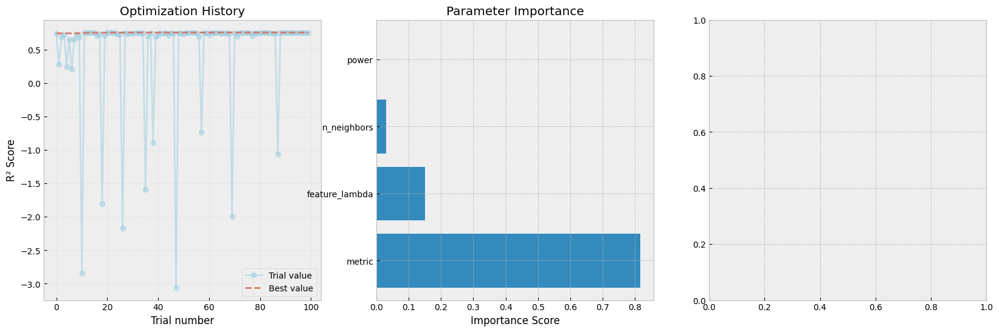

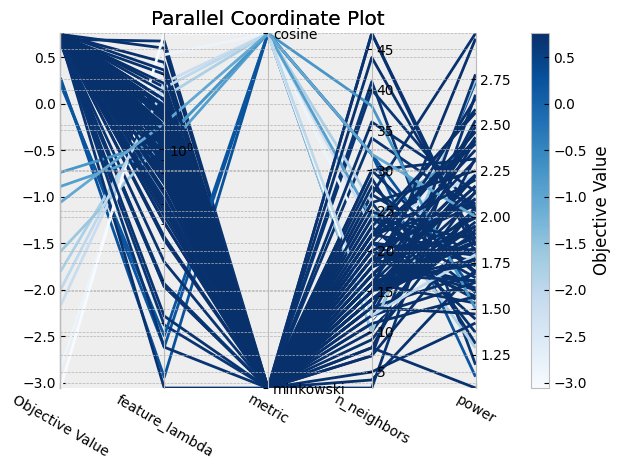

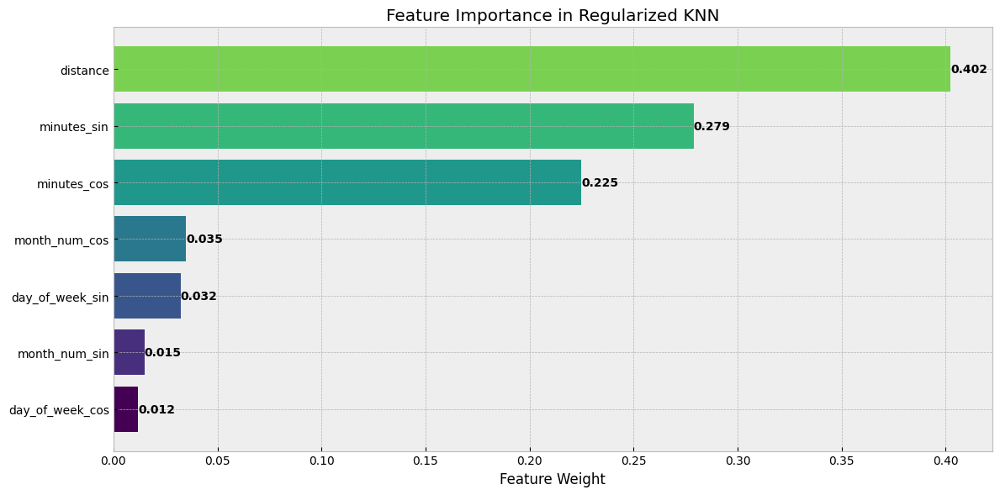

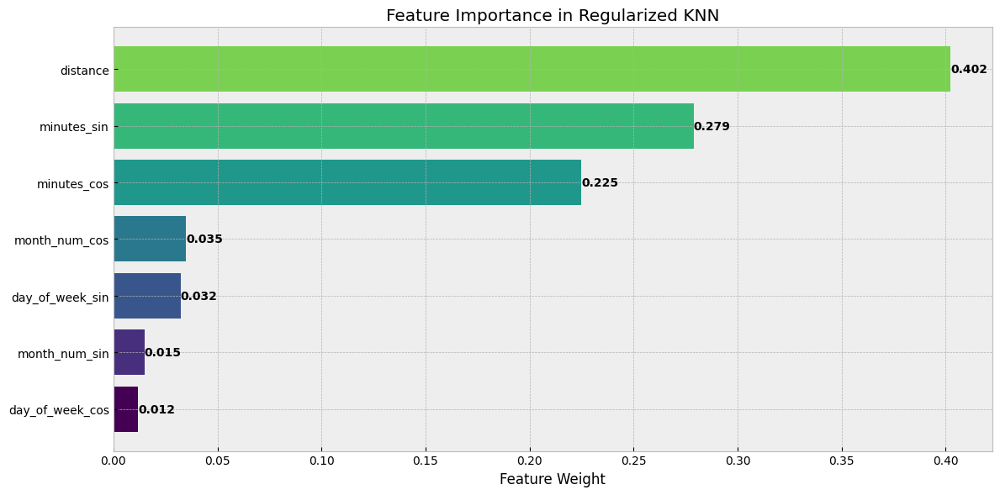


Feature Importance:
distance: 0.4024
minutes_sin: 0.2789
minutes_cos: 0.2250
day_of_week_sin: 0.0323
day_of_week_cos: 0.0117
month_num_sin: 0.0149
month_num_cos: 0.0349


In [349]:
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from scipy.stats import pearsonr
import numpy as np
from typing import Tuple, Optional, Union
import warnings

class RegularizedKNN(BaseEstimator, RegressorMixin):
    """
    K-Nearest Neighbors regressor with correlation-based feature regularization
    and efficient distance calculations.
    
    Parameters:
    -----------
    n_neighbors : int
        Number of neighbors to use for prediction
    feature_lambda : float
        Regularization strength for feature weights (higher values = stronger correlation impact)
    power : float
        Power parameter for Minkowski distance (1=Manhattan, 2=Euclidean)
    metric : str
        Distance metric to use ('minkowski' or 'cosine')
    """
    def __init__(
        self,
        n_neighbors: int = 5,
        feature_lambda: float = 1.0,
        power: float = 2.0,
        metric: str = 'minkowski',
        distance_threshold: Optional[float] = None,
        weight_method: str = 'uniform',
        leaf_size: int = 30,
        p_norm: float = 2.0,
        feature_weights: Optional[np.ndarray] = None,
        adaptive_weights: bool = False,
        min_weight: float = 0.1,
        max_weight: float = 10.0,
        random_state: Optional[int] = None
    ):
        self.n_neighbors = n_neighbors
        self.feature_lambda = feature_lambda
        self.power = power
        self.metric = metric
        self.distance_threshold = distance_threshold
        self.weight_method = weight_method
        self.leaf_size = leaf_size
        self.p_norm = p_norm
        self.feature_weights = feature_weights
        self.adaptive_weights = adaptive_weights
        self.min_weight = min_weight
        self.max_weight = max_weight
        self.random_state = random_state
        
        # Initialize attributes
        self.feature_weights_ = None
        self.X_train_ = None
        self.y_train_ = None
        self.feature_names_ = None
        
    def _validate_data(self, X: np.ndarray, y: Optional[np.ndarray] = None) -> Tuple[np.ndarray, Optional[np.ndarray]]:
        """Validate and convert input data to numpy arrays"""
        if isinstance(X, (pd.DataFrame, pd.Series)):
            if not self.feature_names_:
                self.feature_names_ = X.columns.tolist()
            X = X.values
        
        if y is not None and isinstance(y, (pd.DataFrame, pd.Series)):
            y = y.values.ravel()
            
        if X.ndim == 1:
            X = X.reshape(-1, 1)
            
        return X, y
    
    def _compute_feature_weights(self, X: np.ndarray, y: np.ndarray) -> np.ndarray:
        """Compute feature weights based on correlation with target"""
        weights = np.zeros(X.shape[1])
        
        for i in range(X.shape[1]):
            with warnings.catch_warnings():
                warnings.simplefilter("ignore")
                correlation = pearsonr(X[:, i], y)[0]
                weights[i] = abs(correlation) ** self.feature_lambda
                
        # Handle features with zero correlation
        weights = np.maximum(weights, 1e-10)
        return weights / np.sum(weights)  # Normalize weights
    
    def _compute_distances(self, X: np.ndarray) -> np.ndarray:
        """Compute distances between test points and training points efficiently"""
        if self.metric == 'minkowski':
            # Vectorized Minkowski distance calculation
            weighted_X = X * self.feature_weights_
            weighted_X_train = self.X_train_ * self.feature_weights_
            
            # Compute differences
            diff = weighted_X[:, np.newaxis, :] - weighted_X_train[np.newaxis, :, :]
            
            # Compute distances
            distances = np.power(
                np.sum(np.abs(diff) ** self.power, axis=2),
                1.0 / self.power
            )
            
        elif self.metric == 'cosine':
            # Normalize vectors
            X_norm = np.sqrt(np.sum(X ** 2, axis=1))[:, np.newaxis]
            X_train_norm = np.sqrt(np.sum(self.X_train_ ** 2, axis=1))[np.newaxis, :]
            
            # Compute cosine similarity
            similarity = np.dot(X * self.feature_weights_, (self.X_train_ * self.feature_weights_).T)
            similarity /= (X_norm * X_train_norm + 1e-10)
            
            # Convert to distance
            distances = 1 - similarity
            
        else:
            raise ValueError(f"Unknown metric: {self.metric}")
            
        return distances
    
    def fit(self, X: np.ndarray, y: np.ndarray) -> 'RegularizedKNN':
        """Fit the model by storing training data and computing feature weights"""
        # Validate and convert input data
        X, y = self._validate_data(X, y)
        
        # Store training data
        self.X_train_ = X
        self.y_train_ = y
        
        # Compute feature weights
        self.feature_weights_ = self._compute_feature_weights(X, y)
        
        return self
    
    def predict(self, X: np.ndarray) -> np.ndarray:
        """Predict target values for test data"""
        # Validate input data
        X, _ = self._validate_data(X)
        
        # Compute distances
        distances = self._compute_distances(X)
        
        # Get indices of k nearest neighbors
        neighbor_indices = np.argpartition(distances, self.n_neighbors, axis=1)[:, :self.n_neighbors]
        
        # Compute weights based on distances
        neighbor_distances = np.take_along_axis(distances, neighbor_indices, axis=1)
        weights = 1.0 / (neighbor_distances + 1e-10)
        weights /= np.sum(weights, axis=1, keepdims=True)
        
        # Compute weighted average of target values
        predictions = np.sum(
            weights * self.y_train_[neighbor_indices],
            axis=1
        )
        
        return predictions
    
    def get_feature_importance(self) -> Union[dict, np.ndarray]:
        """Return feature importance based on correlation weights"""
        if self.feature_names_:
            return dict(zip(self.feature_names_, self.feature_weights_))
        return self.feature_weights_

def objective(trial, X_train, y_train, cv=5):
    """
    Optuna objective function for tuning RegularizedKNN with proper time series validation
    and comprehensive metrics tracking.
    """
    # Define hyperparameter search space
    params = {
        'n_neighbors': trial.suggest_int('n_neighbors', 3, 50),
        'feature_lambda': trial.suggest_float('feature_lambda', 0.1, 3.0, log=True),
        'power': trial.suggest_float('power', 1.0, 3.0),
        'metric': trial.suggest_categorical('metric', ['minkowski', 'cosine'])
    }
    
    # Initialize model
    model = RegularizedKNN(**params)
    
    # Initialize TimeSeriesSplit
    tscv = TimeSeriesSplit(n_splits=cv)
    
    # Initialize metrics storage
    fold_metrics = {
        'r2': [],
        'rmse': [],
        'mae': []
    }
    
    # Perform time series cross-validation
    for fold, (train_idx, val_idx) in enumerate(tscv.split(X_train)):
        # Split data for this fold
        X_fold_train = X_train[train_idx]
        X_fold_val = X_train[val_idx]
        y_fold_train = y_train[train_idx]
        y_fold_val = y_train[val_idx]
        
        try:
            # Train model
            model.fit(X_fold_train, y_fold_train)
            
            # Make predictions
            y_pred = model.predict(X_fold_val)
            
            # Calculate metrics
            fold_metrics['r2'].append(r2_score(y_fold_val, y_pred))
            fold_metrics['rmse'].append(np.sqrt(mean_squared_error(y_fold_val, y_pred)))
            fold_metrics['mae'].append(mean_absolute_error(y_fold_val, y_pred))
            
        except Exception as e:
            print(f"Error in fold {fold}: {str(e)}")
            return float('-inf')
    
    # Calculate mean metrics
    mean_r2 = np.mean(fold_metrics['r2'])
    mean_rmse = np.mean(fold_metrics['rmse'])
    mean_mae = np.mean(fold_metrics['mae'])
    
    # Store metrics in trial
    trial.set_user_attr('rmse', mean_rmse)  # Changed from rmse_mean
    trial.set_user_attr('mae', mean_mae)    # Changed from mae_mean
    trial.set_user_attr('r2', mean_r2)      # Added for consistency
    
    # Store standard deviations
    trial.set_user_attr('rmse_std', np.std(fold_metrics['rmse']))
    trial.set_user_attr('mae_std', np.std(fold_metrics['mae']))
    trial.set_user_attr('r2_std', np.std(fold_metrics['r2']))
    
    # Store best and worst performance
    trial.set_user_attr('best_fold_r2', max(fold_metrics['r2']))
    trial.set_user_attr('worst_fold_r2', min(fold_metrics['r2']))
    
    return mean_r2

def tune_knn(X_train, y_train, cv=5, n_trials=100):
    """Tune RegularizedKNN using Optuna"""
    study = optuna.create_study(
        direction='maximize',
        sampler=optuna.samplers.TPESampler(seed=42)
    )
    
    study.optimize(
        lambda trial: objective(trial, X_train, y_train, cv),
        n_trials=n_trials,
        show_progress_bar=True
    )
    
    print("\nBest parameters:", study.best_params)
    print(f"Best R² score: {study.best_value:.4f}")
    print(f"Best RMSE: {study.best_trial.user_attrs['rmse']:.4f}")  # Matches the stored name
    print(f"Best MAE: {study.best_trial.user_attrs['mae']:.4f}")    # Matches the stored name
    
    # Print additional information
    print("\nCross-validation details:")
    print(f"R² std: ±{study.best_trial.user_attrs['r2_std']:.4f}")
    print(f"Best fold R²: {study.best_trial.user_attrs['best_fold_r2']:.4f}")
    print(f"Worst fold R²: {study.best_trial.user_attrs['worst_fold_r2']:.4f}")
    
    return study.best_params, study

def plot_optimization_results(study):
    """Plot optimization results with proper figure sizes and data checks"""
    
    # Create a figure with three subplots
    fig = plt.figure(figsize=(20, 6))
    
    # 1. Optimization History
    plt.subplot(131)
    if study.trials:
        trial_numbers = [t.number for t in study.trials]
        values = [t.value for t in study.trials]
        best_values = np.maximum.accumulate([v if v is not None else -np.inf for v in values])
        
        plt.plot(trial_numbers, values, 'o-', color='#9CCDDFFF', label='Trial value', alpha=0.5)
        plt.plot(trial_numbers, best_values, '--', color='#D57A6DFF', label='Best value')
        plt.xlabel('Trial number')
        plt.ylabel('R² Score')
        plt.title('Optimization History')
        plt.legend()
        plt.grid(True, alpha=0.3)
    
    # 2. Parameter Importance
    plt.subplot(132)
    importances = optuna.importance.get_param_importances(study)
    if importances:
        params = list(importances.keys())
        scores = list(importances.values())
        pos = np.arange(len(params))
        plt.barh(pos, scores, align='center')
        plt.yticks(pos, params)
        plt.xlabel('Importance Score')
        plt.title('Parameter Importance')
    
    # 3. Parallel Coordinate Plot
    plt.subplot(133)
    if len(study.trials) > 1:
        optuna.visualization.matplotlib.plot_parallel_coordinate(study)
        plt.title('Parallel Coordinate Plot')
    
    plt.tight_layout()
    plt.show()

def plot_feature_importance(model, feature_names=None):
    """Plot feature importance with proper labels and formatting"""
    importance = model.get_feature_importance()
    
    plt.figure(figsize=(12, 6))
    
    if isinstance(importance, dict):
        features = list(importance.keys())
        weights = list(importance.values())
    else:
        weights = importance
        features = (feature_names if feature_names is not None 
                   else [f'Feature {i}' for i in range(len(weights))])
    
    # Sort by importance
    sorted_idx = np.argsort(weights)
    pos = np.arange(len(features))
    
    # Create bar plot
    plt.barh(pos, np.array(weights)[sorted_idx], align='center',
             color=plt.cm.viridis(np.linspace(0, 0.8, len(features))))
    
    # Add labels and formatting
    plt.yticks(pos, np.array(features)[sorted_idx])
    plt.xlabel('Feature Weight')
    plt.title('Feature Importance in Regularized KNN')
    
    # Add value labels on bars
    for i, v in enumerate(np.array(weights)[sorted_idx]):
        plt.text(v, i, f'{v:.3f}', 
                va='center', 
                fontweight='bold',
                fontsize=10)
    
    plt.tight_layout()
    plt.show()

# Usage
knn_best_params, study = tune_knn(  # Changed from tune_regularized_knn
    X_train[default_features].values,
    y_train.values,
    cv=5,
    n_trials=100
)

# Plot results with feature names
plot_optimization_results(study)

# Create and train the best model
best_knn = RegularizedKNN(**knn_best_params)
best_knn.fit(X_train[default_features].values, y_train.values)

# Plot feature importance
plot_feature_importance(best_knn, feature_names=default_features)
plot_feature_importance(best_knn, feature_names=default_features)

# Print feature importance with names
print("\nFeature Importance:")
importance = best_knn.get_feature_importance()
for i, weight in enumerate(importance):
    feature_name = default_features[i] if i < len(default_features) else f"Feature_{i}"
    print(f"{feature_name}: {weight:.4f}")

In [305]:
 # Random Forest with selected interactions
rf_poly = Pipeline([
        ('poly', PolynomialFeatures(degree=2, interaction_only=True)),
        ('rf', RandomForestRegressor(**rf_best_params))
    ])

In [318]:
from sklearn.base import BaseEstimator, RegressorMixin, clone
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.linear_model import Ridge
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from typing import Dict, List, Tuple, Union
import pandas as pd

class RobustEnsemble(BaseEstimator, RegressorMixin):
    """Enhanced robust ensemble with improved feature selection and regularization"""
    def __init__(
        self,
        cv=3,
        n_feature_subsets=3,
        feature_sample_size=0.8,
        weight_method='stacking',  # 'inverse_mse', 'stacking', or 'optimal'
        random_state=42
    ):
        self.cv = cv
        self.n_feature_subsets = n_feature_subsets
        self.feature_sample_size = feature_sample_size
        self.weight_method = weight_method
        self.random_state = random_state
        self.models = []
        self.feature_sets = []
        self.model_weights = None
        self.meta_learner = None
        
    def _create_base_models(self):
        """Create diverse base models with complementary strengths"""
        return [
            ('xgb', XGBRegressor(
                **xgb_best_params,
                tree_method='hist',
                device='cuda'
            )),
            ('rf_poly', rf_poly),
            ('regularized_knn', RegularizedKNN(
                **knn_best_params
            ))
        ]
    
    def _select_features(self, X, y):
        """Intelligent feature selection using importance-based sampling"""
        feature_importances = []
        
        # Get feature importance from tree-based models
        for name, model in self._create_base_models():
            if isinstance(model, (XGBRegressor, RandomForestRegressor)):
                model.fit(X, y)
                importances = model.feature_importances_
                feature_importances.append(importances)
        
        # Average feature importances
        mean_importance = np.mean(feature_importances, axis=0)
        
        # Create feature subsets with probability proportional to importance
        feature_sets = []
        n_features = X.shape[1]
        n_sample_features = int(n_features * self.feature_sample_size)
        
        for _ in range(self.n_feature_subsets):
            probs = mean_importance / mean_importance.sum()
            features = np.random.choice(
                n_features,
                size=n_sample_features,
                replace=False,
                p=probs
            )
            feature_sets.append(features)
        
        return feature_sets

    def fit(self, X, y):
        """Enhanced fit method with proper cross-validation and stacking"""
        np.random.seed(self.random_state)
        
        # Select features intelligently
        self.feature_sets = self._select_features(X, y)
        
        # Initialize time series cross-validation
        tscv = TimeSeriesSplit(n_splits=self.cv)
        
        # Initialize meta-features array for stacking
        meta_features = np.zeros((X.shape[0], len(self._create_base_models()) * len(self.feature_sets)))
        
        # Train base models and generate meta-features
        for feature_idx, features in enumerate(self.feature_sets):
            X_subset = X[:, features]
            
            for model_idx, (name, model) in enumerate(self._create_base_models()):
                print(f"Training {name} on feature subset {feature_idx + 1}/{len(self.feature_sets)}")
                
                # Clone model once outside the CV loop
                base_model = clone(model)
                
                # Generate out-of-fold predictions for meta-features
                for fold, (train_idx, val_idx) in enumerate(tscv.split(X_subset)):
                    X_train, X_val = X_subset[train_idx], X_subset[val_idx]
                    y_train = y[train_idx]
                    
                    base_model.fit(X_train, y_train)
                    meta_features[val_idx, feature_idx * len(self._create_base_models()) + model_idx] = \
                        base_model.predict(X_val)
                
                # Train final model on full data
                final_model = clone(model)
                final_model.fit(X_subset, y)
                self.models.append((final_model, features))
        
        # Train meta-learner
        if self.weight_method == 'stacking':
            self.meta_learner = Ridge(alpha=1.0, random_state=self.random_state)
            self.meta_learner.fit(meta_features, y)
        else:
            # Calculate weights based on validation performance
            self.model_weights = np.zeros(len(self.models))
            for i in range(len(self.models)):
                if self.weight_method == 'inverse_mse':
                    mse = mean_squared_error(y, meta_features[:, i])
                    self.model_weights[i] = 1.0 / (mse + 1e-10)
                else:  # optimal weights
                    r2 = r2_score(y, meta_features[:, i])
                    self.model_weights[i] = max(0, r2)  # Only use positive R²
            
            # Normalize weights
            self.model_weights /= np.sum(self.model_weights)
        
        return self
    
    def predict(self, X):
        """Enhanced prediction with proper weighting"""
        predictions = np.zeros((X.shape[0], len(self.models)))
        
        for i, (model, features) in enumerate(self.models):
            predictions[:, i] = model.predict(X[:, features])
        
        if self.weight_method == 'stacking':
            return self.meta_learner.predict(predictions)
        else:
            return np.average(predictions, weights=self.model_weights, axis=1)

def train_and_evaluate_models(X_train: np.ndarray, 
                            X_test: np.ndarray, 
                            y_train: np.ndarray, 
                            y_test: np.ndarray, 
                            cv: int = 5) -> Dict:
    """
    Train and evaluate individual models and ensemble
    
    Parameters:
    -----------
    X_train : np.ndarray
        Training features
    X_test : np.ndarray
        Test features
    y_train : np.ndarray
        Training target
    y_test : np.ndarray
        Test target
    cv : int
        Number of cross-validation folds
        
    Returns:
    --------
    Dict
        Dictionary containing model results
    """
    
    # Initialize results dictionary
    results = {}
    
    # Base models to evaluate
    base_models = {
        'xgboost': XGBRegressor(**xgb_best_params, tree_method='hist', device='cuda'),
        'rf_poly': rf_poly,
        'regularized_knn': RegularizedKNN(**knn_best_params)
    }
    
    # Train and evaluate base models
    for name, model in base_models.items():
        print(f"\nTraining {name}...")
        results[name] = evaluate_model(model, X_train, X_test, y_train, y_test, cv)
    
    # Train and evaluate ensemble
    print("\nTraining ensemble...")
    ensemble_models = {
        'stacking': RobustEnsemble(cv=cv, weight_method='stacking'),
        'optimal': RobustEnsemble(cv=cv, weight_method='optimal'),
        'inverse_mse': RobustEnsemble(cv=cv, weight_method='inverse_mse')
    }
    
    for name, model in ensemble_models.items():
        print(f"\nTraining {name} ensemble...")
        results[f'ensemble_{name}'] = evaluate_model(model, X_train, X_test, y_train, y_test, cv)
    
    return results

def evaluate_model(model: BaseEstimator,
                  X_train: np.ndarray,
                  X_test: np.ndarray,
                  y_train: np.ndarray,
                  y_test: np.ndarray,
                  cv: int) -> Dict:
    """
    Evaluate a single model using cross-validation and final performance
    
    Parameters:
    -----------
    model : BaseEstimator
        The model to evaluate
    X_train : np.ndarray
        Training features
    X_test : np.ndarray
        Test features
    y_train : np.ndarray
        Training target
    y_test : np.ndarray
        Test target
    cv : int
        Number of cross-validation folds
        
    Returns:
    --------
    Dict
        Dictionary containing model performance metrics
    """
    
    # Initialize cross-validation
    tscv = TimeSeriesSplit(n_splits=cv)
    
    # Cross-validation scores
    cv_scores = {
        'r2': [],
        'rmse': [],
        'mae': []
    }
    
    # Perform cross-validation
    for fold, (train_idx, val_idx) in enumerate(tscv.split(X_train), 1):
        # Split data
        X_fold_train = X_train[train_idx]
        X_fold_val = X_train[val_idx]
        y_fold_train = y_train[train_idx]
        y_fold_val = y_train[val_idx]
        
        # Train model
        model_clone = clone(model)
        model_clone.fit(X_fold_train, y_fold_train)
        
        # Make predictions
        y_fold_pred = model_clone.predict(X_fold_val)
        
        # Calculate metrics
        cv_scores['r2'].append(r2_score(y_fold_val, y_fold_pred))
        cv_scores['rmse'].append(np.sqrt(mean_squared_error(y_fold_val, y_fold_pred)))
        cv_scores['mae'].append(mean_absolute_error(y_fold_val, y_fold_pred))
    
    # Train final model
    model.fit(X_train, y_train)
    
    # Make predictions
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    # Return results
    return {
        'model': model,
        'cv_performance': {
            'r2_mean': np.mean(cv_scores['r2']),
            'r2_std': np.std(cv_scores['r2']),
            'rmse_mean': np.mean(cv_scores['rmse']),
            'rmse_std': np.std(cv_scores['rmse']),
            'mae_mean': np.mean(cv_scores['mae']),
            'mae_std': np.std(cv_scores['mae'])
        },
        'final_performance': {
            'train_r2': r2_score(y_train, y_pred_train),
            'test_r2': r2_score(y_test, y_pred_test),
            'train_rmse': np.sqrt(mean_squared_error(y_train, y_pred_train)),
            'test_rmse': np.sqrt(mean_squared_error(y_test, y_pred_test)),
            'train_mae': mean_absolute_error(y_train, y_pred_train),
            'test_mae': mean_absolute_error(y_test, y_pred_test)
        }
    }


# Train and evaluate models
model_results = train_and_evaluate_models(
    X_train[default_features].values,
    X_test[default_features].values,
    y_train.values,
    y_test.values,
    cv=5
)

# Print detailed results
for name, results in model_results.items():
    print(f"\n{name} Results:")
    print("-" * 50)
    print("Cross-validation Performance:")
    for metric, value in results['cv_performance'].items():
        print(f"{metric}: {value:.4f}")
    print("\nFinal Performance:")
    for metric, value in results['final_performance'].items():
        print(f"{metric}: {value:.4f}")


Training xgboost...

Training rf_poly...

Training regularized_knn...

Training ensemble...

Training stacking ensemble...
Training xgb on feature subset 1/3
Training rf_poly on feature subset 1/3
Training regularized_knn on feature subset 1/3
Training xgb on feature subset 2/3
Training rf_poly on feature subset 2/3
Training regularized_knn on feature subset 2/3
Training xgb on feature subset 3/3
Training rf_poly on feature subset 3/3
Training regularized_knn on feature subset 3/3
Training xgb on feature subset 1/3
Training rf_poly on feature subset 1/3
Training regularized_knn on feature subset 1/3
Training xgb on feature subset 2/3
Training rf_poly on feature subset 2/3
Training regularized_knn on feature subset 2/3
Training xgb on feature subset 3/3
Training rf_poly on feature subset 3/3
Training regularized_knn on feature subset 3/3
Training xgb on feature subset 1/3
Training rf_poly on feature subset 1/3
Training regularized_knn on feature subset 1/3
Training xgb on feature subse

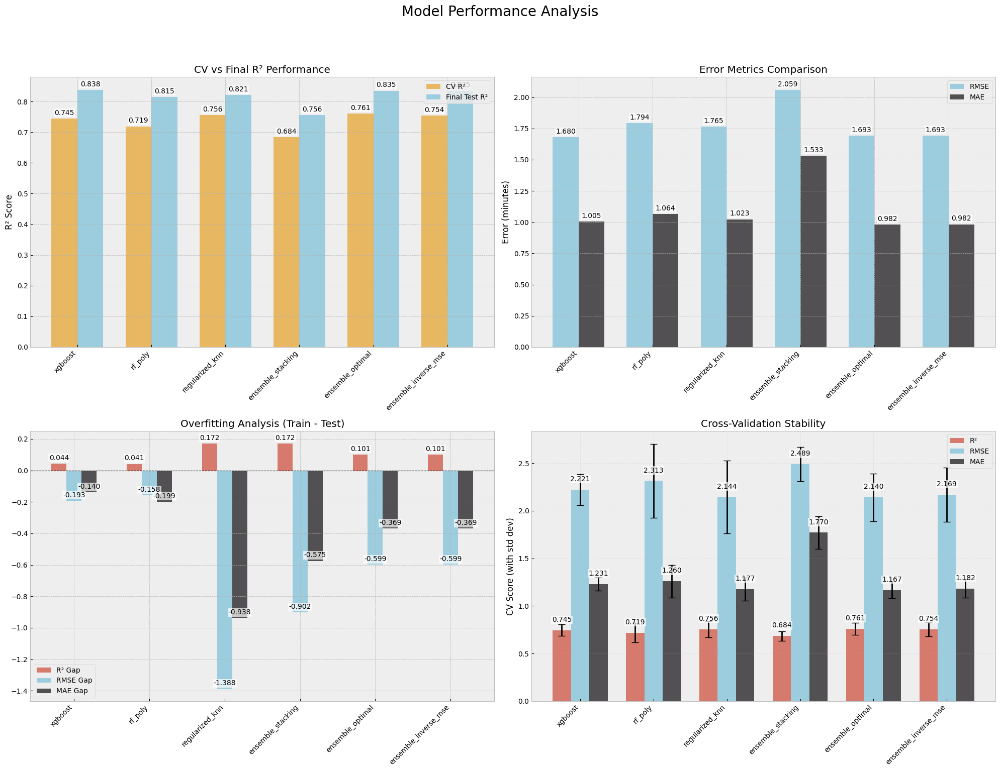

In [319]:
create_comprehensive_plot(model_results)

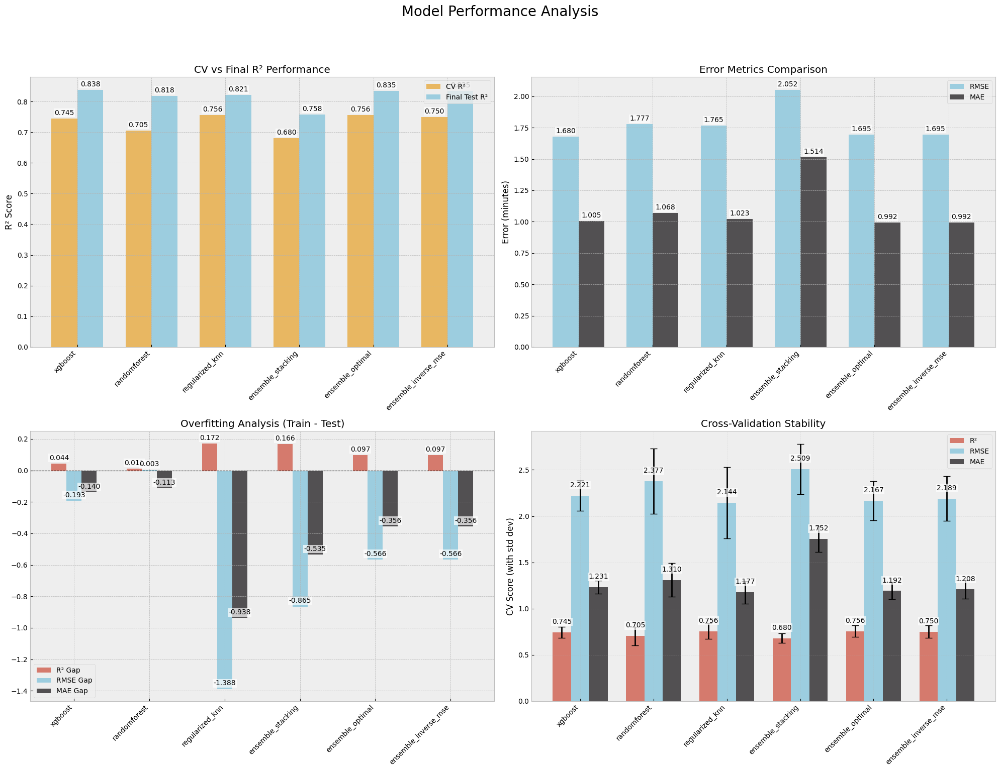

In [303]:
create_comprehensive_plot(model_results)

In [302]:
model_results

{'xgboost': {'model': XGBRegressor(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=0.7776604740668679, device='cuda',
               early_stopping_rounds=None, enable_categorical=False,
               eval_metric=None, feature_types=None, gamma=0.9530478060208746,
               grow_policy=None, importance_type=None,
               interaction_constraints=None, learning_rate=0.012326343232720999,
               max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=10, max_leaves=None,
               min_child_weight=2, missing=nan, monotone_constraints=None,
               multi_strategy=None, n_estimators=1600, n_jobs=None,
               num_parallel_tree=None, random_state=None, ...),
  'cv_performance': {'r2_mean': 0.7446520763347731,
   'r2_std': 0.05980145788911447,
   'rmse_mean': 2.2207113047914224,
   'rmse_std': 0.162463889192908

In [ ]:
# Apply cube transformation to distance feature
X_train['distance'] = np.power(X_train['distance'], 3)
X_test['distance'] = np.power(X_test['distance'], 3)

# Create polynomial features for selected numerical columns
from sklearn.preprocessing import PolynomialFeatures

# Select numerical features for polynomial transformation
poly_features = ['temperature', 'wind_speed', 'cloud_cover', 'temp_range']

# Initialize polynomial transformer
poly = PolynomialFeatures(degree=2, include_bias=False)

# Create polynomial features for training data
poly_train = poly.fit_transform(X_train[poly_features])
poly_feature_names = [f"{col}_poly{i}" for i, col in enumerate(poly.get_feature_names(poly_features)[len(poly_features):])]
poly_train_df = pd.DataFrame(poly_train[:, len(poly_features):], columns=poly_feature_names)
X_train = pd.concat([X_train, poly_train_df], axis=1)

# Create polynomial features for test data
poly_test = poly.transform(X_test[poly_features])
poly_test_df = pd.DataFrame(poly_test[:, len(poly_features):], columns=poly_feature_names)
X_test = pd.concat([X_test, poly_test_df], axis=1)

# Train and evaluate models with polynomial features
model_results = train_and_evaluate_models(
    X_train[default_features + poly_feature_names].values,
    X_test[default_features + poly_feature_names].values,
    y_train,
    y_test,
    cv=5
)


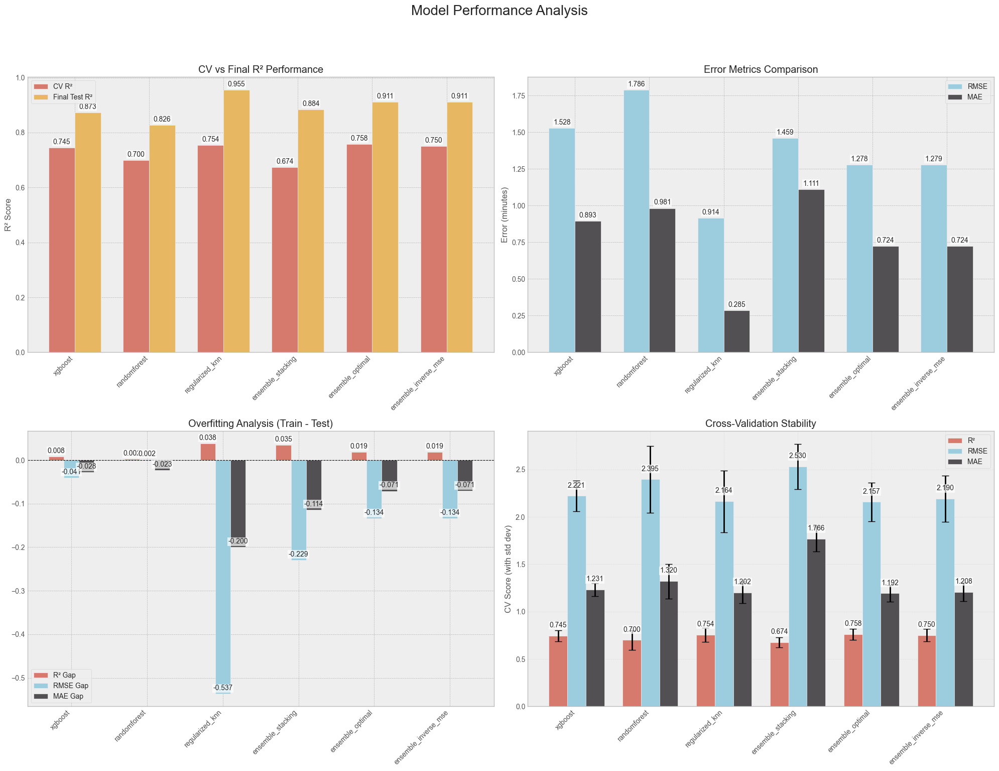

In [271]:
create_comprehensive_plot(model_results)

# Feature Specialized Ensemble

In [310]:
selected_features

['distance',
 'minutes_sin',
 'minutes_cos',
 'month_num_sin',
 'cloud_cover',
 'month_num_cos',
 'temp_range',
 'temperature',
 'wind_speed',
 'day_of_week_cos',
 'day_of_week_sin',
 'duration']

In [334]:
class FeatureSpecializedEnsemble(BaseEstimator, RegressorMixin):
    """
    Specialized ensemble using pre-tuned models for spatial and cyclic temporal features.
    Assumes input data is already scaled.
    """
    
    def __init__(
        self,
        random_state: int = 42
    ):
        # Initialize models with pre-tuned parameters
        self.distance_model = CatBoostRegressor(**catboost)
        self.temporal_model = XGBRegressor(
            **xgb_best_params,
            tree_method='hist',
            random_state=random_state
        )
        self.seasonal_model = RandomForestRegressor(
            **rf_best_params,
            random_state=random_state
        )
        
        # Meta-learner using XGBoost
        self.meta_learner = XGBRegressor(
            **xgb_best_params,
            tree_method='hist',
            random_state=random_state
        )
        
        # Feature groups
        self.feature_groups = {
            'spatial': ['distance'],
            'temporal': ['minutes_sin', 'minutes_cos', 'day_of_week_cos', 'day_of_week_sin'],
            'seasonal': ['month_num_sin', 'month_num_cos']
        }
    
    def _validate_features(self, X: pd.DataFrame) -> None:
        """Validate that all required features are present"""
        required_features = sum(self.feature_groups.values(), [])
        missing_features = set(required_features) - set(X.columns)
        if missing_features:
            raise ValueError(f"Missing features: {missing_features}")
    
    def _prepare_features(self, X: pd.DataFrame) -> Dict[str, np.ndarray]:
        """Prepare feature groups for specialized models"""
        return {
            'spatial': X[self.feature_groups['spatial']].values,
            'temporal': X[self.feature_groups['temporal']].values,
            'seasonal': X[self.feature_groups['seasonal']].values
        }
    
    def fit(self, X: pd.DataFrame, y: np.ndarray) -> 'FeatureSpecializedEnsemble':
        """
        Fit all specialized models and meta-learner
        
        Parameters:
        -----------
        X : pd.DataFrame
            Training features (pre-scaled)
        y : np.ndarray
            Target values
        """
        # Validate features
        self._validate_features(X)
        
        # Prepare features
        features = self._prepare_features(X)
        
        # Fit specialized models
        print("Fitting distance model...")
        self.distance_model.fit(features['spatial'], y)
        
        print("Fitting temporal model...")
        self.temporal_model.fit(features['temporal'], y)
        
        print("Fitting seasonal model...")
        self.seasonal_model.fit(features['seasonal'], y)
        
        # Generate meta-features
        meta_features = self._generate_meta_features(features)
        
        # Fit meta-learner
        print("Fitting meta-learner...")
        self.meta_learner.fit(meta_features, y)
        
        return self
    
    def _generate_meta_features(self, features: Dict[str, np.ndarray]) -> np.ndarray:
        """Generate predictions from specialized models for meta-learning"""
        # Get predictions from each model
        distance_pred = self.distance_model.predict(features['spatial'])
        temporal_pred = self.temporal_model.predict(features['temporal'])
        seasonal_pred = self.seasonal_model.predict(features['seasonal'])
        
        # Combine predictions with original features
        meta_features = np.column_stack([
            distance_pred,
            temporal_pred,
            seasonal_pred,
            features['temporal'],  # Include temporal patterns
            features['seasonal']   # Include seasonal patterns
        ])
        
        return meta_features
    
    def predict(self, X: pd.DataFrame) -> np.ndarray:
        """
        Generate predictions using the ensemble
        
        Parameters:
        -----------
        X : pd.DataFrame
            Features for prediction (pre-scaled)
        
        Returns:
        --------
        np.ndarray
            Predicted values
        """
        # Validate features
        self._validate_features(X)
        
        # Prepare features
        features = self._prepare_features(X)
        
        # Generate meta-features
        meta_features = self._generate_meta_features(features)
        
        # Make final prediction
        predictions = self.meta_learner.predict(meta_features)
        
        return predictions
    
    def get_feature_importance(self) -> Dict[str, float]:
        """Get feature importance from tree-based models"""
        importance = {}
        
        # Get temporal feature importance
        if hasattr(self.temporal_model, 'feature_importances_'):
            for feat, imp in zip(self.feature_groups['temporal'], 
                               self.temporal_model.feature_importances_):
                importance[f'temporal_{feat}'] = imp
        
        # Get seasonal feature importance
        if hasattr(self.seasonal_model, 'feature_importances_'):
            for feat, imp in zip(self.feature_groups['seasonal'],
                               self.seasonal_model.feature_importances_):
                importance[f'seasonal_{feat}'] = imp
        
        return importance

In [335]:
# Train the ensemble
ensemble = FeatureSpecializedEnsemble(random_state=42)
ensemble.fit(X_train[default_features], y_train)

# Make predictions
y_pred_train = ensemble.predict(X_train[default_features])
y_pred_test = ensemble.predict(X_test[default_features])

# Evaluate
metrics = {
    'train_r2': r2_score(y_train, y_pred_train),
    'test_r2': r2_score(y_test, y_pred_test),
    'train_rmse': np.sqrt(mean_squared_error(y_train, y_pred_train)),
    'test_rmse': np.sqrt(mean_squared_error(y_test, y_pred_test)),
    'train_mae': mean_absolute_error(y_train, y_pred_train),
    'test_mae': mean_absolute_error(y_test, y_pred_test)
}

# Print results
print("\nEnsemble Performance:")
print("-" * 50)
for metric, value in metrics.items():
    print(f"{metric}: {value:.4f}")

# Get feature importance
importance = ensemble.get_feature_importance()
print("\nFeature Importance:")
print("-" * 50)
for feature, imp in importance.items():
    print(f"{feature}: {imp:.4f}")

Fitting distance model...
Fitting temporal model...
Fitting seasonal model...
Fitting meta-learner...

Ensemble Performance:
--------------------------------------------------
train_r2: 0.9127
test_r2: 0.8031
train_rmse: 1.2754
test_rmse: 1.8505
train_mae: 0.7629
test_mae: 1.1113

Feature Importance:
--------------------------------------------------
temporal_minutes_sin: 0.4798
temporal_minutes_cos: 0.3904
temporal_day_of_week_cos: 0.0569
temporal_day_of_week_sin: 0.0730
seasonal_month_num_sin: 0.4597
seasonal_month_num_cos: 0.5403


Ensemble Performance:
--------------------------------------------------
train_r2: 0.9924
test_r2: 0.7719
train_rmse: 0.3775
test_rmse: 1.9917
train_mae: 0.0849
test_mae: 1.1164

Feature Importance:
--------------------------------------------------
temporal_minutes_sin: 0.4798
temporal_minutes_cos: 0.3904
temporal_day_of_week_cos: 0.0569
temporal_day_of_week_sin: 0.0730
seasonal_month_num_sin: 0.4597
seasonal_month_num_cos: 0.5403

In [339]:
class FeatureSpecializedEnsemble:
    def analyze_feature_contributions(self):
        """Analyze how each feature group contributes to predictions"""
        contributions = {}
        
        # Get individual model predictions
        spatial_pred = self.distance_model.predict(self.last_features['spatial'])
        temporal_pred = self.temporal_model.predict(self.last_features['temporal'])
        seasonal_pred = self.seasonal_model.predict(self.last_features['seasonal'])
        
        # Calculate correlation with final predictions
        final_pred = self.predict(self.last_features_combined)
        
        contributions['spatial'] = np.corrcoef(spatial_pred, final_pred)[0,1]
        contributions['temporal'] = np.corrcoef(temporal_pred, final_pred)[0,1]
        contributions['seasonal'] = np.corrcoef(seasonal_pred, final_pred)[0,1]
        
        return contributions

    def plot_feature_importance(self):
        """Plot feature importance for each specialized model"""
        plt.figure(figsize=(12, 6))
        
        # Plot temporal importance
        plt.subplot(131)
        temporal_imp = pd.Series(
            self.temporal_model.feature_importances_,
            index=self.feature_groups['temporal']
        ).sort_values()
        temporal_imp.plot(kind='barh')
        plt.title('Temporal Features')
        
        # Plot seasonal importance
        plt.subplot(132)
        seasonal_imp = pd.Series(
            self.seasonal_model.feature_importances_,
            index=self.feature_groups['seasonal']
        ).sort_values()
        seasonal_imp.plot(kind='barh')
        plt.title('Seasonal Features')
        
        # Plot meta-learner importance
        plt.subplot(133)
        meta_features = ['spatial_pred', 'temporal_pred', 'seasonal_pred']
        meta_imp = pd.Series(
            self.meta_learner.feature_importances_,
            index=meta_features
        ).sort_values()
        meta_imp.plot(kind='barh')
        plt.title('Meta-learner Features')
        
        plt.tight_layout()
        plt.show()

Fitting distance model...
Fitting temporal model...
Fitting seasonal model...
Fitting meta-learner...

Feature Group Contributions (correlation with final predictions):
--------------------------------------------------
spatial: 0.8908
temporal: 0.8081
seasonal: -0.0807


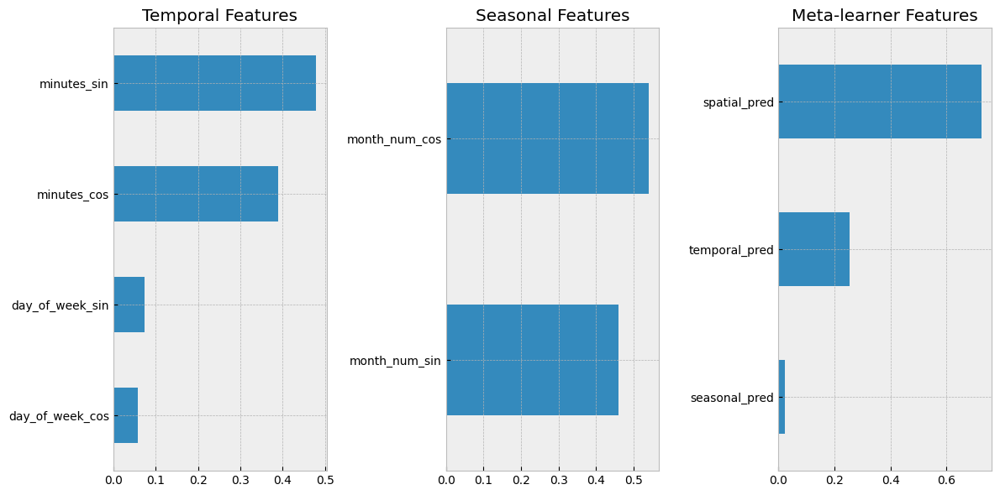

In [346]:
class FeatureSpecializedEnsemble:
    """
    Specialized ensemble using pre-tuned models for spatial and cyclic temporal features.
    """
    
    def __init__(self, random_state: int = 42):
        # Initialize models with pre-tuned parameters
        self.distance_model = RegularizedKNN(**knn_best_params)
        self.temporal_model = XGBRegressor(
            **xgb_best_params,
            tree_method='hist',
            random_state=random_state
        )
        self.seasonal_model = RandomForestRegressor(
            **rf_best_params,
            random_state=random_state
        )
        
        # Meta-learner using XGBoost
        self.meta_learner = XGBRegressor(
            **xgb_best_params,
            tree_method='hist',
            random_state=random_state
        )
        
        # Feature groups
        self.feature_groups = {
            'spatial': ['distance'],
            'temporal': ['minutes_sin', 'minutes_cos', 'day_of_week_cos', 'day_of_week_sin'],
            'seasonal': ['month_num_sin', 'month_num_cos']
        }
    
    def fit(self, X: pd.DataFrame, y: np.ndarray) -> 'FeatureSpecializedEnsemble':
        """
        Fit all specialized models and meta-learner
        """
        # Validate features
        self._validate_features(X)
        
        # Prepare features
        features = self._prepare_features(X)
        
        # Fit specialized models
        print("Fitting distance model...")
        self.distance_model.fit(features['spatial'], y)
        
        print("Fitting temporal model...")
        self.temporal_model.fit(features['temporal'], y)
        
        print("Fitting seasonal model...")
        self.seasonal_model.fit(features['seasonal'], y)
        
        # Generate meta-features
        meta_features = self._generate_meta_features(features)
        
        # Fit meta-learner
        print("Fitting meta-learner...")
        self.meta_learner.fit(meta_features, y)
        
        return self
    
    def _validate_features(self, X: pd.DataFrame) -> None:
        """Validate that all required features are present"""
        required_features = sum(self.feature_groups.values(), [])
        missing_features = set(required_features) - set(X.columns)
        if missing_features:
            raise ValueError(f"Missing features: {missing_features}")
    
    def _prepare_features(self, X: pd.DataFrame) -> Dict[str, np.ndarray]:
        """Prepare feature groups for specialized models"""
        return {
            'spatial': X[self.feature_groups['spatial']].values,
            'temporal': X[self.feature_groups['temporal']].values,
            'seasonal': X[self.feature_groups['seasonal']].values
        }
    
    def _generate_meta_features(self, features: Dict[str, np.ndarray]) -> np.ndarray:
        """Generate predictions from specialized models for meta-learning"""
        # Get predictions from each model
        spatial_pred = self.distance_model.predict(features['spatial'])
        temporal_pred = self.temporal_model.predict(features['temporal'])
        seasonal_pred = self.seasonal_model.predict(features['seasonal'])
        
        # Combine predictions
        meta_features = np.column_stack([
            spatial_pred,
            temporal_pred,
            seasonal_pred
        ])
        
        return meta_features
    
    def predict(self, X: pd.DataFrame) -> np.ndarray:
        """Generate predictions using the ensemble"""
        # Store last features for analysis
        self.last_features = {
            'spatial': X[self.feature_groups['spatial']].values,
            'temporal': X[self.feature_groups['temporal']].values,
            'seasonal': X[self.feature_groups['seasonal']].values
        }
        self.last_features_combined = X
        
        # Get predictions from specialized models
        spatial_pred = self.distance_model.predict(self.last_features['spatial'])
        temporal_pred = self.temporal_model.predict(self.last_features['temporal'])
        seasonal_pred = self.seasonal_model.predict(self.last_features['seasonal'])
        
        # Generate meta-features
        meta_features = np.column_stack([
            spatial_pred,
            temporal_pred,
            seasonal_pred
        ])
        
        # Make final prediction
        return self.meta_learner.predict(meta_features)
    
    def analyze_feature_contributions(self):
        """Analyze how each feature group contributes to predictions"""
        contributions = {}
        
        # Get individual model predictions
        spatial_pred = self.distance_model.predict(self.last_features['spatial'])
        temporal_pred = self.temporal_model.predict(self.last_features['temporal'])
        seasonal_pred = self.seasonal_model.predict(self.last_features['seasonal'])
        
        # Calculate correlation with final predictions
        final_pred = self.predict(self.last_features_combined)
        
        contributions['spatial'] = np.corrcoef(spatial_pred, final_pred)[0,1]
        contributions['temporal'] = np.corrcoef(temporal_pred, final_pred)[0,1]
        contributions['seasonal'] = np.corrcoef(seasonal_pred, final_pred)[0,1]
        
        return contributions
    
    def plot_feature_importance(self):
        """Plot feature importance for each specialized model"""
        plt.figure(figsize=(12, 6))
        
        # Plot temporal importance
        plt.subplot(131)
        temporal_imp = pd.Series(
            self.temporal_model.feature_importances_,
            index=self.feature_groups['temporal']
        ).sort_values()
        temporal_imp.plot(kind='barh')
        plt.title('Temporal Features')
        
        # Plot seasonal importance
        plt.subplot(132)
        seasonal_imp = pd.Series(
            self.seasonal_model.feature_importances_,
            index=self.feature_groups['seasonal']
        ).sort_values()
        seasonal_imp.plot(kind='barh')
        plt.title('Seasonal Features')
        
        # Plot meta-learner importance
        plt.subplot(133)
        meta_features = ['spatial_pred', 'temporal_pred', 'seasonal_pred']
        meta_imp = pd.Series(
            self.meta_learner.feature_importances_,
            index=meta_features
        ).sort_values()
        meta_imp.plot(kind='barh')
        plt.title('Meta-learner Features')
        
        plt.tight_layout()
        plt.show()

# Now try it:
ensemble = FeatureSpecializedEnsemble(random_state=42)
ensemble.fit(X_train[default_features], y_train)

# Make some predictions (this will store the features for analysis)
_ = ensemble.predict(X_test[default_features])

# Analyze feature contributions
contributions = ensemble.analyze_feature_contributions()
print("\nFeature Group Contributions (correlation with final predictions):")
print("-" * 50)
for group, corr in contributions.items():
    print(f"{group}: {corr:.4f}")

# Plot feature importance for all models
ensemble.plot_feature_importance()

Hybrid XGBoost-Kalman Performance:
--------------------------------------------------
train_r2: 0.9367
test_r2: 0.7606
train_rmse: 1.0865
test_rmse: 2.0406
train_mae: 0.6368
test_mae: 1.2311